# Código utilizado para o trabalho final da disciplina INF-0619 da Edição #10 do Curso de Mineração de Dados Complexos do IC-UNICAMP

# Grupo G14 
* Amir Carlessi 
* Erika Midori Kato
* Fábio Seitoku Nagamine
* Marcelo Cesar Cirelo
* Marcos Flavio Hieda

# Parte 0: Dados

Pasta compartilhada com todos os dados usados neste Notebook: 

https://drive.google.com/drive/folders/12YP4XdpIRiqZyTtdyrqAxShg5-sflsiU

No link acima, clicar na opção 'Adicionar atalho ao Google Drive' e selecionar a pasta 'MyDrive' do seu Google Drive.

# Parte 1: Preparação do Ambiente e Separação dos Dados

## 1.1) Bibliotecas e Google Drive (favor executar)

In [ ]:
# Bibliotecas usadas nessa e nas demais partes do notebook

import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import optimizers, regularizers, initializers
import random

In [ ]:
# Para rodar o notebook, é necessário criar um link para a pasta abaixo:
# https://drive.google.com/drive/folders/12YP4XdpIRiqZyTtdyrqAxShg5-sflsiU

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 1.2) Funções Auxiliares (favor executar)

### 1.2.1) Funções usadas no treino das CNN

In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import csv

# retorna dois valores: peso da classe 0 e o da classe 1
# percentuais desejados = [.5, .5] -> indica 50% para cada classe
def calculaPesos(percentuaisDesejados, y_train):
    classes , count = np.unique(y_train, return_counts=True)

    count_total = count[0] + count[1]

    perc_classe_0 = count[0]/count_total
    perc_classe_1 = 1 - perc_classe_0

    return round(percentuaisDesejados[0]/perc_classe_0, 2), round(percentuaisDesejados[1]/perc_classe_1, 2)

def createTrainValGenerators(data_generator,
                             pastaTreinamentoParam = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//train',
                             pastaValidacaoParam = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//val',
                             batchSize = 64):

  train_generator_pre_processing = data_generator.flow_from_directory(
        pastaTreinamentoParam,
        target_size=(224, 224),
        batch_size=batchSize,
        class_mode='categorical',
        shuffle=True)

  val_generator_pre_processing = data_generator.flow_from_directory(
        pastaValidacaoParam,
        target_size=(224, 224),
        batch_size=batchSize,
        class_mode='categorical',
        shuffle=True)
  
  return train_generator_pre_processing, val_generator_pre_processing

def setAndTrainModel(model, 
                     train_generator, 
                     val_generator,
                     class_weights = {0: 1, 1: 1}, 
                     optimizerParam = tf.keras.optimizers.SGD(learning_rate=0.0001, momentum=0.5, nesterov=True),
                     qtdEpocas = 25,
                     useClassWeights = False,
                     useEarlyStop = True,
                     useL2Regularizer = False,
                     l2 = 0.01,
                     setModel = True):

  #se não passamos um modelo pronto, model_finetunning = model, caso contrário ele precisa ser 'montado', o que ocorre quando setModel = True
  model_finetunning = model

  if setModel:  
    for layer in model.layers:
      layer.trainable = True

    if useL2Regularizer:
      model_finetunning = tf.keras.Sequential([
        model,
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(2, activation='softmax', kernel_regularizer=keras.regularizers.l2(l2))
      ]) 

    else:
      model_finetunning = tf.keras.Sequential([
        model,
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(2, activation='softmax')
      ]) 

  # Early Stopping
  if useEarlyStop:
    early = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)
  else:
    early = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=qtdEpocas, restore_best_weights=True)

  lossFunction = keras.losses.CategoricalCrossentropy()

  model_finetunning.compile(loss=lossFunction, optimizer=optimizerParam, metrics=['accuracy'])

  if( useClassWeights ):
    print(class_weights)
    model_finetunning.fit(train_generator, epochs=qtdEpocas, callbacks=[early],
                    validation_data=val_generator, class_weight = class_weights)
  else:
   model_finetunning.fit(train_generator, epochs=qtdEpocas, callbacks=[early],
                    validation_data=val_generator) 
  
  return  model_finetunning

def printImages(imagens):
  #itera sobre as imgens de Treino e mostra 9
  for images, labels in imagens.take(1):
    for i in range(9):
      ax = plt.subplot(3, 3, i + 1)
      plt.imshow(images[i].numpy().astype("uint8"))
      label = labels[i]
      
      if label == 0:
        plt.title("Empresa")
      else:
        plt.title("Não Empresa")
      
      plt.axis("off")

### 1.2.2) Demais funções auxiliares

In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import csv

import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

def carregar_dados_tabulares():
  names = ['Arquivo', 'cep', 'regiao', 'subregiao', 'setor','subsetor','divisorsubsetor','sufixodist','GroundTruth']
  df_tst = pd.read_csv("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//random_forest//dados_tabulares_por_arquivo.csv", names=names, sep='\;')
  df_tst = df_tst.drop(labels=0, axis=0)
  return df_tst

# Função auxiliar para desenhar matriz de confusão balanceada
def matrizConfusao(yReal, yPred, ax, titulo=''):
  conf_m = confusion_matrix(yReal, yPred, normalize='true')
  cm_dis = ConfusionMatrixDisplay(confusion_matrix=conf_m, display_labels=['Empresa','Não Emp.'])
  cm_dis.plot(ax=ax, cmap='plasma')
  ax.grid(False)
  if titulo != '':
    ax.set_title(titulo)
  return(ax)

def calculaMetricas2(actuPair, predPair, ohe=True):

  if ohe:
    actu = np.argmax(actuPair, axis=1)
    pred = np.argmax(predPair, axis=1)
    auc1 = roc_auc_score(actuPair[:,0], predPair[:,0])
    auc2 = roc_auc_score(actuPair[:,1], predPair[:,1])
    auc = (auc1 + auc2)/2
  else:
    actu = actuPair
    pred = predPair
    auc = roc_auc_score(actuPair, predPair)
  
  acu = balanced_accuracy_score(actu, pred)
  print('AUC-ROC:', str(auc))
  print('ACU-BAL:', str(acu))


def calculaMetricas(arquivoCSV, ax=None, title=''):

  actual = []
  predic = []
  actu_ohe1 = []
  actu_ohe2 = []
  pred_ohe1 = []
  pred_ohe2 = []

  with open(arquivoCSV, newline='') as csvfile:
    reader = csv.DictReader(csvfile)
    for row in reader:
      actu_ohe1.append(float(row['GT_OHE_1']))
      actu_ohe2.append(float(row['GT_OHE_2']))
      pred_ohe1.append(float(row['Pred_OHE_1']))
      pred_ohe2.append(float(row['Pred_OHE_2']))
    
      if (row['Ground_truth'] == 'imagens_empresas'):
        actual.append(1)
      else:
        actual.append(0)
      if (row['Predicted'] == 'imagens_empresas'):
        predic.append(1)
      else:
        predic.append(0)

    auc1 = roc_auc_score(actu_ohe1, pred_ohe1)
    auc2 = roc_auc_score(actu_ohe2, pred_ohe2)
    acur = balanced_accuracy_score(actual, predic)

    print('AUC-ROC:', str((auc1+auc2)/2))
    print('ACU-BAL:', str(acur))

    if (ax != None):
      matrizConfusao(actual, predic, ax, title)


import csv

def salvaPredicted(pathValSet, pathRede, pathResult, imageDataGenerator, predicted=None):
  if (pathRede != None):
    model = tf.keras.models.load_model(pathRede)

  validacao_gravar = imageDataGenerator.flow_from_directory(
        pathValSet,
        target_size=(224, 224),
        batch_size=1,
        class_mode='categorical',
        shuffle=False)
  qtdImagens = len(validacao_gravar.filenames)
  groundTruth = list(map(lambda x: x.split('/'), validacao_gravar.filenames))
  gdTruth_OHE = list(map(lambda x: [1,0] if x[0] == 'imagens_empresas' else [0,1] , groundTruth))

  if (pathRede != None):
    predicted = model.predict(validacao_gravar, steps=qtdImagens)

  predictions = list(map(lambda x: ['imagens_empresas','imagens_nao_empresas'][np.argmax(x)], predicted))

  result = [(x[1], x[0], y, w[0], w[1], z[0], z[1]) for x, y, w, z in zip(groundTruth, predictions, gdTruth_OHE, predicted)] 

  with open(pathResult, 'w', newline='') as arquivo:
    writer = csv.writer(arquivo)
    writer.writerow(['Arquivo', 'Ground_truth', 'Predicted', 'GT_OHE_1', 'GT_OHE_2', 'Pred_OHE_1', 'Pred_OHE_2'])
    for r in result:
      writer.writerow(r)

def salvaPredict2(y_val, y_pred, ids, pathResult):

  classes = ["imagens_nao_empresas", "imagens_empresas"]
  result = [(str(id)+".jpg", classes[int(val)], classes[int(scor)], valOHE1, valOHE2, scorOHE1, scorOHE2) for id, val, scor, valOHE1, valOHE2, scorOHE1, scorOHE2 in zip(ids, y_val, y_pred, y_val, (1 - y_val), y_pred, (1 - y_pred))] 

  with open(pathResult, 'w', newline='') as arquivo:
    writer = csv.writer(arquivo)
    writer.writerow(['Arquivo', 'Ground_truth', 'Predicted', 'GT_OHE_1', 'GT_OHE_2', 'Pred_OHE_1', 'Pred_OHE_2'])
    for r in result:
      writer.writerow(r)

def retornaPreds(arquivoCSV, retornaGroundTruth=False, retornaIDs=False):
  ids = []
  pred_ohe1 = []
  pred_ohe2 = []
  trut_ohe1 = []
  trut_ohe2 = []

  with open(arquivoCSV, newline='') as csvfile:
    reader = csv.DictReader(csvfile)
    for row in reader:
      pred_ohe1.append(float(row['Pred_OHE_1']))
      pred_ohe2.append(float(row['Pred_OHE_2']))
      if (retornaGroundTruth):
        trut_ohe1.append(float(row['GT_OHE_1']))
        trut_ohe2.append(float(row['GT_OHE_2']))
      if (retornaIDs):
        ids.append(row['Ground_truth']+row['Arquivo'])

  if (retornaGroundTruth):
    return (pred_ohe1, pred_ohe2, trut_ohe1, trut_ohe2)
  if (retornaIDs):
    return (ids, pred_ohe1, pred_ohe2)
  return (pred_ohe1, pred_ohe2)

## 1.3) Verificação inicial dos dados fornecidos

(navegando no Google Drive, já foi possível verificar que a maioria dos arquivos é *.jpg)

### 1.3.1) Listando conteúdo disponibilizado

In [ ]:
!echo -ne 'imagens_empresas:     '
!ls '//content//drive//MyDrive//MDC 010 - INF0619 - Identificação de Empresas Fantasmas//imagens_empresas'     | grep -c .jpg
!echo -ne 'imagens_nao_empresas: '
!ls '//content//drive//MyDrive//MDC 010 - INF0619 - Identificação de Empresas Fantasmas//imagens_nao_empresas' | grep -c .jpg
!echo ''
!echo '----------------------------------------'
!echo 'Arquivos sem ".jpg" no nome:'
!echo '----------------------------------------'
!find '//content//drive//MyDrive//MDC 010 - INF0619 - Identificação de Empresas Fantasmas//imagens_empresas' -type f | grep -v .jpg
!find '//content//drive//MyDrive//MDC 010 - INF0619 - Identificação de Empresas Fantasmas//imagens_empresas' -type f | grep -v .jpg

imagens_empresas:     4547
imagens_nao_empresas: 6457

----------------------------------------
Arquivos sem ".jpg" no nome:
----------------------------------------
//content//drive//MyDrive//MDC 010 - INF0619 - Identificação de Empresas Fantasmas//imagens_empresas/Thumbs.db
//content//drive//MyDrive//MDC 010 - INF0619 - Identificação de Empresas Fantasmas//imagens_empresas/dados_empresas.csv
//content//drive//MyDrive//MDC 010 - INF0619 - Identificação de Empresas Fantasmas//imagens_empresas/Thumbs.db
//content//drive//MyDrive//MDC 010 - INF0619 - Identificação de Empresas Fantasmas//imagens_empresas/dados_empresas.csv


### 1.3.2) Verificando lista de imagens

In [ ]:
pastaDrive = '//content//drive//MyDrive//MDC 010 - INF0619 - Identificação de Empresas Fantasmas'
formatoImg = (256,256) # Esse é o valor 'default' da ferramenta. Depois precisamos decidir qual o tamanho iremos usar.

imagens = tf.keras.preprocessing.image_dataset_from_directory(pastaDrive, image_size=formatoImg)

contaEmpresas    = sum('imagens_empresas' in arquivo for arquivo in imagens.file_paths)
contaNaoEmpresas = sum('imagens_nao_empresas' in arquivo for arquivo in imagens.file_paths)
contaTotais      = len(imagens.file_paths)

Found 11004 files belonging to 2 classes.


In [ ]:
print('Classes:', imagens.class_names)
print('Empresas    :', np.round(100*contaEmpresas/contaTotais,2))
print('Não-empresas:', np.round(100*contaNaoEmpresas/contaTotais,2))
print('Total      :', len(imagens.file_paths))
print()
print('Formato entradas (imagem):', imagens.element_spec[0].shape, imagens.element_spec[0].dtype)
print('Formato saída    (classe):', imagens.element_spec[1].shape, imagens.element_spec[1].dtype)

Classes: ['imagens_empresas', 'imagens_nao_empresas']
Empresas    : 41.32
Não-empresas: 58.68
Total      : 11004

Formato entradas (imagem): (None, 256, 256, 3) <dtype: 'float32'>
Formato saída    (classe): (None,) <dtype: 'int32'>


In [ ]:
# Esse código demora para rodar, e precisa ser executado somente uma vez.
# Por isso está comentado (para que não seja rodado desnecessariamente)

#!apt-get install libmagic-dev
#!pip install python-magic
#import magic

#formatoEsperado = '640x500'
#qtdFormatoEsperado = 0
#qtdOutrosFormatos  = 0

#for img in imagens.file_paths:
#  info = magic.from_file(img).replace(' ','').split(',')
#  if (info[7] != formatoEsperado):
#    qtdOutrosFormatos += 1
#    print(info[7])
#  else:
#    qtdFormatoEsperado += 1

In [ ]:
print('Quantidade de imagens no formato', formatoEsperado, ':', qtdFormatoEsperado)
print('Quantidade de imagens em outros formatos :', qtdOutrosFormatos)

Quantidade de imagens no formato 640x500 : 11004
Quantidade de imagens em outros formatos : 0


### 1.3.3) Verificando dados tabulares

In [ ]:
dadosEmpresas    = pd.read_csv(pastaDrive + '//imagens_empresas//dados_empresas.csv')
dadosNaoEmpresas = pd.read_csv(pastaDrive + '//imagens_nao_empresas//dados_nao_empresas.csv')

In [ ]:
print(len(dadosEmpresas))
dadosEmpresas.head()

8000


,Unnamed: 0,Nome_Fantasia,Tipo_Logradouro,Nome_Logradouro,Numero_Logradouro,CEP,Municipio,Regime_Apuracao,endereco_completo
0,0,FERMACON MATERIAIS PARA CONSTRUÇÃO,AVENIDA,FREI ORESTES GIRARDI,2477,12460000,CAMPOS DO JORDAO,NORMAL - REGIME PERIÓDICO DE APURAÇÃO,"AVENIDA FREI ORESTES GIRARDI, 2477, 12460000, ..."
1,1,QUIRINO AUTOMOVEIS,AVENIDA,DO RIO BONITO,1431,4776002,SAO PAULO,NORMAL - REGIME PERIÓDICO DE APURAÇÃO,"AVENIDA DO RIO BONITO, 1431, 04776002, SAO PAULO"
2,2,GINO CALÇALDOS,RUA,PADRE ROQUE,199,13800033,MOGI MIRIM,NORMAL - REGIME PERIÓDICO DE APURAÇÃO,"RUA PADRE ROQUE, 199, 13800033, MOGI MIRIM"
3,3,NaN,RUA,DR. AMERICO FIGUEIREDO,108,18055131,SOROCABA,NORMAL - REGIME PERIÓDICO DE APURAÇÃO,"RUA DR. AMERICO FIGUEIREDO, 108, 18055131, SOR..."
4,4,NaN,RUA,VISCONDE DE INHAUMA,1600A,14025100,RIBEIRAO PRETO,NORMAL - REGIME PERIÓDICO DE APURAÇÃO,"RUA VISCONDE DE INHAUMA, 1600A, 14025100, RIBE..."


## 1.4) Proposta de separação de dados em treinamento, validação e teste

A separação foi realizada usando a função `splitfolders.ratio` com o parâmetros `seed = 42` e `ratio=(.6, .2, .2)`.

Os dados já separados estão na pasta 'split_train_val_test' do Drive compartilhado.

### 1.4.1) Visualizando alguns dados após separação dos conjuntos

In [ ]:
pastaTreinamento = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//train'
pastaValidacao   = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//val'
pastaTeste       = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//test'

In [ ]:
#obtendo dataset a partir dos dados já separados entre Treinamento, Validacao e Teste
batch_size = 32
formatoImg = (224,224)

#dataset de treinamento
imagens_train = tf.keras.preprocessing.image_dataset_from_directory(pastaTreinamento, 
                                                                    image_size=formatoImg, 
                                                                    batch_size = batch_size,
                                                                    seed=123,
                                                                    shuffle = True,
                                                                    label_mode ='categorical'
                                                                    )

#dataset de treinamento
imagens_val = tf.keras.preprocessing.image_dataset_from_directory(pastaValidacao, 
                                                                    image_size=formatoImg, 
                                                                    batch_size = batch_size,
                                                                    seed=123,
                                                                    label_mode ='categorical',
                                                                    shuffle = True)


Found 6602 files belonging to 2 classes.
Found 2200 files belonging to 2 classes.



##IMAGENS TREINO##


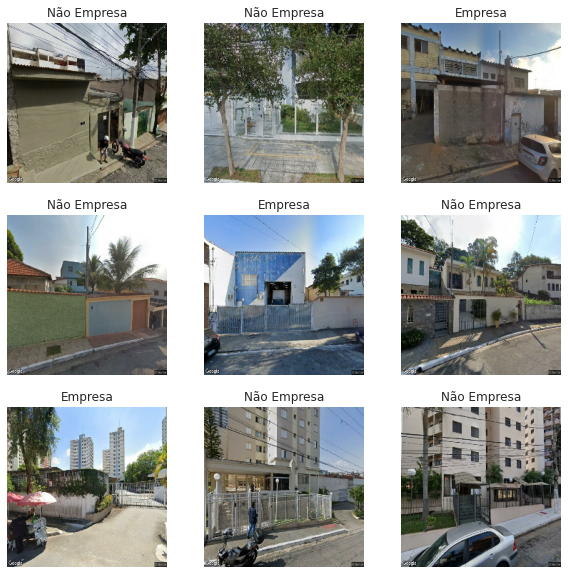

In [ ]:
plt.figure(num=0, figsize=(10, 10))

print("")
print("##IMAGENS TREINO##")

printImages(imagens_train)


##IMAGENS VALIDAÇÃO##


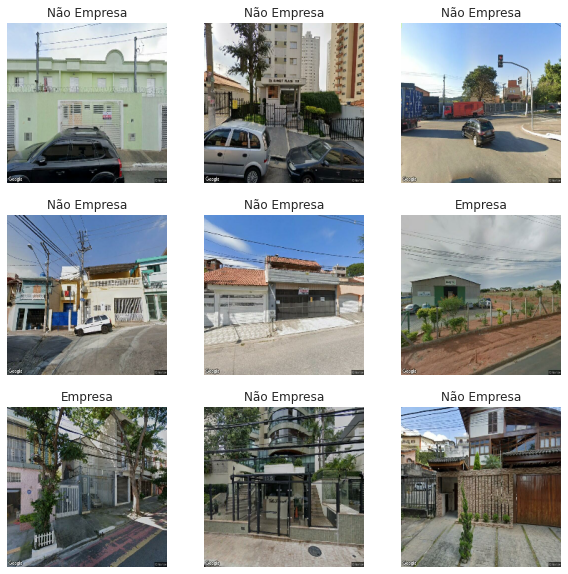

In [ ]:
print("##IMAGENS VALIDAÇÃO##")

plt.figure(num=1, figsize=(10, 10))

printImages(imagens_val)

## 1.5) Copiando arquivos do drive para pasta 'local'

- Copia dados do Drive para a pasta 'local' do Colab (`//content`)
- A maior parte do código aponta para a pasta `//content`
- Isso serve para evitar o tempo adicional necessário no acesso ao Google Drive

In [ ]:
# Copiando base de dados previamente separada conforme seção 1.4
# Os arquivos foram compactados para facilitar a cópia
!cp /content/drive/MyDrive/INF0619_G14_Dados_Empresas_Fantasmas/split_train_val_test/*gz /content/

In [ ]:
# Descompactando arquivos copiados localmente
!gunzip /content/*gz
!tar -xvf /content/t_e.tar > /dev/null
!tar -xvf /content/t_n.tar > /dev/null
!tar -xvf /content/v_e.tar > /dev/null
!tar -xvf /content/v_n.tar > /dev/null
!tar -xvf /content/s_e.tar > /dev/null
!tar -xvf /content/s_n.tar > /dev/null
!tar -xvf /content/a_e.tar > /dev/null
!tar -xvf /content/a_n.tar > /dev/null

In [ ]:
# Verificando se todos os arquivos foram copiados com sucesso

# train:  6602
# val:    2200
# test:   2202
# aumen: 21857 (o treino aumentado JÁ INCLUI OS ARQUIVOS DO TREINO NORMAL)
!ls -R train | grep jpg | wc -l
!ls -R val   | grep jpg | wc -l
!ls -R test  | grep jpg | wc -l
!ls -R train_aumentado | grep jpg | wc -l

6602
2200
2202
21857


# Parte 2: Modelos usando imagens

## 2.1) Baselines

### 2.1.1) Modelo inicial

In [ ]:
random.seed(42)

In [ ]:
def compileAndTrainModel(model, train, val, batchSize=32, epochs=10):
  model.compile(optimizer=tf.keras.optimizers.Adam(0.001),
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['accuracy'])
  
  model_history = model.fit(train,
                            epochs=epochs, 
                            batch_size=batchSize, 
                            validation_data=val)
  return model_history

In [ ]:
#Baseline sem Camada densa de 64 neurônios
model = tf.keras.Sequential()

model.add(layers.Conv2D(15, 3, padding='valid', activation='relu', input_shape=(224, 224, 3)))

model.add(layers.MaxPooling2D(pool_size=(2,2)))

model.add(layers.Flatten())

# Densa com 2 nós de saída
model.add(layers.Dense(2, activation='softmax'))


model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 222, 222, 15)      420       
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 111, 111, 15)     0         
 2D)                                                             
                                                                 
 flatten_5 (Flatten)         (None, 184815)            0         
                                                                 
 dense_5 (Dense)             (None, 2)                 369632    
                                                                 
Total params: 370,052
Trainable params: 370,052
Non-trainable params: 0
_________________________________________________________________


### 2.1.2) CNN Simples com Imagens Carregadas em Memória

In [ ]:
#normalizando entre 0-1
layer_normalizacao = layers.Rescaling(1./255)

imagens_train_normalizadas = imagens_train.map(lambda x, y: (layer_normalizacao(x), y))
imagens_val_normalizadas = imagens_val.map(lambda x, y: (layer_normalizacao(x), y))

In [ ]:
#carregando em memória
AUTOTUNE = tf.data.AUTOTUNE

train = imagens_train_normalizadas.cache().prefetch(buffer_size=AUTOTUNE)
val = imagens_val_normalizadas.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
compileAndTrainModel(model, train, val, batchSize = 128, epochs = 20)

Epoch 1/20
207/207 [==============================] - 15s 69ms/step - loss: 1.1362 - accuracy: 0.6569 - val_loss: 0.5798 - val_accuracy: 0.6964
Epoch 2/20
207/207 [==============================] - 3s 14ms/step - loss: 0.4409 - accuracy: 0.7992 - val_loss: 0.6310 - val_accuracy: 0.6677
Epoch 3/20
207/207 [==============================] - 3s 14ms/step - loss: 0.2671 - accuracy: 0.9067 - val_loss: 0.7317 - val_accuracy: 0.6486
Epoch 4/20
207/207 [==============================] - 3s 14ms/step - loss: 0.1941 - accuracy: 0.9374 - val_loss: 0.8023 - val_accuracy: 0.6518
Epoch 5/20
207/207 [==============================] - 3s 14ms/step - loss: 0.1775 - accuracy: 0.9393 - val_loss: 0.8468 - val_accuracy: 0.7041
Epoch 6/20
207/207 [==============================] - 3s 14ms/step - loss: 0.1249 - accuracy: 0.9620 - val_loss: 1.1406 - val_accuracy: 0.6777
Epoch 7/20
207/207 [==============================] - 3s 14ms/step - loss: 0.0750 - accuracy: 0.9830 - val_loss: 0.8421 - val_accuracy: 0.684

In [ ]:
model.save('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//baseline.rede')

INFO:tensorflow:Assets written to: //content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//baseline.rede/assets


### 2.1.3) Baseline - resnet50 congelada

In [ ]:
model = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))
transfer_model = tf.keras.Sequential([
  model,
  tf.keras.layers.GlobalAveragePooling2D(),
  tf.keras.layers.Dense(2)
])

# Reduzindo a taxa de aprendizado
sgd = tf.keras.optimizers.SGD(learning_rate=0.0001, momentum=0.9, decay=0.001, nesterov=True)

transfer_model.compile(optimizer=sgd,
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

transfer_model.fit(train, epochs=20, validation_data=val, verbose=True)

94781440/94765736 [==============================] - 1s 0us/step
Epoch 1/20
221/221 [==============================] - 48s 186ms/step - loss: 0.5404 - accuracy: 0.7269 - val_loss: 2.6592 - val_accuracy: 0.4179
Epoch 2/20
221/221 [==============================] - 39s 178ms/step - loss: 0.3890 - accuracy: 0.8300 - val_loss: 2.1024 - val_accuracy: 0.4179
Epoch 3/20
221/221 [==============================] - 39s 179ms/step - loss: 0.3326 - accuracy: 0.8613 - val_loss: 0.9536 - val_accuracy: 0.4957
Epoch 4/20
221/221 [==============================] - 40s 179ms/step - loss: 0.2959 - accuracy: 0.8809 - val_loss: 0.4991 - val_accuracy: 0.7848
Epoch 5/20
221/221 [==============================] - 40s 179ms/step - loss: 0.2686 - accuracy: 0.8979 - val_loss: 0.4534 - val_accuracy: 0.8035
Epoch 6/20
221/221 [==============================] - 39s 179ms/step - loss: 0.2469 - accuracy: 0.9088 - val_loss: 0.3992 - val_accuracy: 0.8285
Epoch 7/20
221/221 [==============================] - 39s 179ms/s

In [ ]:
transfer_model.save('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//Congeladas//resnet50_congelada_seed42.rede')

In [ ]:
genR = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input)
salvaPredicted('//content//test', '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//Congeladas//resnet50_congelada_seed42.rede',
               '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Conjunto_de_Teste//resnet50_congelada_42_tst.csv',
               genR)

Found 2202 images belonging to 2 classes.


AUC-ROC: 0.8970530089414828
ACU-BAL: 0.8167341133803543


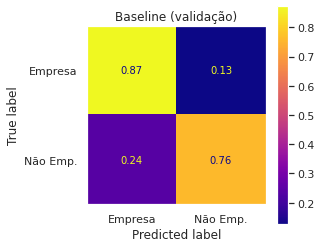

In [ ]:
fig, ax = plt.subplots(figsize=(4,4))
calculaMetricas('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Conjunto_de_Validacao//resnet50_congelada_42_val.csv', ax, 'Baseline (validação)')

### 2.1.3) CNN Simples (com `ImageDataGenerator`)

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator()
train_generator, val_generator = createTrainValGenerators(data_generator)

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


In [ ]:
compileAndTrainModel(model, train_generator, val_generator, batchSize = 128, epochs = 20)

Epoch 1/20
104/104 [==============================] - 50s 480ms/step - loss: 195.0052 - accuracy: 0.6416 - val_loss: 8.5969 - val_accuracy: 0.7250
Epoch 2/20
104/104 [==============================] - 49s 476ms/step - loss: 3.5555 - accuracy: 0.8246 - val_loss: 6.5629 - val_accuracy: 0.7318
Epoch 3/20
104/104 [==============================] - 50s 479ms/step - loss: 0.7716 - accuracy: 0.9293 - val_loss: 6.7832 - val_accuracy: 0.7214
Epoch 4/20
104/104 [==============================] - 49s 475ms/step - loss: 0.4285 - accuracy: 0.9567 - val_loss: 9.5492 - val_accuracy: 0.7164
Epoch 5/20
104/104 [==============================] - 49s 473ms/step - loss: 0.2813 - accuracy: 0.9715 - val_loss: 7.1865 - val_accuracy: 0.7264
Epoch 6/20
104/104 [==============================] - 49s 476ms/step - loss: 0.2759 - accuracy: 0.9767 - val_loss: 7.0353 - val_accuracy: 0.7255
Epoch 7/20
104/104 [==============================] - 49s 475ms/step - loss: 0.1503 - accuracy: 0.9877 - val_loss: 8.3075 - val_

In [ ]:
model.save('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//baseline2_seed42.rede')

INFO:tensorflow:Assets written to: //content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//baseline2_seed42.rede/assets


## 2.2) MODELO DE EXTRAÇÃO DE FEATURES - SVM

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import balanced_accuracy_score

In [ ]:
#extração de features
model = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))

# Congela camadas pré-treinadas
for layer in model.layers:
    layer.trainable = False

extrator_feat_model = tf.keras.Sequential([
  model,
  tf.keras.layers.GlobalAveragePooling2D()
])

94781440/94765736 [==============================] - 0s 0us/step


In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input)

train_generator_pre_processing, val_generator_pre_processing = createTrainValGenerators(data_generator=data_generator, 
                                                                                        batchSize=32, 
                                                                                        pastaTreinamentoParam="//content//train",
                                                                                        pastaValidacaoParam="//content//val"
                                                                                        )

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


In [ ]:
y_train = train_generator_pre_processing.labels
train_feat = extrator_feat_model.predict(train_generator_pre_processing)

In [ ]:
y_val = val_generator_pre_processing.labels
val_feat = extrator_feat_model.predict(val_generator_pre_processing)

In [ ]:
c_param = 0.01
gamma_param = 0.01

clf_svm = SVC(kernel='rbf', C=c_param, gamma=gamma_param)
clf_svm.fit(train_feat, y_train)

#aplicando o modelo ao conjunto de treino
y_train_predicted = clf_svm.predict(train_feat)
acc_train = balanced_accuracy_score(y_train, y_train_predicted)

print("Acurácia balanceada Train --> ", str(acc_train))

y_val_predicted = clf_svm.predict(val_feat)
acc_val = balanced_accuracy_score(y_val, y_val_predicted)

print("Acurácia balanceada Val --> ", str(acc_val))

Acurácia balanceada Train -->  0.5
Acurácia balanceada Val -->  0.5


## 2.3) FINE TUNNING - ResNet50, VGG16, Xception, VGG19 e ResNet101 - Conj. Treino Original



### 2.3.1) Seed 51

In [ ]:
random.seed(51)

In [ ]:
#hiperparametros
lr = 0.0001
momentum = 0.5

#### 2.3.1.1) ResNet50

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator)

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


In [ ]:
model_resnet50 = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))

model = setAndTrainModel(model_resnet50, train_generator, val_generator)

94781440/94765736 [==============================] - 1s 0us/step
Epoch 1/25
104/104 [==============================] - 2260s 22s/step - loss: 0.7528 - accuracy: 0.5963 - val_loss: 0.6922 - val_accuracy: 0.6182
Epoch 2/25
104/104 [==============================] - 69s 665ms/step - loss: 0.6472 - accuracy: 0.6506 - val_loss: 0.5970 - val_accuracy: 0.6873
Epoch 3/25
104/104 [==============================] - 69s 662ms/step - loss: 0.5925 - accuracy: 0.6884 - val_loss: 0.5502 - val_accuracy: 0.7268
Epoch 4/25
104/104 [==============================] - 69s 661ms/step - loss: 0.5516 - accuracy: 0.7271 - val_loss: 0.5220 - val_accuracy: 0.7486
Epoch 5/25
104/104 [==============================] - 69s 667ms/step - loss: 0.5280 - accuracy: 0.7467 - val_loss: 0.5020 - val_accuracy: 0.7673
Epoch 6/25
104/104 [==============================] - 69s 662ms/step - loss: 0.5022 - accuracy: 0.7584 - val_loss: 0.4867 - val_accuracy: 0.7755
Epoch 7/25
104/104 [==============================] - 69s 659ms/s

In [ ]:
model.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models/resnet50.rede")

INFO:tensorflow:Assets written to: //content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//resnet50.rede/assets


/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


#### 2.3.1.2) VGG 16

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg16.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator)

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


In [ ]:
model_Vgg16 = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_Vgg16 = setAndTrainModel(model_Vgg16, train_generator, val_generator)

model_Vgg16.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models/vgg16.rede")

58900480/58889256 [==============================] - 3s 0us/step
Epoch 1/25
104/104 [==============================] - 5965s 57s/step - loss: 0.7013 - accuracy: 0.7305 - val_loss: 0.4881 - val_accuracy: 0.7845
Epoch 2/25
104/104 [==============================] - 74s 715ms/step - loss: 0.4395 - accuracy: 0.8091 - val_loss: 0.4380 - val_accuracy: 0.8109
Epoch 3/25
104/104 [==============================] - 74s 711ms/step - loss: 0.3914 - accuracy: 0.8331 - val_loss: 0.4144 - val_accuracy: 0.8250
Epoch 4/25
104/104 [==============================] - 74s 709ms/step - loss: 0.3610 - accuracy: 0.8488 - val_loss: 0.4048 - val_accuracy: 0.8264
Epoch 5/25
104/104 [==============================] - 74s 711ms/step - loss: 0.3406 - accuracy: 0.8578 - val_loss: 0.3926 - val_accuracy: 0.8364
Epoch 6/25
104/104 [==============================] - 74s 707ms/step - loss: 0.3234 - accuracy: 0.8656 - val_loss: 0.3848 - val_accuracy: 0.8373
Epoch 7/25
104/104 [==============================] - 74s 709ms/s

#### 2.3.1.3) Xception

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.xception.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator)

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


In [ ]:
model_xception = tf.keras.applications.Xception(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_xception = setAndTrainModel(model_xception, train_generator, val_generator)

model_xception.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models/xception.rede")

Epoch 1/25
104/104 [==============================] - 97s 894ms/step - loss: 0.7176 - accuracy: 0.4812 - val_loss: 0.6917 - val_accuracy: 0.5468
Epoch 2/25
104/104 [==============================] - 92s 883ms/step - loss: 0.6913 - accuracy: 0.5264 - val_loss: 0.6775 - val_accuracy: 0.5709
Epoch 3/25
104/104 [==============================] - 92s 883ms/step - loss: 0.6766 - accuracy: 0.5710 - val_loss: 0.6687 - val_accuracy: 0.6005
Epoch 4/25
104/104 [==============================] - 92s 882ms/step - loss: 0.6669 - accuracy: 0.5966 - val_loss: 0.6630 - val_accuracy: 0.6114
Epoch 5/25
104/104 [==============================] - 92s 883ms/step - loss: 0.6604 - accuracy: 0.6124 - val_loss: 0.6577 - val_accuracy: 0.6205
Epoch 6/25
104/104 [==============================] - 92s 882ms/step - loss: 0.6543 - accuracy: 0.6230 - val_loss: 0.6528 - val_accuracy: 0.6295
Epoch 7/25
104/104 [==============================] - 92s 882ms/step - loss: 0.6490 - accuracy: 0.6363 - val_loss: 0.6478 - val_ac

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


INFO:tensorflow:Assets written to: //content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models/xception.rede/assets


#### 2.3.1.4) Xception (modelagem funcional)

In [ ]:
# Preparando dados 

trnsetPath = '//content//train'
valsetPath = '//content//val'

gen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)
genX = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.xception.preprocess_input)

datasetV = genX.flow_from_directory(valsetPath,target_size=(224, 224),batch_size=2200,class_mode='categorical',shuffle=False)
valset3v = datasetV.next()

datasetT = genX.flow_from_directory(trnsetPath,target_size=(224, 224),batch_size=6602,class_mode='categorical',shuffle=False)
trnset3t = datasetT.next()

Found 0 images belonging to 2 classes.
Found 0 images belonging to 2 classes.


In [ ]:
xcep_sem_topo = tf.keras.applications.Xception(weights='imagenet', include_top=False, input_shape=(224,224,3))
saida_xcep_original = xcep_sem_topo.layers[-1].output

lego1 = tf.keras.layers.GlobalAveragePooling2D()(saida_xcep_original)
lego2 = tf.keras.layers.Dense(2, activation='softmax', kernel_regularizer=keras.regularizers.l2(0.001))(lego1)

new_modelX = tf.keras.Model(xcep_sem_topo.input, lego2, name='Finetuned_Xception')

In [ ]:
optimizerParam = tf.keras.optimizers.SGD(learning_rate=0.0001, momentum=0.5, nesterov=True)
early = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)
lossFunction = keras.losses.CategoricalCrossentropy()

In [ ]:
new_modelX.compile(loss=lossFunction, optimizer=optimizerParam, metrics=['accuracy'])
new_modelX.fit(trnset3t[0], trnset3t[1], epochs=20, callbacks=[early], validation_data=valset3v)

In [ ]:
new_modelX = tf.keras.models.load_model('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//xception_functional.rede')

In [ ]:
new_modelX.fit(trnset3t[0], trnset3t[1], epochs=20, callbacks=[early], validation_data=valset3v)

Epoch 1/20
207/207 [==============================] - 84s 407ms/step - loss: 0.5231 - accuracy: 0.7746 - val_loss: 0.5278 - val_accuracy: 0.7695
Epoch 2/20
207/207 [==============================] - 83s 400ms/step - loss: 0.5166 - accuracy: 0.7796 - val_loss: 0.5233 - val_accuracy: 0.7723
Epoch 3/20
207/207 [==============================] - 83s 399ms/step - loss: 0.5123 - accuracy: 0.7820 - val_loss: 0.5186 - val_accuracy: 0.7723
Epoch 4/20
207/207 [==============================] - 83s 400ms/step - loss: 0.5072 - accuracy: 0.7887 - val_loss: 0.5143 - val_accuracy: 0.7777
Epoch 5/20
207/207 [==============================] - 83s 400ms/step - loss: 0.5051 - accuracy: 0.7851 - val_loss: 0.5107 - val_accuracy: 0.7795
Epoch 6/20
207/207 [==============================] - 83s 399ms/step - loss: 0.4983 - accuracy: 0.7946 - val_loss: 0.5066 - val_accuracy: 0.7805
Epoch 7/20
207/207 [==============================] - 82s 399ms/step - loss: 0.4931 - accuracy: 0.7916 - val_loss: 0.5023 - val_ac

In [ ]:
new_modelX.save('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//xception_functional.rede')

INFO:tensorflow:Assets written to: //content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//xception_functional.rede/assets


/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


In [ ]:
salvaPredicted('//content//val', '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//xception_functional.rede',
               '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Conjunto_de_Validacao//xception_functional.csv',
               tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.xception.preprocess_input))


Found 2200 images belonging to 2 classes.


In [ ]:
calculaMetricas('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Conjunto_de_Validacao//xception_functional.csv')

AUC-ROC: 0.868268856320179
ACU-BAL: 0.7846907463790531


#### 2.3.1.5) VGG19

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator)

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


In [ ]:
model_vgg19 = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_vgg19 = setAndTrainModel(model_vgg19, train_generator, val_generator)

80150528/80134624 [==============================] - 1s 0us/step
Epoch 1/25
104/104 [==============================] - 76s 708ms/step - loss: 0.8104 - accuracy: 0.6868 - val_loss: 0.4520 - val_accuracy: 0.7950
Epoch 2/25
104/104 [==============================] - 73s 703ms/step - loss: 0.5010 - accuracy: 0.7581 - val_loss: 0.4183 - val_accuracy: 0.8118
Epoch 3/25
104/104 [==============================] - 73s 699ms/step - loss: 0.4551 - accuracy: 0.7802 - val_loss: 0.3976 - val_accuracy: 0.8255
Epoch 4/25
104/104 [==============================] - 73s 699ms/step - loss: 0.4292 - accuracy: 0.8010 - val_loss: 0.3861 - val_accuracy: 0.8277
Epoch 5/25
104/104 [==============================] - 73s 700ms/step - loss: 0.4126 - accuracy: 0.8098 - val_loss: 0.3803 - val_accuracy: 0.8359
Epoch 6/25
104/104 [==============================] - 73s 702ms/step - loss: 0.3976 - accuracy: 0.8176 - val_loss: 0.3714 - val_accuracy: 0.8364
Epoch 7/25
104/104 [==============================] - 73s 702ms/s

In [ ]:
model_vgg19.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models/vgg19.rede")

INFO:tensorflow:Assets written to: //content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models/vgg19.rede/assets


#### 2.3.1.6) ResNet101

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator)

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


In [ ]:
model_resnet101 = tf.keras.applications.ResNet101(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_resnet101 = setAndTrainModel(model_resnet101, train_generator, val_generator)

171458560/171446536 [==============================] - 1s 0us/step
Epoch 1/25
104/104 [==============================] - 2724s 26s/step - loss: 0.7187 - accuracy: 0.5972 - val_loss: 0.6747 - val_accuracy: 0.6605
Epoch 2/25
104/104 [==============================] - 76s 730ms/step - loss: 0.6349 - accuracy: 0.6669 - val_loss: 0.5702 - val_accuracy: 0.7059
Epoch 3/25
104/104 [==============================] - 76s 730ms/step - loss: 0.5755 - accuracy: 0.7065 - val_loss: 0.5261 - val_accuracy: 0.7327
Epoch 4/25
104/104 [==============================] - 76s 733ms/step - loss: 0.5317 - accuracy: 0.7343 - val_loss: 0.4971 - val_accuracy: 0.7459
Epoch 5/25
104/104 [==============================] - 76s 730ms/step - loss: 0.5143 - accuracy: 0.7455 - val_loss: 0.4766 - val_accuracy: 0.7636
Epoch 6/25
104/104 [==============================] - 76s 729ms/step - loss: 0.4891 - accuracy: 0.7669 - val_loss: 0.4620 - val_accuracy: 0.7736
Epoch 7/25
104/104 [==============================] - 76s 726ms

In [ ]:
model_resnet101.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models/resnet101.rede")

INFO:tensorflow:Assets written to: //content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models/resnet101.rede/assets


/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


### 2.3.2) Seed 42

In [ ]:
random.seed(42)

#### 2.3.2.1) ResNet50

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator)

model_resnet50 = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))

model = setAndTrainModel(model_resnet50, train_generator, val_generator)

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.
94781440/94765736 [==============================] - 1s 0us/step
Epoch 1/25
104/104 [==============================] - 87s 770ms/step - loss: 0.6583 - accuracy: 0.6278 - val_loss: 0.6149 - val_accuracy: 0.6686
Epoch 2/25
104/104 [==============================] - 77s 744ms/step - loss: 0.5865 - accuracy: 0.6877 - val_loss: 0.5584 - val_accuracy: 0.7127
Epoch 3/25
104/104 [==============================] - 78s 750ms/step - loss: 0.5404 - accuracy: 0.7271 - val_loss: 0.5247 - val_accuracy: 0.7441
Epoch 4/25
104/104 [==============================] - 78s 750ms/step - loss: 0.5056 - accuracy: 0.7549 - val_loss: 0.5000 - val_accuracy: 0.7623
Epoch 5/25
104/104 [==============================] - 77s 742ms/step - loss: 0.4780 - accuracy: 0.7763 - val_loss: 0.4817 - val_accuracy: 0.7732
Epoch 6/25
104/104 [==============================] - 78s 745ms/step - loss: 0.4583 - accuracy: 0.7895 - val_loss: 0.4665 - va

In [ ]:
model.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//seed_42//resnet50.rede")

INFO:tensorflow:Assets written to: //content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//seed_42//resnet50.rede/assets


/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


#### 2.3.2.2) VGG16

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg16.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator)

model_Vgg16 = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_Vgg16 = setAndTrainModel(model_Vgg16, train_generator, val_generator)

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.
58900480/58889256 [==============================] - 2s 0us/step
Epoch 1/25
104/104 [==============================] - 93s 815ms/step - loss: 0.7082 - accuracy: 0.7264 - val_loss: 0.4890 - val_accuracy: 0.7814
Epoch 2/25
104/104 [==============================] - 79s 762ms/step - loss: 0.4430 - accuracy: 0.8040 - val_loss: 0.4347 - val_accuracy: 0.8027
Epoch 3/25
104/104 [==============================] - 79s 763ms/step - loss: 0.3972 - accuracy: 0.8258 - val_loss: 0.4106 - val_accuracy: 0.8214
Epoch 4/25
104/104 [==============================] - 81s 774ms/step - loss: 0.3681 - accuracy: 0.8410 - val_loss: 0.3944 - val_accuracy: 0.8305
Epoch 5/25
104/104 [==============================] - 85s 815ms/step - loss: 0.3469 - accuracy: 0.8479 - val_loss: 0.3919 - val_accuracy: 0.8291
Epoch 6/25
104/104 [==============================] - 86s 825ms/step - loss: 0.3296 - accuracy: 0.8603 - val_loss: 0.3815 - va

In [ ]:
model_Vgg16.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//seed_42//vgg16.rede")

INFO:tensorflow:Assets written to: //content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//seed_42//vgg16.rede/assets


#### 2.3.2.3) Xception

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.xception.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator)

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


In [ ]:
model_xception = tf.keras.applications.Xception(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_xception = setAndTrainModel(model_xception, train_generator, val_generator)

model_xception.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//seed_42//xception.rede")

83697664/83683744 [==============================] - 1s 0us/step
Epoch 1/25
104/104 [==============================] - 1951s 19s/step - loss: 0.7717 - accuracy: 0.4228 - val_loss: 0.8077 - val_accuracy: 0.4177
Epoch 2/25
104/104 [==============================] - 93s 892ms/step - loss: 0.7215 - accuracy: 0.4689 - val_loss: 0.7315 - val_accuracy: 0.4655
Epoch 3/25
104/104 [==============================] - 93s 892ms/step - loss: 0.6972 - accuracy: 0.5151 - val_loss: 0.6984 - val_accuracy: 0.5073
Epoch 4/25
104/104 [==============================] - 93s 893ms/step - loss: 0.6838 - accuracy: 0.5562 - val_loss: 0.6842 - val_accuracy: 0.5423
Epoch 5/25
104/104 [==============================] - 93s 893ms/step - loss: 0.6742 - accuracy: 0.5822 - val_loss: 0.6762 - val_accuracy: 0.5668
Epoch 6/25
104/104 [==============================] - 93s 895ms/step - loss: 0.6682 - accuracy: 0.5959 - val_loss: 0.6701 - val_accuracy: 0.5836
Epoch 7/25
104/104 [==============================] - 93s 893ms/s

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


#### 2.3.2.4) VGG19

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator)

model_vgg19 = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_vgg19 = setAndTrainModel(model_vgg19, train_generator, val_generator)

model_vgg19.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//seed_42//vgg19.rede")

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.
80150528/80134624 [==============================] - 2s 0us/step
Epoch 1/25
104/104 [==============================] - 89s 840ms/step - loss: 0.6588 - accuracy: 0.7548 - val_loss: 0.4762 - val_accuracy: 0.8118
Epoch 2/25
104/104 [==============================] - 85s 815ms/step - loss: 0.4159 - accuracy: 0.8205 - val_loss: 0.4281 - val_accuracy: 0.8273
Epoch 3/25
104/104 [==============================] - 85s 819ms/step - loss: 0.3679 - accuracy: 0.8440 - val_loss: 0.4087 - val_accuracy: 0.8355
Epoch 4/25
104/104 [==============================] - 85s 818ms/step - loss: 0.3376 - accuracy: 0.8561 - val_loss: 0.4003 - val_accuracy: 0.8364
Epoch 5/25
104/104 [==============================] - 85s 817ms/step - loss: 0.3157 - accuracy: 0.8676 - val_loss: 0.3863 - val_accuracy: 0.8436
Epoch 6/25
104/104 [==============================] - 85s 815ms/step - loss: 0.3011 - accuracy: 0.8737 - val_loss: 0.3813 - va

#### 2.3.2.5) ResNet101

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator)

model_resnet101 = tf.keras.applications.ResNet101(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_resnet101 = setAndTrainModel(model_resnet101, train_generator, val_generator)



Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.
Epoch 1/25
104/104 [==============================] - 91s 785ms/step - loss: 0.7899 - accuracy: 0.5017 - val_loss: 0.7494 - val_accuracy: 0.5932
Epoch 2/25
104/104 [==============================] - 79s 755ms/step - loss: 0.6550 - accuracy: 0.6339 - val_loss: 0.6240 - val_accuracy: 0.6659
Epoch 3/25
104/104 [==============================] - 79s 759ms/step - loss: 0.5794 - accuracy: 0.6965 - val_loss: 0.5604 - val_accuracy: 0.7141
Epoch 4/25
104/104 [==============================] - 78s 747ms/step - loss: 0.5342 - accuracy: 0.7383 - val_loss: 0.5226 - val_accuracy: 0.7432
Epoch 5/25
104/104 [==============================] - 78s 746ms/step - loss: 0.4975 - accuracy: 0.7642 - val_loss: 0.4963 - val_accuracy: 0.7600
Epoch 6/25
104/104 [==============================] - 78s 751ms/step - loss: 0.4748 - accuracy: 0.7772 - val_loss: 0.4764 - val_accuracy: 0.7709
Epoch 7/25
104/104 [==========================

In [ ]:
model_resnet101.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//seed_42//resnet101.rede")

INFO:tensorflow:Assets written to: //content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//seed_42//resnet101.rede/assets


/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


## 2.4) FINE TUNNING - ResNet50, VGG16, VGG19 - Conj. Treino Aumentado (mais imagens Google Maps)



### 2.4.1) Resnet50

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
							                                            pastaTreinamentoParam='//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//train_aumentado',
                                                          batchSize=128)	


model_resnet50 = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_resnet50 = setAndTrainModel(model_resnet50, train_generator, val_generator)

model_resnet50.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//train_aumentado//resnet50.rede")

Found 21857 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.
94781440/94765736 [==============================] - 0s 0us/step
Epoch 1/25
171/171 [==============================] - 3924s 23s/step - loss: 0.7591 - accuracy: 0.5508 - val_loss: 0.6185 - val_accuracy: 0.6591
Epoch 2/25
171/171 [==============================] - 120s 701ms/step - loss: 0.5943 - accuracy: 0.6882 - val_loss: 0.5323 - val_accuracy: 0.7386
Epoch 3/25
171/171 [==============================] - 120s 701ms/step - loss: 0.5372 - accuracy: 0.7347 - val_loss: 0.4933 - val_accuracy: 0.7682
Epoch 4/25
171/171 [==============================] - 120s 701ms/step - loss: 0.5041 - accuracy: 0.7609 - val_loss: 0.4684 - val_accuracy: 0.7859
Epoch 5/25
171/171 [==============================] - 120s 701ms/step - loss: 0.4817 - accuracy: 0.7748 - val_loss: 0.4511 - val_accuracy: 0.7964
Epoch 6/25
171/171 [==============================] - 120s 701ms/step - loss: 0.4640 - accuracy: 0.7854 - val_loss: 0.437

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


### 2.4.2) VGG16

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg16.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator, 
                                                          pastaTreinamentoParam='//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//train_aumentado',
                                                          batchSize=128)

model_Vgg16 = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_Vgg16 = setAndTrainModel(model_Vgg16, train_generator, val_generator)

model_Vgg16.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//train_aumentado//vgg16.rede")

Found 21857 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.
58900480/58889256 [==============================] - 0s 0us/step
Epoch 1/25
171/171 [==============================] - 173s 930ms/step - loss: 0.6145 - accuracy: 0.7477 - val_loss: 0.4670 - val_accuracy: 0.7891
Epoch 2/25
171/171 [==============================] - 146s 852ms/step - loss: 0.4362 - accuracy: 0.8025 - val_loss: 0.4158 - val_accuracy: 0.8186
Epoch 3/25
171/171 [==============================] - 146s 852ms/step - loss: 0.4049 - accuracy: 0.8185 - val_loss: 0.3892 - val_accuracy: 0.8277
Epoch 4/25
171/171 [==============================] - 146s 852ms/step - loss: 0.3861 - accuracy: 0.8285 - val_loss: 0.3747 - val_accuracy: 0.8341
Epoch 5/25
171/171 [==============================] - 146s 852ms/step - loss: 0.3723 - accuracy: 0.8350 - val_loss: 0.3682 - val_accuracy: 0.8345
Epoch 6/25
171/171 [==============================] - 146s 852ms/step - loss: 0.3620 - accuracy: 0.8395 - val_loss: 0.35

### 2.4.3) VGG19

In [ ]:

data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator, 
                                                          pastaTreinamentoParam='//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//train_aumentado',
                                                          batchSize=128)
model_vgg19 = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_vgg19 = setAndTrainModel(model_vgg19, train_generator, val_generator)

model_vgg19.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//train_aumentado//vgg19.rede")

Found 21857 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.
80150528/80134624 [==============================] - 0s 0us/step
Epoch 1/25
171/171 [==============================] - 171s 993ms/step - loss: 0.6202 - accuracy: 0.7376 - val_loss: 0.4753 - val_accuracy: 0.7855
Epoch 2/25
171/171 [==============================] - 169s 988ms/step - loss: 0.4399 - accuracy: 0.8002 - val_loss: 0.4193 - val_accuracy: 0.8123
Epoch 3/25
171/171 [==============================] - 169s 987ms/step - loss: 0.4042 - accuracy: 0.8196 - val_loss: 0.3946 - val_accuracy: 0.8255
Epoch 4/25
171/171 [==============================] - 169s 987ms/step - loss: 0.3831 - accuracy: 0.8325 - val_loss: 0.3820 - val_accuracy: 0.8341
Epoch 5/25
171/171 [==============================] - 170s 989ms/step - loss: 0.3687 - accuracy: 0.8402 - val_loss: 0.3708 - val_accuracy: 0.8368
Epoch 6/25
171/171 [==============================] - 169s 987ms/step - loss: 0.3571 - accuracy: 0.8447 - val_loss: 0.36

## 2.5) FINE TUNNING - ResNet50, VGG19, Xception - Aumento no número de épocas

### 2.5.1) ResNet50 - Conj. Treino Original

In [ ]:
random.seed(51)

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator)

model_resnet50 = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_resnet50 = setAndTrainModel(model_resnet50, train_generator, val_generator, qtdEpocas=40)

model_resnet50.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//40_epocas//resnet50.rede")

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.
Epoch 1/40
104/104 [==============================] - 424s 4s/step - loss: 0.6801 - accuracy: 0.6050 - val_loss: 0.6414 - val_accuracy: 0.6609
Epoch 2/40
104/104 [==============================] - 59s 562ms/step - loss: 0.5951 - accuracy: 0.6828 - val_loss: 0.5699 - val_accuracy: 0.7027
Epoch 3/40
104/104 [==============================] - 58s 558ms/step - loss: 0.5455 - accuracy: 0.7308 - val_loss: 0.5305 - val_accuracy: 0.7373
Epoch 4/40
104/104 [==============================] - 58s 558ms/step - loss: 0.5095 - accuracy: 0.7590 - val_loss: 0.5042 - val_accuracy: 0.7577
Epoch 5/40
104/104 [==============================] - 58s 556ms/step - loss: 0.4856 - accuracy: 0.7758 - val_loss: 0.4860 - val_accuracy: 0.7677
Epoch 6/40
104/104 [==============================] - 58s 554ms/step - loss: 0.4640 - accuracy: 0.7899 - val_loss: 0.4713 - val_accuracy: 0.7805
Epoch 7/40
104/104 [============================

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


### 2.5.2) ResNet50 - Conj. Treino Aumentado (mais imagens Google Maps)

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
							                                            pastaTreinamentoParam='//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//train_aumentado',
                                                          batchSize=128)	


model_resnet50 = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_resnet50 = setAndTrainModel(model_resnet50, train_generator, val_generator, qtdEpocas=40)

model_resnet50.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//40_epocas//train_aumentado//resnet50.rede")

Found 21857 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.
Epoch 1/40
171/171 [==============================] - 3155s 18s/step - loss: 0.7129 - accuracy: 0.5901 - val_loss: 0.6169 - val_accuracy: 0.6623
Epoch 2/40
171/171 [==============================] - 120s 700ms/step - loss: 0.5921 - accuracy: 0.6904 - val_loss: 0.5475 - val_accuracy: 0.7255
Epoch 3/40
171/171 [==============================] - 120s 701ms/step - loss: 0.5381 - accuracy: 0.7345 - val_loss: 0.5087 - val_accuracy: 0.7500
Epoch 4/40
171/171 [==============================] - 120s 701ms/step - loss: 0.5044 - accuracy: 0.7577 - val_loss: 0.4808 - val_accuracy: 0.7682
Epoch 5/40
171/171 [==============================] - 121s 703ms/step - loss: 0.4811 - accuracy: 0.7743 - val_loss: 0.4628 - val_accuracy: 0.7827
Epoch 6/40
171/171 [==============================] - 121s 702ms/step - loss: 0.4640 - accuracy: 0.7848 - val_loss: 0.4485 - val_accuracy: 0.7927
Epoch 7/40
171/171 [====================

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


### 2.5.3) VGG 19 - Conj. Treino Aumentado (mais imagens Google Maps)



In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator, 
                                                          pastaTreinamentoParam='//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//train_aumentado',
                                                          batchSize=128)
model_vgg19 = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_vgg19 = setAndTrainModel(model_vgg19, train_generator, val_generator, qtdEpocas=50)

model_vgg19.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//mais_epocas//train_aumentado//vgg19_50_epocas.rede")


early = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)
model_vgg19.fit(train_generator, epochs=50, callbacks=[early], validation_data=val_generator)
  
model_vgg19.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//mais_epocas//train_aumentado//vgg19_100_epocas.rede")


Found 21857 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.
Epoch 1/50
171/171 [==============================] - 7264s 42s/step - loss: 0.6124 - accuracy: 0.7359 - val_loss: 0.4393 - val_accuracy: 0.8114
Epoch 2/50
171/171 [==============================] - 174s 1s/step - loss: 0.4327 - accuracy: 0.8029 - val_loss: 0.3885 - val_accuracy: 0.8314
Epoch 3/50
171/171 [==============================] - 174s 1s/step - loss: 0.4006 - accuracy: 0.8213 - val_loss: 0.3756 - val_accuracy: 0.8345
Epoch 4/50
171/171 [==============================] - 174s 1s/step - loss: 0.3825 - accuracy: 0.8292 - val_loss: 0.3618 - val_accuracy: 0.8414
Epoch 5/50
171/171 [==============================] - 174s 1s/step - loss: 0.3681 - accuracy: 0.8375 - val_loss: 0.3546 - val_accuracy: 0.8450
Epoch 6/50
171/171 [==============================] - 174s 1s/step - loss: 0.3580 - accuracy: 0.8439 - val_loss: 0.3528 - val_accuracy: 0.8445
Epoch 7/50
171/171 [==============================] - 1

In [ ]:
model_vgg19.fit(train_generator, epochs=50, callbacks=[early], validation_data=val_generator)
  
model_vgg19.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//mais_epocas//train_aumentado//vgg19_150_epocas.rede")


### 2.5.4) Xception - Conj. Treino Aumentado (mais imagens Google Maps)

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.xception.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
														                             pastaTreinamentoParam='//content//train_aumentado',
                                                         pastaValidacaoParam = '//content//val',
                                                          batchSize=64)

model_xception = tf.keras.applications.Xception(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_xception = setAndTrainModel(model_xception, train_generator, val_generator, qtdEpocas=50, useEarlyStop=False, useClassWeights=False)

model_xception.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//mais_epocas//train_aumentado//xception_50_epocas.rede")

Found 21857 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.
Epoch 1/50
342/342 [==============================] - 270s 774ms/step - loss: 0.7040 - accuracy: 0.5121 - val_loss: 0.6968 - val_accuracy: 0.5409
Epoch 2/50
342/342 [==============================] - 263s 768ms/step - loss: 0.6829 - accuracy: 0.5607 - val_loss: 0.6745 - val_accuracy: 0.5882
Epoch 3/50
342/342 [==============================] - 263s 769ms/step - loss: 0.6681 - accuracy: 0.5989 - val_loss: 0.6589 - val_accuracy: 0.6245
Epoch 4/50
342/342 [==============================] - 263s 768ms/step - loss: 0.6542 - accuracy: 0.6301 - val_loss: 0.6449 - val_accuracy: 0.6577
Epoch 5/50
342/342 [==============================] - 263s 769ms/step - loss: 0.6414 - accuracy: 0.6526 - val_loss: 0.6318 - val_accuracy: 0.6809
Epoch 6/50
342/342 [==============================] - 263s 768ms/step - loss: 0.6303 - accuracy: 0.6738 - val_loss: 0.6197 - val_accuracy: 0.6968
Epoch 7/50
342/342 [===================

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


## 2.6) FINE TUNNING - VGG19 - Data Augmentation ( do Image Data Generator ) no Conj. Treino e Val.

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input,
                                                                 width_shift_range=0.2, 
                                                                 height_shift_range=0.2,
                                                                 rotation_range=25, 
                                                                 fill_mode='nearest')

train_generator, val_generator = createTrainValGenerators(data_generator, 
                                                          batchSize=128)

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


In [ ]:
model_vgg19_data_aum = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_vgg19_data_aum = setAndTrainModel(model_vgg19_data_aum, train_generator, val_generator)

80150528/80134624 [==============================] - 2s 0us/step
Epoch 1/25
52/52 [==============================] - 3892s 75s/step - loss: 0.9867 - accuracy: 0.6398 - val_loss: 0.5604 - val_accuracy: 0.7268
Epoch 2/25
52/52 [==============================] - 148s 3s/step - loss: 0.5881 - accuracy: 0.7263 - val_loss: 0.4939 - val_accuracy: 0.7664
Epoch 3/25
52/52 [==============================] - 149s 3s/step - loss: 0.5352 - accuracy: 0.7525 - val_loss: 0.4543 - val_accuracy: 0.7823
Epoch 4/25
52/52 [==============================] - 147s 3s/step - loss: 0.4958 - accuracy: 0.7686 - val_loss: 0.4350 - val_accuracy: 0.7918
Epoch 5/25
52/52 [==============================] - 147s 3s/step - loss: 0.4757 - accuracy: 0.7837 - val_loss: 0.4210 - val_accuracy: 0.8109
Epoch 6/25
52/52 [==============================] - 148s 3s/step - loss: 0.4592 - accuracy: 0.7916 - val_loss: 0.4255 - val_accuracy: 0.8064
Epoch 7/25
52/52 [==============================] - 147s 3s/step - loss: 0.4451 - accur

## 2.7) FINE TUNNING - VGG19 Conj. Treino Aumentado ( mais imagens do Google Maps )

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator, 
                                                          pastaTreinamentoParam='//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//train_aumentado',
                                                          batchSize=128)

Found 21857 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


In [ ]:
model_vgg19 = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_vgg19 = setAndTrainModel(model_vgg19, train_generator, val_generator)

80150528/80134624 [==============================] - 0s 0us/step
Epoch 1/25
171/171 [==============================] - 7718s 45s/step - loss: 0.6562 - accuracy: 0.7173 - val_loss: 0.4447 - val_accuracy: 0.8082
Epoch 2/25
171/171 [==============================] - 172s 1s/step - loss: 0.4802 - accuracy: 0.7766 - val_loss: 0.4063 - val_accuracy: 0.8245
Epoch 3/25
171/171 [==============================] - 172s 1s/step - loss: 0.4393 - accuracy: 0.7990 - val_loss: 0.3859 - val_accuracy: 0.8395
Epoch 4/25
171/171 [==============================] - 172s 1s/step - loss: 0.4207 - accuracy: 0.8099 - val_loss: 0.3740 - val_accuracy: 0.8473
Epoch 5/25
171/171 [==============================] - 172s 1s/step - loss: 0.4062 - accuracy: 0.8189 - val_loss: 0.3647 - val_accuracy: 0.8491
Epoch 6/25
171/171 [==============================] - 172s 1s/step - loss: 0.3982 - accuracy: 0.8237 - val_loss: 0.3589 - val_accuracy: 0.8495
Epoch 7/25
171/171 [==============================] - 172s 1s/step - loss: 

## 2.8) FINE TUNNING - VGG19 - Otimizador SGD - Redução do learning rate [lr=0.00005] - Conj. Treino Original

### 2.8.1) Learning rate 0.00005

In [ ]:
model_vgg19_adam = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
                                                          pastaTreinamentoParam="//content//train",
                                                          pastaValidacaoParam='//content//val',
                                                          batchSize=128)

model_vgg19_data_aum = setAndTrainModel(model_vgg19_adam, 
                                        train_generator, 
                                        val_generator,
                                        optimizerParam = tf.keras.optimizers.SGD(learning_rate=0.00005, momentum=0.8, nesterov=True))

model_vgg19_data_aum.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//vgg19_adam_00005.rede")

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.
Epoch 1/25
52/52 [==============================] - 100s 1s/step - loss: 0.7607 - accuracy: 0.7146 - val_loss: 0.5481 - val_accuracy: 0.7700
Epoch 2/25
52/52 [==============================] - 66s 1s/step - loss: 0.4770 - accuracy: 0.7987 - val_loss: 0.4824 - val_accuracy: 0.7982
Epoch 3/25
52/52 [==============================] - 66s 1s/step - loss: 0.4263 - accuracy: 0.8196 - val_loss: 0.4517 - val_accuracy: 0.8077
Epoch 4/25
52/52 [==============================] - 67s 1s/step - loss: 0.3990 - accuracy: 0.8305 - val_loss: 0.4329 - val_accuracy: 0.8123
Epoch 5/25
52/52 [==============================] - 80s 2s/step - loss: 0.3788 - accuracy: 0.8411 - val_loss: 0.4289 - val_accuracy: 0.8159
Epoch 6/25
52/52 [==============================] - 66s 1s/step - loss: 0.3639 - accuracy: 0.8481 - val_loss: 0.4110 - val_accuracy: 0.8227
Epoch 7/25
52/52 [==============================] - 66s 1s/step - loss: 0.3

### 2.8.2) Redução do learning rate [lr=0.0001]

In [ ]:
model_vgg19_adam = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_vgg19_data_aum = setAndTrainModel(model_vgg19_adam, 
                                        train_generator, 
                                        val_generator,
                                        optimizerParam = keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999))

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/25
52/52 [==============================] - 74s 1s/step - loss: 0.9352 - accuracy: 0.5942 - val_loss: 0.6406 - val_accuracy: 0.6682
Epoch 2/25
52/52 [==============================] - 72s 1s/step - loss: 0.6167 - accuracy: 0.6595 - val_loss: 0.5812 - val_accuracy: 0.6964
Epoch 3/25
52/52 [==============================] - 72s 1s/step - loss: 0.5597 - accuracy: 0.7139 - val_loss: 0.5561 - val_accuracy: 0.7132
Epoch 4/25
52/52 [==============================] - 73s 1s/step - loss: 0.5298 - accuracy: 0.7357 - val_loss: 0.4932 - val_accuracy: 0.7691
Epoch 5/25
52/52 [==============================] - 72s 1s/step - loss: 0.4928 - accuracy: 0.7696 - val_loss: 0.4507 - val_accuracy: 0.7982
Epoch 6/25
52/52 [==============================] - 72s 1s/step - loss: 0.4354 - accuracy: 0.8063 - val_loss: 0.4366 - val_accuracy: 0.8064
Epoch 7/25
52/52 [==============================] - 73s 1s/step - loss: 0.4232 - accuracy: 0.8160 - val_loss: 0.4054 - val_accuracy: 0.8268
Epoch 8/25
52/52 [==

## 2.9) FINE TUNNING - VGG19 - Otimizador Adam

### 2.9.1) [lr=0.001, beta_1=0.9, beta_2=0.99] - Conj. Treino Original

In [ ]:
model_vgg19_adam = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
                                                          pastaTreinamentoParam="//content//train",
                                                          pastaValidacaoParam='//content//val',
                                                          batchSize=128)

model_vgg19_adam = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

model_vgg19_data_aum = setAndTrainModel(model_vgg19_adam, 
                                        train_generator, 
                                        val_generator,
                                        optimizerParam = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999))

model_vgg19_data_aum.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//vgg19_adam_001_train_orig.rede")

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/25
52/52 [==============================] - 68s 1s/step - loss: 19.6737 - accuracy: 0.5753 - val_loss: 0.6705 - val_accuracy: 0.5868
Epoch 2/25
52/52 [==============================] - 65s 1s/step - loss: 0.6690 - accuracy: 0.5936 - val_loss: 0.6997 - val_accuracy: 0.4132
Epoch 3/25
52/52 [==============================] - 65s 1s/step - loss: 0.6619 - accuracy: 0.6136 - val_loss: 0.6368 - val_accuracy: 0.6455
Epoch 4/25
52/52 [==============================] - 65s 1s/step - loss: 0.6838 - accuracy: 0.5900 - val_loss: 0.6524 - val_accuracy: 0.5868
Epoch 5/25
52/52 [==============================] - 65s 1s/step - loss: 0.6355 - accuracy: 0.6291 - val_loss: 0.5878 - val_accuracy: 0.6900
Epoch 6/25
52/52 [==============================] - 66s 1s/step - loss: 0.5889 - accuracy: 0.6949 - val_loss: 0.5649 - val_accuracy: 0.7100
Epoch 7/25
52/52 [==============================] - 66s 1s/step - loss: 0.5624 - accuracy: 0.7175 - val_loss: 0.5590 - val_accuracy: 0.7014
Epoch 8/25
52/52 [=

### 2.9.2) 50 épocas sem EarlyStopping -  learning rate (lr=0.0001)
Treino original

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
                                                          batchSize = 128)

model_vgg19_adam = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

early = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)

model_vgg19_adam = setAndTrainModel(model_vgg19_adam, 
                                        train_generator, 
                                        val_generator,
                                        qtdEpocas = 50,
                                        optimizerParam = keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999),
                                        useClassWeights = False,
                                        useEarlyStop = False)

model_vgg19_adam.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//vgg19_adam.rede")

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/50
52/52 [==============================] - 1548s 30s/step - loss: 0.8366 - accuracy: 0.6050 - val_loss: 0.5984 - val_accuracy: 0.6414
Epoch 2/50
52/52 [==============================] - 62s 1s/step - loss: 0.6063 - accuracy: 0.6713 - val_loss: 0.5621 - val_accuracy: 0.7336
Epoch 3/50
52/52 [==============================] - 62s 1s/step - loss: 0.5105 - accuracy: 0.7633 - val_loss: 0.5515 - val_accuracy: 0.7332
Epoch 4/50
52/52 [==============================] - 63s 1s/step - loss: 0.4600 - accuracy: 0.7920 - val_loss: 0.5043 - val_accuracy: 0.7636
Epoch 5/50
52/52 [==============================] - 62s 1s/step - loss: 0.4456 - accuracy: 0.7985 - val_loss: 0.4185 - val_accuracy: 0.8095
Epoch 6/50
52/52 [==============================] - 62s 1s/step - loss: 0.4033 - accuracy: 0.8193 - val_loss: 0.4066 - val_accuracy: 0.8205
Epoch 7/50
52/52 [==============================] - 62s 1s/step - loss: 0.3834 - accuracy: 0.8334 - val_loss: 0.3755 - val_accuracy: 0.8400
Epoch 8/50
52/52 

### 2.9.2) 50 épocas sem EarlyStopping -  learning rate (lr=0.0001) Conj. Treino Aumentado ( mais imagens Google Maps )

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
                                                          pastaTreinamentoParam='//content//train_aumentado',
                                                          pastaValidacaoParam = '//content//val',
                                                          batchSize = 128)

model_vgg19_adam = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

early = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)



model_vgg19_adam = setAndTrainModel(model_vgg19_adam, 
                                        train_generator, 
                                        val_generator,
                                        qtdEpocas = 50,
                                        optimizerParam = keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999),
                                        useClassWeights = False)

model_vgg19_adam.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//vgg19_adam_l2.rede")

Found 21857 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/50
171/171 [==============================] - 169s 978ms/step - loss: 0.6833 - accuracy: 0.6724 - val_loss: 0.4705 - val_accuracy: 0.8091
Epoch 2/50
171/171 [==============================] - 167s 972ms/step - loss: 0.4953 - accuracy: 0.7864 - val_loss: 0.4300 - val_accuracy: 0.8214
Epoch 3/50
171/171 [==============================] - 166s 972ms/step - loss: 0.4595 - accuracy: 0.8103 - val_loss: 0.4141 - val_accuracy: 0.8368
Epoch 4/50
171/171 [==============================] - 167s 973ms/step - loss: 0.4178 - accuracy: 0.8298 - val_loss: 0.3914 - val_accuracy: 0.8445
Epoch 5/50
171/171 [==============================] - 166s 970ms/step - loss: 0.4006 - accuracy: 0.8380 - val_loss: 0.3926 - val_accuracy: 0.8427
Epoch 6/50
171/171 [==============================] - 166s 972ms/step - loss: 0.3787 - accuracy: 0.8476 - val_loss: 0.3489 - val_accuracy: 0.8709
Epoch 7/50
171/171 [==============================] - 166s 972ms/step - loss: 0.3509 - accuracy: 0.8620 - val_loss: 0.3607 -

### 2.9.3) Vgg19 - Regularizador L2 Sem Balanceamento - Treino Aumentado ( mais imagens Google Maps)

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
                                                          pastaTreinamentoParam='//content//train_aumentado',
                                                          pastaValidacaoParam = '//content//val',
                                                          batchSize = 128)

model_vgg19_adam = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

early = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)

model_vgg19_adam = setAndTrainModel(model_vgg19_adam, 
                                        train_generator, 
                                        val_generator,
                                        qtdEpocas = 50,
                                        optimizerParam = keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999),
                                        useClassWeights = False)

model_vgg19_adam.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//vgg19_adam_l2.rede")

### 2.9.4) Vgg19 - Regularizador L2 Com Balanceamento Total - Treino Aumentado ( mais imagens Google Maps )

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
                                                          pastaTreinamentoParam='//content//train_aumentado',
                                                          pastaValidacaoParam = '//content//val',
                                                          batchSize = 128)

model_vgg19_adam = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

early = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)

y_train = train_generator.labels
peso_classe_0, peso_classe_1 = calculaPesos([0.5, 0.5], y_train)

model_vgg19_adam = setAndTrainModel(model_vgg19_adam,   
                                        train_generator, 
                                        val_generator,
                                        qtdEpocas = 50,
                                        optimizerParam = keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999),
                                        useClassWeights = True,
                                        class_weights={0:peso_classe_0, 1: peso_classe_1})

model_vgg19_adam.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//Pesos_Classes//VGG19//41_59//vgg19_adam_l2.rede")

Found 21857 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


{0: 1.05, 1: 0.96}
Epoch 1/50
171/171 [==============================] - 168s 976ms/step - loss: 0.6625 - accuracy: 0.6823 - val_loss: 0.5031 - val_accuracy: 0.7845
Epoch 2/50
171/171 [==============================] - 166s 971ms/step - loss: 0.5059 - accuracy: 0.7810 - val_loss: 0.4598 - val_accuracy: 0.8109
Epoch 3/50
171/171 [==============================] - 166s 972ms/step - loss: 0.4534 - accuracy: 0.8077 - val_loss: 0.4094 - val_accuracy: 0.8236
Epoch 4/50
171/171 [==============================] - 166s 970ms/step - loss: 0.4265 - accuracy: 0.8223 - val_loss: 0.3955 - val_accuracy: 0.8377
Epoch 5/50
171/171 [==============================] - 166s 971ms/step - loss: 0.3984 - accuracy: 0.8352 - val_loss: 0.4062 - val_accuracy: 0.8318
Epoch 6/50
171/171 [==============================] - 166s 972ms/step - loss: 0.3712 - accuracy: 0.8507 - val_loss: 0.3460 - val_accuracy: 0.8650
Epoch 7/50
171/171 [==============================] - 166s 972ms/step - loss: 0.3496 - accuracy: 0.8590 -

### 2.9.5) Vgg19 - Sem Balancamento - Regularizador L2 - Treino Aumentado (mais imagens Google Maps)

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
                                                          pastaTreinamentoParam='//content//train_aumentado',
                                                          pastaValidacaoParam = '//content//val',
                                                          batchSize = 128)

model_vgg19_adam = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

early = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)

model_vgg19_adam = setAndTrainModel(model_vgg19_adam, 
                                        train_generator, 
                                        val_generator,
                                        qtdEpocas = 50,
                                        optimizerParam = keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999),
                                        useClassWeights = False,
                                        useL2Regularizer = True)

model_vgg19_adam.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//vgg19_adam_l2_01.rede")

Found 21857 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/50
171/171 [==============================] - 169s 979ms/step - loss: 0.8986 - accuracy: 0.7526 - val_loss: 0.7461 - val_accuracy: 0.8091
Epoch 2/50
171/171 [==============================] - 167s 972ms/step - loss: 0.7086 - accuracy: 0.8054 - val_loss: 0.6240 - val_accuracy: 0.8386
Epoch 3/50
171/171 [==============================] - 166s 972ms/step - loss: 0.5900 - accuracy: 0.8334 - val_loss: 0.5302 - val_accuracy: 0.8532
Epoch 4/50
171/171 [==============================] - 167s 972ms/step - loss: 0.5103 - accuracy: 0.8446 - val_loss: 0.5650 - val_accuracy: 0.8018
Epoch 5/50
171/171 [==============================] - 167s 973ms/step - loss: 0.4455 - accuracy: 0.8584 - val_loss: 0.4323 - val_accuracy: 0.8627
Epoch 6/50
171/171 [==============================] - 166s 972ms/step - loss: 0.3853 - accuracy: 0.8724 - val_loss: 0.3790 - val_accuracy: 0.8782
Epoch 7/50
171/171 [==============================] - 166s 971ms/step - loss: 0.3303 - accuracy: 0.8882 - val_loss: 0.3871 -

### 2.9.6) Vgg19 - Sem Balancamento - Regularizador L2 - Treino aumentado (mais imagens Google Maps)

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
                                                          pastaTreinamentoParam='//content//train_aumentado',
                                                          pastaValidacaoParam = '//content//val',
                                                          batchSize = 128)

model_vgg19_adam = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

early = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)

model_vgg19_adam = setAndTrainModel(model_vgg19_adam, 
                                        train_generator, 
                                        val_generator,
                                        qtdEpocas = 50,
                                        optimizerParam = keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999),
                                        useClassWeights = False,
                                        useL2Regularizer = True)

model_vgg19_adam.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//vgg19_adam_l2_0001.rede")

Found 21857 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/50
171/171 [==============================] - 169s 982ms/step - loss: 0.6342 - accuracy: 0.7016 - val_loss: 0.4408 - val_accuracy: 0.8018
Epoch 2/50
171/171 [==============================] - 167s 973ms/step - loss: 0.4447 - accuracy: 0.7950 - val_loss: 0.3799 - val_accuracy: 0.8473
Epoch 3/50
171/171 [==============================] - 166s 970ms/step - loss: 0.4140 - accuracy: 0.8164 - val_loss: 0.3724 - val_accuracy: 0.8400
Epoch 4/50
171/171 [==============================] - 166s 971ms/step - loss: 0.3790 - accuracy: 0.8337 - val_loss: 0.3751 - val_accuracy: 0.8432
Epoch 5/50
171/171 [==============================] - 166s 971ms/step - loss: 0.3566 - accuracy: 0.8472 - val_loss: 0.3267 - val_accuracy: 0.8677
Epoch 6/50
171/171 [==============================] - 167s 973ms/step - loss: 0.3352 - accuracy: 0.8595 - val_loss: 0.3378 - val_accuracy: 0.8668
Epoch 7/50
171/171 [==============================] - 166s 972ms/step - loss: 0.3109 - accuracy: 0.8723 - val_loss: 0.3363 -

### Vgg19 - Com Balanceamento - Regularizador L2 - Treino aumentado (mais imagens Google Maps)

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
                                                          pastaTreinamentoParam='//content//train_aumentado',
                                                          pastaValidacaoParam = '//content//val',
                                                          batchSize = 128)

model_vgg19_adam = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

early = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)

y_train = train_generator.labels
peso_classe_0, peso_classe_1 = calculaPesos([0.5, 0.5], y_train)

model_vgg19_adam = setAndTrainModel(model_vgg19_adam, 
                                        train_generator, 
                                        val_generator,
                                        qtdEpocas = 50,
                                        optimizerParam = keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999),
                                        useClassWeights = False,
                                        class_weights={0:peso_classe_0, 1: peso_classe_1},
                                        useL2Regularizer = True)

model_vgg19_adam.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//Pesos_Classes//VGG19//41_59//vgg19_adam_l2_0001.rede")

Found 21857 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/50
 71/171 [===========>..................] - ETA: 4:10:35 - loss: 0.6593 - accuracy: 0.6687

### 2.9.7) VGG19 FUNCTIONAL- Com Balanceamento - Regularizador L2 - Seed 51

In [ ]:
random.seed(51)

data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
                                                          pastaTreinamentoParam='//content//train_aumentado',
                                                          pastaValidacaoParam = '//content//val',
                                                          batchSize = 128)

vgg19_sem_topo = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))
saida_vgg_original = vgg19_sem_topo.layers[-1].output

lego1 = tf.keras.layers.GlobalAveragePooling2D()(saida_vgg_original)
lego2 = tf.keras.layers.Dense(2, activation='softmax', kernel_regularizer=keras.regularizers.l2(0.01))(lego1)

vgg19_adam_balanced = tf.keras.Model(vgg19_sem_topo.input, lego2, name='Finetuned_VGG19')

y_train = train_generator.labels
peso_classe_0, peso_classe_1 = calculaPesos([0.5, 0.5], y_train)

model_vgg19_adam = setAndTrainModel(vgg19_adam_balanced, 
                                        train_generator, 
                                        val_generator,
                                        qtdEpocas = 50,
                                        optimizerParam = keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999),
                                        useClassWeights = True,
                                        class_weights={0:peso_classe_0, 1: peso_classe_1},
                                        useL2Regularizer=True,
                                        setModel = False)

vgg19_adam_balanced.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//Functional//VGG19//Seed51//vgg19_adam_l2_001_balanced.rede")

Found 21857 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


{0: 1.05, 1: 0.96}
Epoch 1/50
171/171 [==============================] - 207s 1s/step - loss: 0.6506 - accuracy: 0.7083 - val_loss: 0.4687 - val_accuracy: 0.8068
Epoch 2/50
171/171 [==============================] - 170s 994ms/step - loss: 0.4669 - accuracy: 0.8027 - val_loss: 0.4330 - val_accuracy: 0.8241
Epoch 3/50
171/171 [==============================] - 170s 994ms/step - loss: 0.4254 - accuracy: 0.8228 - val_loss: 0.3814 - val_accuracy: 0.8464
Epoch 4/50
171/171 [==============================] - 170s 994ms/step - loss: 0.4005 - accuracy: 0.8392 - val_loss: 0.3694 - val_accuracy: 0.8659
Epoch 5/50
171/171 [==============================] - 170s 993ms/step - loss: 0.3777 - accuracy: 0.8499 - val_loss: 0.4074 - val_accuracy: 0.8318
Epoch 6/50
171/171 [==============================] - 170s 993ms/step - loss: 0.3493 - accuracy: 0.8598 - val_loss: 0.3757 - val_accuracy: 0.8591
Epoch 7/50
171/171 [==============================] - 170s 990ms/step - loss: 0.3381 - accuracy: 0.8675 - va

### 2.9.8) Vgg19 FUNCTIONAL- Com Balanceamento - Regularizador L2 - Seed 42

In [ ]:
random.seed(42)

data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
                                                          pastaTreinamentoParam='//content//train_aumentado',
                                                          pastaValidacaoParam = '//content//val',
                                                          batchSize = 128)

vgg19_sem_topo = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))
saida_vgg_original = vgg19_sem_topo.layers[-1].output

lego1 = tf.keras.layers.GlobalAveragePooling2D()(saida_vgg_original)
lego2 = tf.keras.layers.Dense(2, activation='softmax', kernel_regularizer=keras.regularizers.l2(0.01))(lego1)

vgg19_adam_balanced = tf.keras.Model(vgg19_sem_topo.input, lego2, name='Finetuned_VGG19')

y_train = train_generator.labels
peso_classe_0, peso_classe_1 = calculaPesos([0.5, 0.5], y_train)

model_vgg19_adam = setAndTrainModel(vgg19_adam_balanced, 
                                        train_generator, 
                                        val_generator,
                                        qtdEpocas = 50,
                                        optimizerParam = keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999),
                                        useClassWeights = True,
                                        class_weights={0:peso_classe_0, 1: peso_classe_1},
                                        useL2Regularizer=True,
                                        setModel = False)

vgg19_adam_balanced.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//Functional//VGG19//Seed42//vgg19_adam_l2_0001_balanced.rede")

Found 21857 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.
80150528/80134624 [==============================] - 0s 0us/step
{0: 1.05, 1: 0.96}


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/50
171/171 [==============================] - 206s 1s/step - loss: 0.6593 - accuracy: 0.7095 - val_loss: 0.5009 - val_accuracy: 0.7891
Epoch 2/50
171/171 [==============================] - 170s 991ms/step - loss: 0.5224 - accuracy: 0.7741 - val_loss: 0.5346 - val_accuracy: 0.7550
Epoch 3/50
171/171 [==============================] - 169s 989ms/step - loss: 0.4869 - accuracy: 0.7951 - val_loss: 0.4124 - val_accuracy: 0.8377
Epoch 4/50
171/171 [==============================] - 170s 990ms/step - loss: 0.4363 - accuracy: 0.8204 - val_loss: 0.4901 - val_accuracy: 0.7945
Epoch 5/50
171/171 [==============================] - 170s 990ms/step - loss: 0.4359 - accuracy: 0.8164 - val_loss: 0.3663 - val_accuracy: 0.8600
Epoch 6/50
171/171 [==============================] - 170s 990ms/step - loss: 0.4021 - accuracy: 0.8376 - val_loss: 0.4075 - val_accuracy: 0.8323
Epoch 7/50
171/171 [==============================] - 170s 990ms/step - loss: 0.3799 - accuracy: 0.8483 - val_loss: 0.3561 - va

### 2.9.9) Vgg19 FUNCTIONAL - Com Balanceamento - Regularizador L2 - Conj. Treino Original - Seed 42

In [ ]:
random.seed(42)

data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
                                                          pastaTreinamentoParam='//content//train',
                                                          pastaValidacaoParam = '//content//val',
                                                          batchSize = 128)

vgg19_sem_topo = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))
saida_vgg_original = vgg19_sem_topo.layers[-1].output

lego1 = tf.keras.layers.GlobalAveragePooling2D()(saida_vgg_original)
lego2 = tf.keras.layers.Dense(2, activation='softmax', kernel_regularizer=keras.regularizers.l2(0.01))(lego1)

vgg19_adam_balanced = tf.keras.Model(vgg19_sem_topo.input, lego2, name='Finetuned_VGG19')

y_train = train_generator.labels
peso_classe_0, peso_classe_1 = calculaPesos([0.5, 0.5], y_train)

model_vgg19_adam = setAndTrainModel(vgg19_adam_balanced, 
                                        train_generator, 
                                        val_generator,
                                        qtdEpocas = 50,
                                        optimizerParam = keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999),
                                        useClassWeights = True,
                                        class_weights={0:peso_classe_0, 1: peso_classe_1},
                                        useL2Regularizer=True,
                                        setModel = False)

vgg19_adam_balanced.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//Functional//VGG19//Seed42//vgg19_adam_l2_0001_balanced_train_normal.rede")

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.
80150528/80134624 [==============================] - 2s 0us/step
{0: 1.21, 1: 0.85}


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/50
52/52 [==============================] - 99s 1s/step - loss: 0.8835 - accuracy: 0.5871 - val_loss: 0.6609 - val_accuracy: 0.6627
Epoch 2/50
52/52 [==============================] - 66s 1s/step - loss: 0.6065 - accuracy: 0.7092 - val_loss: 0.6289 - val_accuracy: 0.6909
Epoch 3/50
52/52 [==============================] - 66s 1s/step - loss: 0.5488 - accuracy: 0.7505 - val_loss: 0.6088 - val_accuracy: 0.7355
Epoch 4/50
52/52 [==============================] - 66s 1s/step - loss: 0.4963 - accuracy: 0.7875 - val_loss: 0.4686 - val_accuracy: 0.8005
Epoch 5/50
52/52 [==============================] - 66s 1s/step - loss: 0.4679 - accuracy: 0.7985 - val_loss: 0.4399 - val_accuracy: 0.8141
Epoch 6/50
52/52 [==============================] - 66s 1s/step - loss: 0.4611 - accuracy: 0.8088 - val_loss: 0.5007 - val_accuracy: 0.7836
Epoch 7/50
52/52 [==============================] - 66s 1s/step - loss: 0.4257 - accuracy: 0.8255 - val_loss: 0.4577 - val_accuracy: 0.8109
Epoch 8/50
52/52 [==

### 2.9.10) Vgg19 FUNCTIONAL - Com Balanceamento - Regularizador L2 - Conj. Treino Original - Seed 51

In [ ]:
random.seed(51)

data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
                                                          pastaTreinamentoParam='//content//train',
                                                          pastaValidacaoParam = '//content//val',
                                                          batchSize = 128)

vgg19_sem_topo = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))
saida_vgg_original = vgg19_sem_topo.layers[-1].output

lego1 = tf.keras.layers.GlobalAveragePooling2D()(saida_vgg_original)
lego2 = tf.keras.layers.Dense(2, activation='softmax', kernel_regularizer=keras.regularizers.l2(0.01))(lego1)

vgg19_adam_balanced = tf.keras.Model(vgg19_sem_topo.input, lego2, name='Finetuned_VGG19')

y_train = train_generator.labels
peso_classe_0, peso_classe_1 = calculaPesos([0.5, 0.5], y_train)

model_vgg19_adam = setAndTrainModel(vgg19_adam_balanced, 
                                        train_generator, 
                                        val_generator,
                                        qtdEpocas = 50,
                                        optimizerParam = keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999),
                                        useClassWeights = True,
                                        class_weights={0:peso_classe_0, 1: peso_classe_1},
                                        useL2Regularizer=True,
                                        setModel = False)

vgg19_adam_balanced.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//Functional//VGG19//Seed51//vgg19_adam_l2_0001_balanced_train_normal.rede")

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


{0: 1.21, 1: 0.85}
Epoch 1/50
52/52 [==============================] - 68s 1s/step - loss: 0.9612 - accuracy: 0.6162 - val_loss: 0.5777 - val_accuracy: 0.7373
Epoch 2/50
52/52 [==============================] - 65s 1s/step - loss: 0.5780 - accuracy: 0.7408 - val_loss: 0.6089 - val_accuracy: 0.7214
Epoch 3/50
52/52 [==============================] - 66s 1s/step - loss: 0.5185 - accuracy: 0.7766 - val_loss: 0.4883 - val_accuracy: 0.7945
Epoch 4/50
52/52 [==============================] - 66s 1s/step - loss: 0.4797 - accuracy: 0.8063 - val_loss: 0.4903 - val_accuracy: 0.7923
Epoch 5/50
52/52 [==============================] - 66s 1s/step - loss: 0.4441 - accuracy: 0.8173 - val_loss: 0.4457 - val_accuracy: 0.8155
Epoch 6/50
52/52 [==============================] - 66s 1s/step - loss: 0.4065 - accuracy: 0.8396 - val_loss: 0.4038 - val_accuracy: 0.8436
Epoch 7/50
52/52 [==============================] - 66s 1s/step - loss: 0.3931 - accuracy: 0.8441 - val_loss: 0.3938 - val_accuracy: 0.8464
E

### 2.9.11) Vgg19 FUNCTIONAL - Com Balanceamento - Regularizador L2 = 0.5 - Conj. Treino Original - Seed 51

In [ ]:
random.seed(51)

data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
                                                          pastaTreinamentoParam='//content//train',
                                                          pastaValidacaoParam = '//content//val',
                                                          batchSize = 128)

vgg19_sem_topo = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))
saida_vgg_original = vgg19_sem_topo.layers[-1].output

lego1 = tf.keras.layers.GlobalAveragePooling2D()(saida_vgg_original)
lego2 = tf.keras.layers.Dense(2, activation='softmax', kernel_regularizer=keras.regularizers.l2(0.01))(lego1)

vgg19_adam_balanced = tf.keras.Model(vgg19_sem_topo.input, lego2, name='Finetuned_VGG19')

y_train = train_generator.labels
peso_classe_0, peso_classe_1 = calculaPesos([0.5, 0.5], y_train)

model_vgg19_adam = setAndTrainModel(vgg19_adam_balanced, 
                                        train_generator, 
                                        val_generator,
                                        qtdEpocas = 50,
                                        optimizerParam = keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999),
                                        useClassWeights = True,
                                        class_weights={0:peso_classe_0, 1: peso_classe_1},
                                        useL2Regularizer=True,
                                        l2 = 0.5,
                                        setModel = False)

vgg19_adam_balanced.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//Functional//VGG19//Seed51//vgg19_adam_l2_05_balanced_train_normal.rede")

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


{0: 1.21, 1: 0.85}
Epoch 1/50
52/52 [==============================] - 69s 1s/step - loss: 1.0807 - accuracy: 0.6066 - val_loss: 0.6166 - val_accuracy: 0.7159
Epoch 2/50
52/52 [==============================] - 66s 1s/step - loss: 0.6493 - accuracy: 0.6693 - val_loss: 0.6245 - val_accuracy: 0.7114
Epoch 3/50
52/52 [==============================] - 66s 1s/step - loss: 0.5668 - accuracy: 0.7516 - val_loss: 0.6301 - val_accuracy: 0.6927
Epoch 4/50
52/52 [==============================] - 65s 1s/step - loss: 0.5176 - accuracy: 0.7755 - val_loss: 0.5101 - val_accuracy: 0.7895
Epoch 5/50
52/52 [==============================] - 66s 1s/step - loss: 0.4913 - accuracy: 0.7875 - val_loss: 0.4606 - val_accuracy: 0.8059
Epoch 6/50
52/52 [==============================] - 66s 1s/step - loss: 0.4767 - accuracy: 0.8008 - val_loss: 0.4494 - val_accuracy: 0.8168
Epoch 7/50
52/52 [==============================] - 66s 1s/step - loss: 0.4684 - accuracy: 0.8064 - val_loss: 0.4590 - val_accuracy: 0.8095
E

In [ ]:
random.seed(51)

data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
                                                          pastaTreinamentoParam='//content//train',
                                                          pastaValidacaoParam = '//content//val',
                                                          batchSize = 128)

vgg19_sem_topo = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))
saida_vgg_original = vgg19_sem_topo.layers[-1].output

lego1 = tf.keras.layers.GlobalAveragePooling2D()(saida_vgg_original)
lego2 = tf.keras.layers.Dense(2, activation='softmax', kernel_regularizer=keras.regularizers.l2(0.01))(lego1)

vgg19_adam_balanced = tf.keras.Model(vgg19_sem_topo.input, lego2, name='Finetuned_VGG19')

y_train = train_generator.labels
peso_classe_0, peso_classe_1 = calculaPesos([0.5, 0.5], y_train)

model_vgg19_adam = setAndTrainModel(vgg19_adam_balanced, 
                                        train_generator, 
                                        val_generator,
                                        qtdEpocas = 50,
                                        optimizerParam = keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999),
                                        useClassWeights = True,
                                        class_weights={0:peso_classe_0, 1: peso_classe_1},
                                        useL2Regularizer=True,
                                        l2 = 1,
                                        setModel = False)

vgg19_adam_balanced.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//Functional//VGG19//Seed51//vgg19_adam_l2_1_balanced_train_normal.rede")

Found 6602 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


{0: 1.21, 1: 0.85}
Epoch 1/50
52/52 [==============================] - 70s 1s/step - loss: 1.1472 - accuracy: 0.6042 - val_loss: 0.6187 - val_accuracy: 0.7014
Epoch 2/50
52/52 [==============================] - 68s 1s/step - loss: 0.5967 - accuracy: 0.7201 - val_loss: 0.5184 - val_accuracy: 0.7827
Epoch 3/50
52/52 [==============================] - 67s 1s/step - loss: 0.5628 - accuracy: 0.7527 - val_loss: 0.4830 - val_accuracy: 0.7977
Epoch 4/50
52/52 [==============================] - 67s 1s/step - loss: 0.5504 - accuracy: 0.7507 - val_loss: 0.4647 - val_accuracy: 0.8009
Epoch 5/50
52/52 [==============================] - 67s 1s/step - loss: 0.4830 - accuracy: 0.7973 - val_loss: 0.4498 - val_accuracy: 0.8164
Epoch 6/50
52/52 [==============================] - 67s 1s/step - loss: 0.4879 - accuracy: 0.7946 - val_loss: 0.4922 - val_accuracy: 0.7809
Epoch 7/50
52/52 [==============================] - 67s 1s/step - loss: 0.4655 - accuracy: 0.8061 - val_loss: 0.4369 - val_accuracy: 0.8214
E

In [ ]:
data_generator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

train_generator, val_generator = createTrainValGenerators(data_generator,
                                                          pastaTreinamentoParam='//content//train_aumentado',
                                                          pastaValidacaoParam = '//content//val',
                                                          batchSize = 128)

model_vgg19_adam = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))

early = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)

y_train = train_generator.labels
peso_classe_0, peso_classe_1 = calculaPesos([0.5, 0.5], y_train)

model_vgg19_adam = setAndTrainModel(model_vgg19_adam, 
                                        train_generator, 
                                        val_generator,
                                        qtdEpocas = 50,
                                        optimizerParam = keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999),
                                        useClassWeights = True,
                                        class_weights={0:peso_classe_0, 1: peso_classe_1},
                                        useL2Regularizer=True,
                                        l2=0.1)

model_vgg19_adam.save("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//Pesos_Classes//VGG19//41_59//vgg19_adam_l2_01.rede")

Found 21857 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


{0: 1.05, 1: 0.96}
Epoch 1/50
171/171 [==============================] - 183s 1s/step - loss: 0.9819 - accuracy: 0.7373 - val_loss: 0.8264 - val_accuracy: 0.7868
Epoch 2/50
171/171 [==============================] - 171s 998ms/step - loss: 0.7718 - accuracy: 0.7993 - val_loss: 0.7217 - val_accuracy: 0.8141
Epoch 3/50
171/171 [==============================] - 171s 999ms/step - loss: 0.6680 - accuracy: 0.8246 - val_loss: 0.5967 - val_accuracy: 0.8545
Epoch 4/50
171/171 [==============================] - 171s 997ms/step - loss: 0.5991 - accuracy: 0.8365 - val_loss: 0.5738 - val_accuracy: 0.8386
Epoch 5/50
171/171 [==============================] - 171s 997ms/step - loss: 0.5378 - accuracy: 0.8479 - val_loss: 0.5063 - val_accuracy: 0.8591
Epoch 6/50
171/171 [==============================] - 171s 997ms/step - loss: 0.4743 - accuracy: 0.8612 - val_loss: 0.4506 - val_accuracy: 0.8700
Epoch 7/50
171/171 [==============================] - 170s 994ms/step - loss: 0.4157 - accuracy: 0.8786 - va

## 2.10) CNNs com pesos congelados

### 2.10.1) Resultados em validação

#### 2.10.1.1) Seed 42

resnet50_congelada_seed42_val.csv
AUC-ROC: 0.8970530089414828
ACU-BAL: 0.8167341133803543
resnet101_congelada_seed42_val.csv
AUC-ROC: 0.895838073350325
ACU-BAL: 0.8025954415735919
vgg16_congelada_seed42_val.csv
AUC-ROC: 0.8613537573741883
ACU-BAL: 0.772740364663887
vgg19_congelada_seed42_val.csv
AUC-ROC: 0.867164485619747
ACU-BAL: 0.7838198614594225
xception_congelada_seed42_val.csv
AUC-ROC: 0.8138828600133444
ACU-BAL: 0.7179653674120317


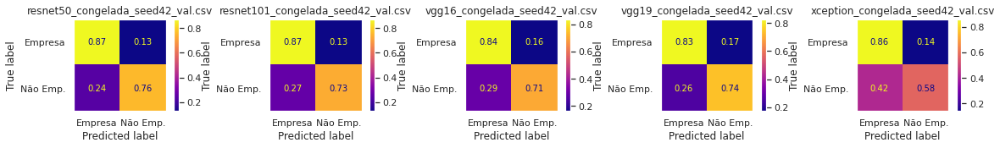

In [ ]:
import glob

path = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//val//'
files=glob.glob(path+'*seed42_val.csv')

fig, axs = plt.subplots(1, 5, figsize=(20,2))

i = 0
for f in files:
  titulo = (f.split('//')[-1]).split('/')[-1]
  print(titulo)
  calculaMetricas(f, axs[i], titulo)
  i += 1

#### 2.10.1.2) Seed 51

resnet50_congelada_val.csv
AUC-ROC: 0.9006500959933328
ACU-BAL: 0.8105599483263586
resnet101_congelada_val.csv
AUC-ROC: 0.8859268575966814
ACU-BAL: 0.7992951115405886
vgg16_congelada_val.csv
AUC-ROC: 0.8530564907768856
ACU-BAL: 0.7683007262771203
vgg19_congelada_val.csv
AUC-ROC: 0.8667281910220457
ACU-BAL: 0.7953318182321718
xception_congelada_val.csv
AUC-ROC: 0.8038578838519017
ACU-BAL: 0.7045169272930392


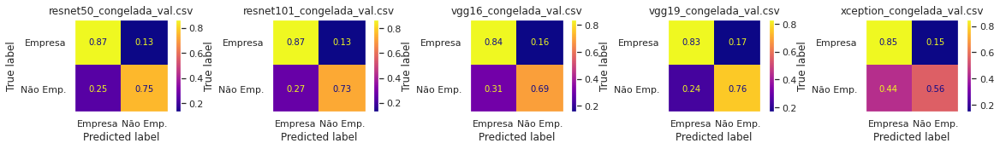

In [ ]:
import glob

path = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//val//'
files=glob.glob(path+'*congelada_val.csv')

fig, axs = plt.subplots(1, 5, figsize=(20,2))

i = 0
for f in files:
  titulo = (f.split('//')[-1]).split('/')[-1]
  print(titulo)
  calculaMetricas(f, axs[i], titulo)
  i += 1

# Parte 3: Modelos usando dados tabulares

## 3.1) Random Forest com CEP inteiro (sem pré-processamento)

Acc.Bal: 85.02% (val)

### 3.1.1) Preparando dos dados

In [ ]:
# Versão utilizando a mesma proposta de separação da rede de imagens
# Campo utilizados no treino e validação (cep)

import pandas as pd
from sklearn import model_selection
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from google.colab import drive
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import roc_auc_score

drive.mount('/content/drive')

# Nomeando headers das colunas
names = ['id', 'tipo_logradouro', 'nome_logradouro', 'numero_logradouro', 'municipio', 'cep', 'regiao', 'subregiao', 'setor','subsetor','divisorsubsetor','sufixodist','empresa']

# Lendo arquivo .csv e imprimindo dados e layout
df_train = pd.read_csv("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//random_forest//dados_tabulares_com_CEP__TRAIN.csv", names=names, sep='\;')
df_val = pd.read_csv("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//random_forest//dados_tabulares_com_CEP__VAL.csv", names=names, sep='\;')
print("Dados de treino")
print(df_train.shape)
print(df_train.head())
print("")

print("Dados de validação")
print(df_val.shape)
df_val.head()
print(df_val.head())
print("")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados de treino
(6603, 13)
   id  tipo_logradouro  ...  sufixodist  empresa
0  ID  Tipo_Logradouro  ...  SufixoDist  Empresa
1   0              Rua  ...         110        0
2   1              Rua  ...          70        0
3   3              Rua  ...          90        0
4  10              Rua  ...          20        0

[5 rows x 13 columns]

Dados de validação
(2201, 13)
   id  tipo_logradouro  ...  sufixodist  empresa
0  ID  Tipo_Logradouro  ...  SufixoDist  Empresa
1   8              Rua  ...          74        0
2   9          Avenida  ...         170        0
3  21              Rua  ...         180        0
4  32              Rua  ...         450        0

[5 rows x 13 columns]



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.


In [ ]:
# Deleta linha label
df_train = df_train.drop(labels=0, axis=0)
df_val = df_val.drop(labels=0, axis=0)

# Inclue coluna possui_numero e dropa coluna numero_logradouro
df_train.loc[df_train['numero_logradouro'] == '0', 'possui_numero'] = '0'  
df_train.loc[df_train['numero_logradouro'] != '0', 'possui_numero'] = '1'  
del df_train["numero_logradouro"]

df_val.loc[df_val['numero_logradouro'] == '0', 'possui_numero'] = '0'  
df_val.loc[df_val['numero_logradouro'] != '0', 'possui_numero'] = '1'  
del df_val["numero_logradouro"]

# Inclue coluna tipo_logradouro_label
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df1 = df_train[['tipo_logradouro']]
df1['tipo_logradouro'] = le.fit_transform(df_train['tipo_logradouro'])
df1.value_counts()

del df_train["tipo_logradouro"]
df_train = df_train.join(df1)

df1 = df_val[['tipo_logradouro']]
df1['tipo_logradouro'] = le.fit_transform(df_val['tipo_logradouro'])
df1.value_counts()

del df_val["tipo_logradouro"]
df_val = df_val.join(df1)

# Inclui coluna prefixocep
df_train["prefixocep"] = df_train["regiao"] +  df_train["subregiao"] + df_train["setor"] + df_train["subsetor"] + df_train["divisorsubsetor"]
df_val["prefixocep"] = df_val["regiao"] +  df_val["subregiao"] + df_val["setor"] + df_val["subsetor"] + df_val["divisorsubsetor"]

# Deleta colunas que não serão usadas dataset de treino
del df_train["id"]
del df_train["tipo_logradouro"]
del df_train["nome_logradouro"]
del df_train["municipio"]
#del df_train["cep"]
del df_train["possui_numero"]
del df_train["regiao"]
del df_train["subregiao"]
del df_train["setor"]
del df_train["subsetor"]
del df_train["divisorsubsetor"]
del df_train["prefixocep"]
del df_train["sufixodist"]

# Deleta colunas que não serão usadas dataset de validação
del df_val["id"]
del df_val["tipo_logradouro"]
del df_val["nome_logradouro"]
del df_val["municipio"]
#del df_val["cep"]
del df_val["possui_numero"]
del df_val["regiao"]
del df_val["subregiao"]
del df_val["setor"]
del df_val["subsetor"]
del df_val["divisorsubsetor"]
del df_val["prefixocep"]
del df_val["sufixodist"]

# Mostra dataframe com as colunas a serem usadas no treinamento do modelo
print(df_train.head())
print(df_val.head())

       cep empresa
1  2542110       0
2  1050070       0
3  3158090       0
4  5386020       0
5  4651150       0
       cep empresa
1  4895074       0
2  4803170       0
3  5775180       0
4  5782450       0
5  4081000       0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
# Altera datatypes para float para adequar o randomforest
print (df_train.dtypes)
df_train=df_train.astype(float)
print (df_train.dtypes)

print (df_val.dtypes)
df_val=df_val.astype(float)
print (df_val.dtypes)

cep        object
empresa    object
dtype: object
cep        float64
empresa    float64
dtype: object
cep        object
empresa    object
dtype: object
cep        float64
empresa    float64
dtype: object


In [ ]:
# Atribui variáveis x e y
x_train = df_train.drop('empresa', axis=1)
y_train = df_train['empresa']

x_val = df_val.drop('empresa', axis=1)
y_val = df_val['empresa']

print(x_train)
print(y_train)

print(x_val)
print(y_val)

            cep
1     2542110.0
2     1050070.0
3     3158090.0
4     5386020.0
5     4651150.0
...         ...
6598  5589090.0
6599  5763470.0
6600  5036170.0
6601  4696000.0
6602  8290595.0

[6602 rows x 1 columns]
1       0.0
2       0.0
3       0.0
4       0.0
5       0.0
       ... 
6598    0.0
6599    0.0
6600    0.0
6601    0.0
6602    0.0
Name: empresa, Length: 6602, dtype: float64
            cep
1     4895074.0
2     4803170.0
3     5775180.0
4     5782450.0
5     4081000.0
...         ...
2196  8081690.0
2197  1306010.0
2198  1304010.0
2199  5088050.0
2200  4713010.0

[2200 rows x 1 columns]
1       0.0
2       0.0
3       0.0
4       0.0
5       0.0
       ... 
2196    0.0
2197    0.0
2198    0.0
2199    0.0
2200    0.0
Name: empresa, Length: 2200, dtype: float64


### 3.1.2) Treinando e avaliando modelo

In [ ]:
# Cria chamada a função RandomForestClassifier com os parâmetros default
rfc = RandomForestClassifier()

############
# Baseline #
############

# Exibe parâmetros utilizados na função RandomForestClassifier()
from pprint import pprint
print('Parameters currently in use:\n')
pprint(rfc.get_params())

# Treina o modelo
rfc.fit(x_train,y_train)
# Roda predição
rfc_predict = rfc.predict(x_val)

acc = balanced_accuracy_score(y_val, rfc_predict)
print("Acurácia Balanceada:")
print(acc)

roc = roc_auc_score(y_val, rfc_predict)
print("AUC:")
print(roc)

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}
Acurácia Balanceada:
0.8540820387228498
AUC:
0.8540820387228498


In [ ]:
################
# GridSearchCV #
################
param_grid = {
    "max_depth": [4, 5, 6, 7, 8, 9, 10],
    "max_features": ["auto", "sqrt"],
    "n_estimators": [20, 50, 100, 150, 200, 250, 300]
}
rfc_cv = GridSearchCV(estimator=rfc, param_grid=param_grid, cv=3)
rfc_cv.fit(x_train, y_train)

rfc_cv.best_params_


{'max_depth': 10, 'max_features': 'sqrt', 'n_estimators': 100}

In [ ]:
# Cria chamada a função RandomForestClassifier com os parâmetros do gridsearchCV
rfc1 = RandomForestClassifier(max_depth= 10, max_features= 'sqrt', n_estimators= 100)

# Treina o modelo
rfc1.fit(x_train,y_train)
# Roda predição
rfc1_predict = rfc1.predict(x_val)

acc = balanced_accuracy_score(y_val, rfc1_predict)
print("Acurácia Balanceada:")
print(acc)

roc = roc_auc_score(y_val, rfc1_predict)
print("AUC:")
print(roc)

Acurácia Balanceada:
0.8502555135451577
AUC:
0.8502555135451577


## 3.2) Random Forest com CEP separado em 2 partes + tipo de logradouro

Acc.Bal: 84.57% (val)

### 3.2.1) Preparando Dados

In [ ]:
# Versão utilizando a mesma proposta de separação da rede de imagens
# Campo utilizados no treino e validação (possui/não possui número, tipo_logradouro, prefixocep, sufixodist)

import pandas as pd
from sklearn import model_selection
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from google.colab import drive
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import roc_auc_score

drive.mount('/content/drive/')

# Nomeando headers das colunas
names = ['id', 'tipo_logradouro', 'nome_logradouro', 'numero_logradouro', 'municipio', 'cep', 'regiao', 'subregiao', 'setor','subsetor','divisorsubsetor','sufixodist','empresa']

# Lendo arquivo .csv e imprimindo dados e layout
df_train = pd.read_csv("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//random_forest//dados_tabulares_com_CEP__TRAIN.csv", names=names, sep='\;')
df_val = pd.read_csv("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//random_forest//dados_tabulares_com_CEP__VAL.csv", names=names, sep='\;')
print("Dados de treino")
print(df_train.shape)
print(df_train.head())
print("")

print("Dados de validação")
print(df_val.shape)
df_val.head()
print(df_val.head())
print("")

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.


Dados de treino
(6603, 13)
   id  tipo_logradouro  ...  sufixodist  empresa
0  ID  Tipo_Logradouro  ...  SufixoDist  Empresa
1   0              Rua  ...         110        0
2   1              Rua  ...          70        0
3   3              Rua  ...          90        0
4  10              Rua  ...          20        0

[5 rows x 13 columns]

Dados de validação
(2201, 13)
   id  tipo_logradouro  ...  sufixodist  empresa
0  ID  Tipo_Logradouro  ...  SufixoDist  Empresa
1   8              Rua  ...          74        0
2   9          Avenida  ...         170        0
3  21              Rua  ...         180        0
4  32              Rua  ...         450        0

[5 rows x 13 columns]



In [ ]:
# Deleta linha label
df_train = df_train.drop(labels=0, axis=0)
df_val = df_val.drop(labels=0, axis=0)

# Inclue coluna possui_numero e dropa coluna numero_logradouro
df_train.loc[df_train['numero_logradouro'] == '0', 'possui_numero'] = '0'  
df_train.loc[df_train['numero_logradouro'] != '0', 'possui_numero'] = '1'  
del df_train["numero_logradouro"]

df_val.loc[df_val['numero_logradouro'] == '0', 'possui_numero'] = '0'  
df_val.loc[df_val['numero_logradouro'] != '0', 'possui_numero'] = '1'  
del df_val["numero_logradouro"]

# Inclue coluna tipo_logradouro_label
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df1 = df_train[['tipo_logradouro']]
df1['tipo_logradouro'] = le.fit_transform(df_train['tipo_logradouro'])
df1.value_counts()

del df_train["tipo_logradouro"]
df_train = df_train.join(df1)

df1 = df_val[['tipo_logradouro']]
df1['tipo_logradouro'] = le.fit_transform(df_val['tipo_logradouro'])
df1.value_counts()

del df_val["tipo_logradouro"]
df_val = df_val.join(df1)

# Inclui coluna prefixocep
df_train["prefixocep"] = df_train["regiao"] +  df_train["subregiao"] + df_train["setor"] + df_train["subsetor"] + df_train["divisorsubsetor"]
df_val["prefixocep"] = df_val["regiao"] +  df_val["subregiao"] + df_val["setor"] + df_val["subsetor"] + df_val["divisorsubsetor"]

# Deleta colunas que não serão usadas dataset de treino
del df_train["id"]
#del df_train["tipo_logradouro"]
del df_train["nome_logradouro"]
del df_train["municipio"]
del df_train["cep"]
del df_train["possui_numero"]
del df_train["regiao"]
del df_train["subregiao"]
del df_train["setor"]
del df_train["subsetor"]
del df_train["divisorsubsetor"]
#del df_train["prefixocep"]

# Deleta colunas que não serão usadas dataset de validação
del df_val["id"]
#del df_val["tipo_logradouro"]
del df_val["nome_logradouro"]
del df_val["municipio"]
del df_val["cep"]
del df_val["possui_numero"]
del df_val["regiao"]
del df_val["subregiao"]
del df_val["setor"]
del df_val["subsetor"]
del df_val["divisorsubsetor"]
#del df_val["prefixocep"]

# Mostra dataframe com as colunas a serem usadas no treinamento do modelo
print(df_train.head())
print(df_val.head())

  sufixodist empresa  tipo_logradouro prefixocep
1        110       0               34      02542
2         70       0               34      01050
3         90       0               34      03158
4         20       0               34      05386
5        150       0               34      04651
  sufixodist empresa  tipo_logradouro prefixocep
1         74       0               18      04895
2        170       0                6      04803
3        180       0               18      05775
4        450       0               18      05782
5          0       0                6      04081


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
# Altera datatypes para float para adequar o randomforest
print (df_train.dtypes)
df_train=df_train.astype(float)
print (df_train.dtypes)

print (df_val.dtypes)
df_val=df_val.astype(float)
print (df_val.dtypes)

sufixodist         object
empresa            object
tipo_logradouro     int64
prefixocep         object
dtype: object
sufixodist         float64
empresa            float64
tipo_logradouro    float64
prefixocep         float64
dtype: object
sufixodist         object
empresa            object
tipo_logradouro     int64
prefixocep         object
dtype: object
sufixodist         float64
empresa            float64
tipo_logradouro    float64
prefixocep         float64
dtype: object


In [ ]:
# Atribui variáveis x e y
x_train = df_train.drop('empresa', axis=1)
y_train = df_train['empresa']

x_val = df_val.drop('empresa', axis=1)
y_val = df_val['empresa']

print(x_train)
print(y_train)

print(x_val)
print(y_val)

      sufixodist  tipo_logradouro  prefixocep
1          110.0             34.0      2542.0
2           70.0             34.0      1050.0
3           90.0             34.0      3158.0
4           20.0             34.0      5386.0
5          150.0             34.0      4651.0
...          ...              ...         ...
6598        90.0             34.0      5589.0
6599       470.0             34.0      5763.0
6600       170.0             34.0      5036.0
6601         0.0              7.0      4696.0
6602       595.0             34.0      8290.0

[6602 rows x 3 columns]
1       0.0
2       0.0
3       0.0
4       0.0
5       0.0
       ... 
6598    0.0
6599    0.0
6600    0.0
6601    0.0
6602    0.0
Name: empresa, Length: 6602, dtype: float64
      sufixodist  tipo_logradouro  prefixocep
1           74.0             18.0      4895.0
2          170.0              6.0      4803.0
3          180.0             18.0      5775.0
4          450.0             18.0      5782.0
5            0.0 

### 3.2.2) Treinando e avaliando modelo

In [ ]:
# Cria chamada a função RandomForestClassifier com os parâmetros default
rfc = RandomForestClassifier()

############
# Baseline #
############

# Exibe parâmetros utilizados na função RandomForestClassifier()
from pprint import pprint
print('Parameters currently in use:\n')
pprint(rfc.get_params())

# Treina o modelo
rfc.fit(x_train,y_train)
# Roda predição
rfc_predict = rfc.predict(x_val)

acc = balanced_accuracy_score(y_val, rfc_predict)
print("Acurácia Balanceada:")
print(acc)

roc = roc_auc_score(y_val, rfc_predict)
print("AUC:")
print(roc)

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}
Acurácia Balanceada:
0.8267241518884654
AUC:
0.8267241518884654


In [ ]:
################
# GridSearchCV #
################
param_grid = {
    "max_depth": [4, 5, 6, 7, 8, 9, 10],
    "max_features": ["auto", "sqrt"],
    "n_estimators": [20, 50, 100, 150, 200, 250, 300]
}
rfc_cv = GridSearchCV(estimator=rfc, param_grid=param_grid, cv=3)
rfc_cv.fit(x_train, y_train)

rfc_cv.best_params_


{'max_depth': 10, 'max_features': 'sqrt', 'n_estimators': 100}

In [ ]:
# Cria chamada a função RandomForestClassifier com os parâmetros do gridsearchCV
rfc1 = RandomForestClassifier(max_depth= 10, max_features= 'sqrt', n_estimators= 100)

# Treina o modelo
rfc1.fit(x_train,y_train)
# Roda predição
rfc1_predict = rfc1.predict(x_val)

acc = balanced_accuracy_score(y_val, rfc1_predict)
print("Acurácia Balanceada:")
print(acc)

roc = roc_auc_score(y_val, rfc1_predict)
print("AUC:")
print(roc)

Acurácia Balanceada:
0.845701688681649
AUC:
0.845701688681649


## 3.3) Random Forest com CEP separado em 2 partes + tipo de logradouro + número

Acc.Bal: 86.73% (val)

### 3.3.1) Preparando dados

In [ ]:
# Versão utilizando a mesma proposta de separação da rede de imagens
# Campo utilizados no treino e validação (possui/não possui número, tipo_logradouro, prefixocep, sufixodist)

import pandas as pd
from sklearn import model_selection
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from google.colab import drive
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import roc_auc_score

drive.mount('/content/drive')

# Nomeando headers das colunas
names = ['id', 'tipo_logradouro', 'nome_logradouro', 'numero_logradouro', 'municipio', 'cep', 'regiao', 'subregiao', 'setor','subsetor','divisorsubsetor','sufixodist','empresa']

# Lendo arquivo .csv e imprimindo dados e layout
df_train = pd.read_csv("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//random_forest//dados_tabulares_com_CEP__TRAIN.csv", names=names, sep='\;')
df_val = pd.read_csv("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//random_forest//dados_tabulares_com_CEP__VAL.csv", names=names, sep='\;')
print("Dados de treino")
print(df_train.shape)
print(df_train.head())
print("")

print("Dados de validação")
print(df_val.shape)
df_val.head()
print(df_val.head())
print("")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados de treino
(6603, 13)
   id  tipo_logradouro  ...  sufixodist  empresa
0  ID  Tipo_Logradouro  ...  SufixoDist  Empresa
1   0              Rua  ...         110        0
2   1              Rua  ...          70        0
3   3              Rua  ...          90        0
4  10              Rua  ...          20        0

[5 rows x 13 columns]

Dados de validação
(2201, 13)
   id  tipo_logradouro  ...  sufixodist  empresa
0  ID  Tipo_Logradouro  ...  SufixoDist  Empresa
1   8              Rua  ...          74        0
2   9          Avenida  ...         170        0
3  21              Rua  ...         180        0
4  32              Rua  ...         450        0

[5 rows x 13 columns]



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.


In [ ]:
# Deleta linha label
df_train = df_train.drop(labels=0, axis=0)
df_val = df_val.drop(labels=0, axis=0)

# Inclue coluna possui_numero e dropa coluna numero_logradouro
df_train.loc[df_train['numero_logradouro'] == '0', 'possui_numero'] = '0'  
df_train.loc[df_train['numero_logradouro'] != '0', 'possui_numero'] = '1'  
del df_train["numero_logradouro"]

df_val.loc[df_val['numero_logradouro'] == '0', 'possui_numero'] = '0'  
df_val.loc[df_val['numero_logradouro'] != '0', 'possui_numero'] = '1'  
del df_val["numero_logradouro"]

# Inclue coluna tipo_logradouro_label
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df1 = df_train[['tipo_logradouro']]
df1['tipo_logradouro'] = le.fit_transform(df_train['tipo_logradouro'])
df1.value_counts()

del df_train["tipo_logradouro"]
df_train = df_train.join(df1)

df1 = df_val[['tipo_logradouro']]
df1['tipo_logradouro'] = le.fit_transform(df_val['tipo_logradouro'])
df1.value_counts()

del df_val["tipo_logradouro"]
df_val = df_val.join(df1)

# Inclui coluna prefixocep
df_train["prefixocep"] = df_train["regiao"] +  df_train["subregiao"] + df_train["setor"] + df_train["subsetor"] + df_train["divisorsubsetor"]
df_val["prefixocep"] = df_val["regiao"] +  df_val["subregiao"] + df_val["setor"] + df_val["subsetor"] + df_val["divisorsubsetor"]

# Deleta colunas que não serão usadas dataset de treino
del df_train["id"]
#del df_train["tipo_logradouro"]
del df_train["nome_logradouro"]
del df_train["municipio"]
del df_train["cep"]
#del df_train["possui_numero"]
del df_train["regiao"]
del df_train["subregiao"]
del df_train["setor"]
del df_train["subsetor"]
del df_train["divisorsubsetor"]
#del df_train["prefixocep"]

# Deleta colunas que não serão usadas dataset de validação
del df_val["id"]
#del df_val["tipo_logradouro"]
del df_val["nome_logradouro"]
del df_val["municipio"]
del df_val["cep"]
#del df_val["possui_numero"]
del df_val["regiao"]
del df_val["subregiao"]
del df_val["setor"]
del df_val["subsetor"]
del df_val["divisorsubsetor"]
#del df_val["prefixocep"]

# Mostra dataframe com as colunas a serem usadas no treinamento do modelo
print(df_train.head())
print(df_val.head())

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


  sufixodist empresa possui_numero  tipo_logradouro prefixocep
1        110       0             1               34      02542
2         70       0             1               34      01050
3         90       0             1               34      03158
4         20       0             1               34      05386
5        150       0             1               34      04651
  sufixodist empresa possui_numero  tipo_logradouro prefixocep
1         74       0             1               18      04895
2        170       0             1                6      04803
3        180       0             1               18      05775
4        450       0             1               18      05782
5          0       0             1                6      04081


In [ ]:
# Altera datatypes para float para adequar o randomforest
print (df_train.dtypes)
df_train=df_train.astype(float)
print (df_train.dtypes)

print (df_val.dtypes)
df_val=df_val.astype(float)
print (df_val.dtypes)

sufixodist         object
empresa            object
possui_numero      object
tipo_logradouro     int64
prefixocep         object
dtype: object
sufixodist         float64
empresa            float64
possui_numero      float64
tipo_logradouro    float64
prefixocep         float64
dtype: object
sufixodist         object
empresa            object
possui_numero      object
tipo_logradouro     int64
prefixocep         object
dtype: object
sufixodist         float64
empresa            float64
possui_numero      float64
tipo_logradouro    float64
prefixocep         float64
dtype: object


In [ ]:
# Atribui variáveis x e y
x_train = df_train.drop('empresa', axis=1)
y_train = df_train['empresa']

x_val = df_val.drop('empresa', axis=1)
y_val = df_val['empresa']

print(x_train)
print(y_train)

print(x_val)
print(y_val)

      sufixodist  possui_numero  tipo_logradouro  prefixocep
1          110.0            1.0             34.0      2542.0
2           70.0            1.0             34.0      1050.0
3           90.0            1.0             34.0      3158.0
4           20.0            1.0             34.0      5386.0
5          150.0            1.0             34.0      4651.0
...          ...            ...              ...         ...
6598        90.0            1.0             34.0      5589.0
6599       470.0            1.0             34.0      5763.0
6600       170.0            1.0             34.0      5036.0
6601         0.0            1.0              7.0      4696.0
6602       595.0            1.0             34.0      8290.0

[6602 rows x 4 columns]
1       0.0
2       0.0
3       0.0
4       0.0
5       0.0
       ... 
6598    0.0
6599    0.0
6600    0.0
6601    0.0
6602    0.0
Name: empresa, Length: 6602, dtype: float64
      sufixodist  possui_numero  tipo_logradouro  prefixocep
1     

### 3.3.2) Teinando e avaliando modelo

In [ ]:
# Cria chamada a função RandomForestClassifier com os parâmetros default
rfc = RandomForestClassifier()

############
# Baseline #
############

# Exibe parâmetros utilizados na função RandomForestClassifier()
from pprint import pprint
print('Parameters currently in use:\n')
pprint(rfc.get_params())

# Treina o modelo
rfc.fit(x_train,y_train)
# Roda predição
rfc_predict = rfc.predict(x_val)

acc = balanced_accuracy_score(y_val, rfc_predict)
print("Acurácia Balanceada:")
print(acc)

roc = roc_auc_score(y_val, rfc_predict)
print("AUC:")
print(roc)

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}
Acurácia Balanceada:
0.8584492453892949
AUC:
0.8584492453892949


In [ ]:
################
# GridSearchCV #
################
param_grid = {
    "max_depth": [4, 5, 6, 7, 8, 9, 10],
    "max_features": ["auto", "sqrt"],
    "n_estimators": [20, 50, 100, 150, 200, 250, 300]
}
rfc_cv = GridSearchCV(estimator=rfc, param_grid=param_grid, cv=3)
rfc_cv.fit(x_train, y_train)

rfc_cv.best_params_


{'max_depth': 10, 'max_features': 'auto', 'n_estimators': 300}

In [ ]:
# Cria chamada a função RandomForestClassifier com os parâmetros do gridsearchCV
rfc1 = RandomForestClassifier(max_depth= 10, max_features= 'auto', n_estimators= 300)

# Treina o modelo
rfc1.fit(x_train,y_train)
# Roda predição
rfc1_predict = rfc1.predict(x_val)

acc = balanced_accuracy_score(y_val, rfc1_predict)
print("Acurácia Balanceada:")
print(acc)

roc = roc_auc_score(y_val, rfc1_predict)
print("AUC:")
print(roc)

Acurácia Balanceada:
0.8673570687820138
AUC:
0.8673570687820137


## 3.4) Random Forest com cada dígito do CEP separado

Acc.Bal: 88.18% (val)

### 3.4.1) Preparando dados

In [ ]:
# Versão utilizando a mesma proposta de separação da rede de imagens

import pandas as pd
from sklearn import model_selection
from sklearn.ensemble import RandomForestClassifier
from google.colab import drive

drive.mount('/content/drive')

# Nomeando headers das colunas
names = ['id', 'tipo_logradouro', 'nome_logradouro', 'numero_logradouro', 'municipio', 'cep', 'regiao', 'subregiao', 'setor','subsetor','divisorsubsetor','sufixodist','empresa']

# Lendo arquivo .csv e imprimindo dados e layout
df_train = pd.read_csv("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//random_forest//dados_tabulares_com_CEP__TRAIN.csv", names=names, sep='\;')
df_val = pd.read_csv("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//random_forest//dados_tabulares_com_CEP__VAL.csv", names=names, sep='\;')
print("Dados de treino")
print(df_train.shape)
print(df_train.head())
print("")
print("Dados de validação")
print(df_val.shape)
df_val.head()
print(df_val.head())
print("")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados de treino
(6603, 13)
   id  tipo_logradouro  ...  sufixodist  empresa
0  ID  Tipo_Logradouro  ...  SufixoDist  Empresa
1   0              Rua  ...         110        0
2   1              Rua  ...          70        0
3   3              Rua  ...          90        0
4  10              Rua  ...          20        0

[5 rows x 13 columns]

Dados de validação
(2201, 13)
   id  tipo_logradouro  ...  sufixodist  empresa
0  ID  Tipo_Logradouro  ...  SufixoDist  Empresa
1   8              Rua  ...          74        0
2   9          Avenida  ...         170        0
3  21              Rua  ...         180        0
4  32              Rua  ...         450        0

[5 rows x 13 columns]



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  from ipykernel import kernelapp as app


In [ ]:
# Deleta linha label
df_train = df_train.drop(labels=0, axis=0)
df_val = df_val.drop(labels=0, axis=0)

# Deleta colunas que não serão usadas dataset de treino
del df_train["id"]
del df_train["tipo_logradouro"]
del df_train["nome_logradouro"]
del df_train["numero_logradouro"]
del df_train["municipio"]
del df_train["cep"]

# Deleta colunas que não serão usadas dataset de validação
ids = df_val["id"] 
del df_val["id"]
del df_val["tipo_logradouro"]
del df_val["nome_logradouro"]
del df_val["numero_logradouro"]
del df_val["municipio"]
del df_val["cep"]


# Mostra dataframe com as colunas a serem usadas no treinamento do modelo
print(df_train.head())
print(df_val.head())

  regiao subregiao setor subsetor divisorsubsetor sufixodist empresa
1      0         2     5        4               2        110       0
2      0         1     0        5               0         70       0
3      0         3     1        5               8         90       0
4      0         5     3        8               6         20       0
5      0         4     6        5               1        150       0
  regiao subregiao setor subsetor divisorsubsetor sufixodist empresa
1      0         4     8        9               5         74       0
2      0         4     8        0               3        170       0
3      0         5     7        7               5        180       0
4      0         5     7        8               2        450       0
5      0         4     0        8               1          0       0


In [ ]:
# Altera datatypes para float para adequar o randomforest
print (df_train.dtypes)
df_train=df_train.astype(float)
print (df_train.dtypes)

print (df_val.dtypes)
df_val=df_val.astype(float)
print (df_val.dtypes)

regiao             object
subregiao          object
setor              object
subsetor           object
divisorsubsetor    object
sufixodist         object
empresa            object
dtype: object
regiao             float64
subregiao          float64
setor              float64
subsetor           float64
divisorsubsetor    float64
sufixodist         float64
empresa            float64
dtype: object
regiao             object
subregiao          object
setor              object
subsetor           object
divisorsubsetor    object
sufixodist         object
empresa            object
dtype: object
regiao             float64
subregiao          float64
setor              float64
subsetor           float64
divisorsubsetor    float64
sufixodist         float64
empresa            float64
dtype: object


In [ ]:
# Atribui variáveis x e y
x_train = df_train.drop('empresa', axis=1)
y_train = df_train['empresa']

x_val = df_val.drop('empresa', axis=1)
y_val = df_val['empresa']

print(x_train)
print(y_train)

print(x_val)
print(y_val)

      regiao  subregiao  setor  subsetor  divisorsubsetor  sufixodist
1        0.0        2.0    5.0       4.0              2.0       110.0
2        0.0        1.0    0.0       5.0              0.0        70.0
3        0.0        3.0    1.0       5.0              8.0        90.0
4        0.0        5.0    3.0       8.0              6.0        20.0
5        0.0        4.0    6.0       5.0              1.0       150.0
...      ...        ...    ...       ...              ...         ...
6598     0.0        5.0    5.0       8.0              9.0        90.0
6599     0.0        5.0    7.0       6.0              3.0       470.0
6600     0.0        5.0    0.0       3.0              6.0       170.0
6601     0.0        4.0    6.0       9.0              6.0         0.0
6602     0.0        8.0    2.0       9.0              0.0       595.0

[6602 rows x 6 columns]
1       0.0
2       0.0
3       0.0
4       0.0
5       0.0
       ... 
6598    0.0
6599    0.0
6600    0.0
6601    0.0
6602    0.0
Nam

### 3.4.2) Treinando e avaliando modelo

In [ ]:
############
# Baseline #
############
# Cria chamada a função RandomForestClassifier com os parâmetros default
rfc = RandomForestClassifier()

# Exibe parâmetros utilizados na função RandomForestClassifier()
from pprint import pprint
print('Parameters currently in use:\n')
pprint(rfc.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


In [ ]:
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import roc_auc_score

# Treina o modelo
rfc.fit(x_train,y_train)
# Roda predição
rfc_predict = rfc.predict(x_val)
print(rfc_predict)

acc = balanced_accuracy_score(y_val, rfc_predict)
print("Acurácia Balanceada:")
print(acc)
print("")

roc = roc_auc_score(y_val, rfc_predict)
print("AUC:")
print(roc)

[0. 0. 1. ... 0. 0. 0.]
Acurácia Balanceada:
0.8818272222264829

AUC:
0.8818272222264829


### 3.4.3) Salvando modelo treinado / Gerando matriz de confusão

In [ ]:
import joblib

joblib.dump(rfc, '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//randomforest.rede')

['//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//randomforest.rede']

In [ ]:
import joblib

# Código para carregar Random Forest previamente salva
randfors = joblib.load('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//randomforest.rede')

In [ ]:
# salva classificação da Random Forest para conjunto de validação (usado para gerar métricas)
rfc_predict = randfors.predict(x_val)
salvaPredict2(y_val, rfc_predict, ids, '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Conjunto_de_Validacao//randomforest_val.csv')

AUC-ROC: 0.8818272222264829
ACU-BAL: 0.8818272222264829


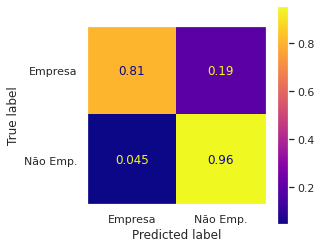

In [ ]:
# Gera metricas usando resultados salvos

fig,ax = plt.subplots(figsize=(4,4))
calculaMetricas('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Conjunto_de_Validacao//randomforest_val.csv', ax)

# Parte 4: _Ensemble_

## 4.1) Explorações 1: _ensemble_ de 5 classificadores CNN 'congelados' e agregador SVM

Acc.bal. melhor tentativa: 83.12% (SVM de 5 CNNs + RandomForest)

### 4.1.1) Montando conjuntos de treino e validação a partir das saídas das CNNs

In [ ]:
# Salvando saídas dos classificadores

import glob

generator = {'resnet50_congelada_seed42'  : tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input),
             'resnet101_congelada_seed42' : tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet.preprocess_input),
             'vgg16_congelada_seed42'     : tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg16.preprocess_input),
             'vgg19_congelada_seed42'     : tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input),
             'xception_congelada_seed42'  : tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.xception.preprocess_input)}

path1 = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//Congeladas//'
path2 = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//train//'
files=glob.glob(path1+'*seed42.rede')

for f in files:
  g = f.split('/')
  h = g[-1].split('.')
  dado = '//content/train'
  rede = path1 + g[-1]
  resu = path2 + h[0] + '_train.csv'
  #print(dado, rede, resu)
  salvaPredicted(dado, rede, resu, generator[h[0]])

### 4.1.2) _Ensemble_ com SVM cuja entrada é a saída de 5 CNNs
(ResNet50, ResNet101, VGG16, VGG19, Xception)

Acc.bal: 82.49%

#### 4.1.2.1) Preparando dados

In [ ]:
# Concatenando saídas para conjunto de treino
(ids, resnet101_1, resnet101_2) = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//train//resnet101_congelada_seed42_train.csv',
                                               retornaIDs=True)
(vgg16_1    , vgg16_2)     = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//train//vgg16_congelada_seed42_train.csv')
(resnet50_1 , resnet50_2)  = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//train//resnet50_congelada_seed42_train.csv')
(vgg19_1    , vgg19_2)     = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//train//vgg19_congelada_seed42_train.csv')
(xception_1 , xception_2, gtruth_1, gtruth_2)  = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//train//xception_congelada_seed42_train.csv',
                                                              retornaGroundTruth=True)

ens_train = list(zip(ids, resnet101_1, resnet101_2, vgg16_1, vgg16_2, resnet50_1, resnet50_2, vgg19_1, vgg19_2, xception_1, xception_2, gtruth_1, gtruth_2))

pathResult = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//ensemble//congeladas//train.csv'
with open(pathResult, 'w', newline='') as arquivo:
  writer = csv.writer(arquivo)
  writer.writerow(['id', 'resnet101_1', 'resnet101_2', 'vgg16_1', 'vgg16_2', 'resnet50_1', 'resnet50_2', 'vgg19_1', 'vgg19_2', 'xception_1', 'xception_2', 'gtruth_1', 'gtruth_2'])
  for r in ens_train:
    writer.writerow(r)

In [ ]:
# Concatenando saídas para conjunto de validação
(ids, resnet101_1, resnet101_2) = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//val//resnet101_congelada_seed42_val.csv',
                                               retornaIDs=True)
(vgg16_1    , vgg16_2)     = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//val//vgg16_congelada_seed42_val.csv')
(resnet50_1 , resnet50_2)  = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//val//resnet50_congelada_seed42_val.csv')
(vgg19_1    , vgg19_2)     = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//val//vgg19_congelada_seed42_val.csv')
(xception_1 , xception_2, gtruth_1, gtruth_2)  = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//val//xception_congelada_seed42_val.csv',
                                                              retornaGroundTruth=True)

ens_val = list(zip(ids, resnet101_1, resnet101_2, vgg16_1, vgg16_2, resnet50_1, resnet50_2, vgg19_1, vgg19_2, xception_1, xception_2, gtruth_1, gtruth_2))

pathResult = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//ensemble//congeladas//val.csv'
with open(pathResult, 'w', newline='') as arquivo:
  writer = csv.writer(arquivo)
  writer.writerow(['id', 'resnet101_1', 'resnet101_2', 'vgg16_1', 'vgg16_2', 'resnet50_1', 'resnet50_2', 'vgg19_1', 'vgg19_2', 'xception_1', 'xception_2', 'gtruth_1', 'gtruth_2'])
  for r in ens_val:
    writer.writerow(r)

In [ ]:
# Carregando conjuntos de treinamento e validação criados a partir das saídas dos classificadores

names = ['id', 'resnet101_1', 'resnet101_2', 'vgg16_1', 'vgg16_2', 'resnet50_1', 'resnet50_2', 'vgg19_1', 'vgg19_2', 'xception_1', 'xception_2', 'gtruth_1', 'gtruth_2']

# Lendo arquivo .csv 
ens_trn = pd.read_csv('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//ensemble//congeladas//train.csv', names=names, sep='\,')
ens_val = pd.read_csv('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//ensemble//congeladas//val.csv'  , names=names, sep='\,')

# Deleta linha label
ens_trn = ens_trn.drop(labels=0, axis=0)
ens_val = ens_val.drop(labels=0, axis=0)

# Deleta ID
ens_trn = ens_trn.drop('id', axis=1)
ens_val = ens_val.drop('id', axis=1)

# Altera datatypes para float para adequar o randomforest
ens_trn = ens_trn.astype(float)
ens_val = ens_val.astype(float)

# Atribui variáveis x e y
ens_trn_x = ens_trn.drop('gtruth_1', axis=1).drop('gtruth_2', axis=1)
ens_trn_y = ens_trn[['gtruth_1','gtruth_2']]

ens_val_x = ens_val.drop('gtruth_1', axis=1).drop('gtruth_2', axis=1)
ens_val_y = ens_val[['gtruth_1','gtruth_2']]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  import sys


#### 4.1.2.2) Treinando e avaliando SVM

AUC-ROC: 0.8248899250885584
ACU-BAL: 0.8248899250885584


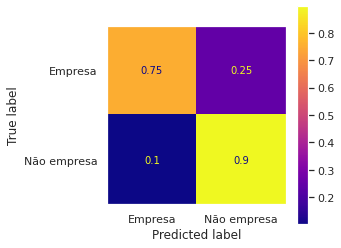

In [ ]:
# SVM 

from sklearn.model_selection import GridSearchCV
from sklearn import svm

xval_runs = 3

params = {'C'     :[0.01, 0.1, 1.0, 4.0],
          'gamma' :[0.01, 0.05, 0.1, 1.1]}

svc = svm.SVC()
gs = GridSearchCV(svc, params, cv=xval_runs, verbose=True)
gs.fit(ens_trn_x, ens_trn_y['gtruth_2'])
pred = gs.predict(ens_val_x)

fig, ax = plt.subplots(figsize=(4,4))
calculaMetricas2(ens_val_y['gtruth_2'], pred, ohe=False)
matrizConfusao(ens_val_y['gtruth_2'], pred, ax)

### 4.1.3) _Ensemble_ com SVM usando 5 CNNs + Random Forest
Acc.Bal: 83.12%

#### 4.1.3.1) Preparando dados

In [ ]:
# Montando conjunto de treino
(ids, resnet101_1, resnet101_2) = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//train//resnet101_congelada_seed42_train.csv',
                                               retornaIDs=True)
(vgg16_1    , vgg16_2)     = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//train//vgg16_congelada_seed42_train.csv')
(resnet50_1 , resnet50_2)  = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//train//resnet50_congelada_seed42_train.csv')
(vgg19_1    , vgg19_2)     = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//train//vgg19_congelada_seed42_train.csv')
(randf_1    , randf_2)     = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Conjunto_de_Treino//randomforest_train.csv')
(xception_1 , xception_2, gtruth_1, gtruth_2)  = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//train//xception_congelada_seed42_train.csv',
                                                              retornaGroundTruth=True)

ens_train = list(zip(ids, resnet101_1, resnet101_2, vgg16_1, vgg16_2, resnet50_1, resnet50_2, vgg19_1, vgg19_2, randf_1, randf_2, xception_1, xception_2, gtruth_1, gtruth_2))

pathResult = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//ensemble//congeladas//train_com_rf.csv'
with open(pathResult, 'w', newline='') as arquivo:
  writer = csv.writer(arquivo)
  writer.writerow(['id', 'resnet101_1', 'resnet101_2', 'vgg16_1', 'vgg16_2', 'resnet50_1', 'resnet50_2', 'vgg19_1', 'vgg19_2', 'randf_1', 'randf_2', 'xception_1', 'xception_2', 'gtruth_1', 'gtruth_2'])
  for r in ens_train:
    writer.writerow(r)

In [ ]:
# Montando conjunto de validação
(ids, resnet101_1, resnet101_2) = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//val//resnet101_congelada_seed42_val.csv',
                                               retornaIDs=True)
(vgg16_1    , vgg16_2)     = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//val//vgg16_congelada_seed42_val.csv')
(resnet50_1 , resnet50_2)  = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//val//resnet50_congelada_seed42_val.csv')
(vgg19_1    , vgg19_2)     = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//val//vgg19_congelada_seed42_val.csv')
(randf_1    , randf_2)     = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Conjunto_de_Validacao//randomforest_val.csv')
(xception_1 , xception_2, gtruth_1, gtruth_2)  = retornaPreds('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Congeladas//val//xception_congelada_seed42_val.csv',
                                                              retornaGroundTruth=True)

ens_val = list(zip(ids, resnet101_1, resnet101_2, vgg16_1, vgg16_2, resnet50_1, resnet50_2, vgg19_1, vgg19_2, randf_1, randf_2, xception_1, xception_2, gtruth_1, gtruth_2))

pathResult = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//ensemble//congeladas//val_com_rf.csv'
with open(pathResult, 'w', newline='') as arquivo:
  writer = csv.writer(arquivo)
  writer.writerow(['id', 'resnet101_1', 'resnet101_2', 'vgg16_1', 'vgg16_2', 'resnet50_1', 'resnet50_2', 'vgg19_1', 'vgg19_2', 'randf_1', 'randf_2', 'xception_1', 'xception_2', 'gtruth_1', 'gtruth_2'])
  for r in ens_val:
    writer.writerow(r)

In [ ]:
# Lendo dados de treinamento e validação

names = ['id', 'resnet101_1', 'resnet101_2', 'vgg16_1', 'vgg16_2', 'resnet50_1', 'resnet50_2', 'vgg19_1', 'vgg19_2', 'randf_1', 'randf_2', 'xception_1', 'xception_2', 'gtruth_1', 'gtruth_2']

# Lendo arquivo .csv 
ens_trn = pd.read_csv('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//ensemble//congeladas//train_com_rf.csv', names=names, sep='\,')
ens_val = pd.read_csv('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//ensemble//congeladas//val_com_rf.csv'  , names=names, sep='\,')

# Deleta linha label
ens_trn = ens_trn.drop(labels=0, axis=0)
ens_val = ens_val.drop(labels=0, axis=0)

# Deleta ID
ens_trn = ens_trn.drop('id', axis=1)
ens_val = ens_val.drop('id', axis=1)

# Altera datatypes para float para adequar o randomforest
ens_trn = ens_trn.astype(float)
ens_val = ens_val.astype(float)

# Atribui variáveis x e y
ens_trn_x = ens_trn.drop('gtruth_1', axis=1).drop('gtruth_2', axis=1)
ens_trn_y = ens_trn[['gtruth_1','gtruth_2']]

ens_val_x = ens_val.drop('gtruth_1', axis=1).drop('gtruth_2', axis=1)
ens_val_y = ens_val[['gtruth_1','gtruth_2']]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  import sys


#### 4.1.3.2) Treinando e avaliando SVM

Fitting 3 folds for each of 16 candidates, totalling 48 fits
AUC-ROC: 0.8312042668248235
ACU-BAL: 0.8312042668248234


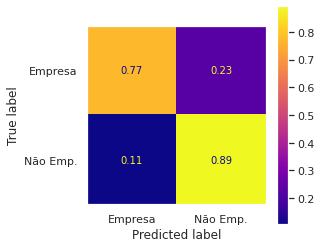

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn import svm

xval_runs = 3

params = {'C'     :[0.01, 0.1, 1.0, 4.0],
          'gamma' :[0.01, 0.05, 0.1, 1.1]}

svc = svm.SVC(C=4, gamma=1.1)
gs = GridSearchCV(svc, params, cv=xval_runs, verbose=True)
gs.fit(ens_trn_x, ens_trn_y['gtruth_2'])
pred = gs.predict(ens_val_x)

fig, ax = plt.subplots(figsize=(4,4))
calculaMetricas2(ens_val_y['gtruth_2'], pred, ohe=False)
matrizConfusao(ens_val_y['gtruth_2'], pred, ax)

## 4.2) Explorações 2: _ensemble_ usando 3 modelos mais discordantes (VGG19, Xception, Random Forest)

Melhor Acc.Bal: 91.27% (saída MLP)

### 4.2.1) Preparando dados

#### 4.2.1.1) Obtendo saídas dos classificadores em treino/validação

 (dados serão usados como entrada do _ensemble_)

In [ ]:
# Preparando dataframe auxiliar (val)

names = ['id', 'tipo_logradouro', 'nome_logradouro', 'numero_logradouro', 'municipio', 'cep', 'regiao', 'subregiao', 'setor','subsetor','divisorsubsetor','sufixodist','empresa']
df_val3 = pd.read_csv("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//random_forest//dados_tabulares_com_CEP__VAL.csv", names=names, sep='\;')
df_val3 = df_val3.drop(labels=0, axis=0)
del df_val3["tipo_logradouro"]
del df_val3["nome_logradouro"]
del df_val3["numero_logradouro"]
del df_val3["municipio"]

df_val4 = df_val3.astype(float)
del df_val4["id"]
del df_val4["cep"]
del df_val4["empresa"]

arqs = []
for index, row in df_val3.iterrows():
  arq = ['imagens_nao_empresas', 'imagens_empresas'][int(row['empresa'])] + '/' + row['id'] + '.jpg'
  arqs.append(arq)
df_val3['Arquivo'] = arqs

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  after removing the cwd from sys.path.


In [ ]:
# Preparando dados de validação

valsetPath = '//content//val'

genX = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.xception.preprocess_input)
datasetX = genX.flow_from_directory(
        valsetPath,
        target_size=(224, 224),
        batch_size=2200,
        class_mode='categorical',
        shuffle=False)
genV = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)
datasetV = genV.flow_from_directory(
        valsetPath,
        target_size=(224, 224),
        batch_size=2200,
        class_mode='categorical',
        shuffle=False)
qtdImagens = len(datasetV.filenames)

idxs = []
for i in range(len(datasetX.filenames)):
  idxs.append((df_val3.index[df_val3['Arquivo']==datasetX.filenames[i]])[0])

valset3x = datasetX.next()
valset3v = datasetV.next()

Found 2200 images belonging to 2 classes.
Found 2200 images belonging to 2 classes.


In [ ]:
# Reordenando dataframes auxiliares para ficarem na mesma ordem do dataImageGenerator

df_val3 = df_val3.reindex(idxs)
df_val4 = df_val4.reindex(idxs)

In [ ]:
# Definindo 'ground truth' com ordem comum para 2 origens de dados
actual1 = np.array(list(map(lambda x: [int(x), 1-int(x)], df_val3['empresa'])))

In [ ]:
# Carregando classificadores participantes

import joblib
random_forest = joblib.load('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//randomforest.rede')
xception = tf.keras.models.load_model('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//Congeladas//xception_congelada_seed42.rede')

In [ ]:
#vgg19b = tf.keras.models.load_model('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//vgg19_adam_l2_balanceada.rede')
vgg19b = tf.keras.models.load_model('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//Functional//VGG19//Seed42//vgg19_adam_l2_0001_balanced.rede')


In [ ]:
# Carregando predição da Random Forest
r1 = random_forest.predict(df_val4)

In [ ]:
# Carregando  predição da Xception
x1 = xception.predict(valset3x[0])

In [ ]:
# Carregando  predição da VGG19
#v1 = vgg19a.predict(valset3v[0]) # vgg original
v1 = vgg19b.predict(valset3v[0]) # latest

In [ ]:
# Carregando CEPs
ceps1 = np.array(list(zip(df_val4['regiao'], df_val4['subregiao'], df_val4['setor'],df_val4['subsetor'],df_val4['divisorsubsetor'],df_val4['sufixodist'])))

#### 4.2.1.2) Criando conjuntos de entrada do _ensemble_
(a partir dos dados gerados na seção 4.2.1.1)

In [ ]:
# Nomeando headers das colunas
names = ['target1', 'target2', 'r1', 'r2', 'v1', 'v2', 'x1', 'x2']

# Lendo arquivo .csv 
df_train2 = pd.read_csv("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//ensemble//original//ensemble_rn_train_set.csv", names=names, sep='\;')
df_val2   = pd.read_csv("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//ensemble//original//ensemble_rn_val_set.csv"  , names=names, sep='\;')

# Deleta linha label
df_train2 = df_train2.drop(labels=0, axis=0)
df_val2 = df_val2.drop(labels=0, axis=0)

# Altera datatypes para float para adequar o randomforest
df_train2 =df_train2.astype(float)
df_val2 =df_val2.astype(float)

# Atribui variáveis x e y
x_train2 = df_train2.drop('target1', axis=1).drop('target2', axis=1)
y_train2 = df_train2[['target1','target2']]

x_val2 = df_val2.drop('target1', axis=1).drop('target2', axis=1)
y_val2 = df_val2[['target1','target2']]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  


### 4.2.2) Avaliando cada classificador individualmente

* 88.18% (Random Forest)
* 87.48% (VGG19)
* 78.47% (XCeption)

**Obs:** 

1) todas as avaliações de acurácia balanceada, nessa seção e nas seguintes, foram sobre o **conjunto de validação**. O conjunto de testes foi usado apenas na Parte 5.

2) os valores de AUC-ROC, bem como as matrizes de confusão, de todas as tentativas executadas, estão disponíveis nos detalhes das células a seguir.

Random Forest (val):
AUC-ROC: 0.8818272222264829
ACU-BAL: 0.8818272222264829

Xception (val):
AUC-ROC: 0.868268856320179
ACU-BAL: 0.7846907463790531

VGG19 (val):
AUC-ROC: 0.9440077237778
ACU-BAL: 0.8748439522496014


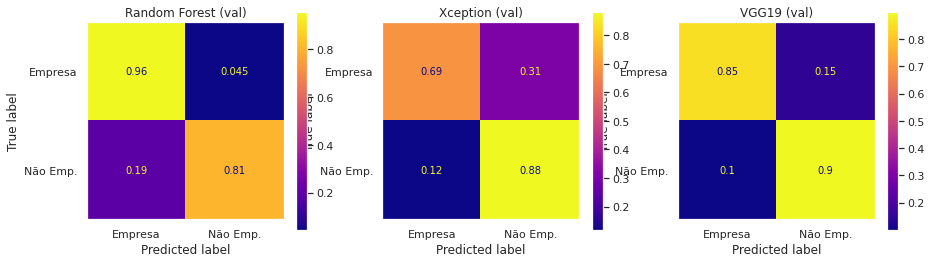

In [ ]:
# Verificando qualidade individual de cada participante

print('Random Forest (val):')
calculaMetricas2(actual1[:,0], r1, ohe=False)
print()
print('Xception (val):')
calculaMetricas2(actual1, x1)
print()
print('VGG19 (val):')
calculaMetricas2(actual1, v1)

fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(15,4))
matrizConfusao(actual1[:,0], r1, ax1, 'Random Forest (val)')
matrizConfusao(actual1[:,1], np.argmax(x1, axis=1), ax2, 'Xception (val)')
matrizConfusao(actual1[:,1], np.argmax(v1, axis=1), ax3, 'VGG19 (val)')

### 4.2.3) Agregador por votação
Melhor Acc.Bal: 88.70% (Maioria simples)

In [ ]:
decisao_maioria_sem_RF = [0,0,1]
voto_maioria_sem_RF = [(decisao_maioria_sem_RF[int(b+c)]) for b, c in zip(np.argmin(x1, axis=1), np.argmin(v1, axis=1))] 

decisao_maioria = [0,0,1,1]
voto_maioria = [(decisao_maioria[int(a+b+c)]) for a, b, c in zip(r1, np.argmin(x1, axis=1), np.argmin(v1, axis=1))] 

decisao_consenso = [0,0,0,1]
voto_consenso = [(decisao_consenso[int(a+b+c)]) for a, b, c in zip(r1, np.argmin(x1, axis=1), np.argmin(v1, axis=1))] 

decisao_minoria = [0,1,1,1]
voto_minoria = [(decisao_minoria[int(a+b+c)]) for a, b, c in zip(r1, np.argmin(x1, axis=1), np.argmin(v1, axis=1))] 

Maioria simples sem RF:
AUC-ROC: 0.804393026444395
ACU-BAL: 0.804393026444395

Maioria simples:
AUC-ROC: 0.886979673955002
ACU-BAL: 0.886979673955002

Consenso:
AUC-ROC: 0.7811173061535432
ACU-BAL: 0.7811173061535432

Voto minoria:
AUC-ROC: 0.873264940746592
ACU-BAL: 0.873264940746592


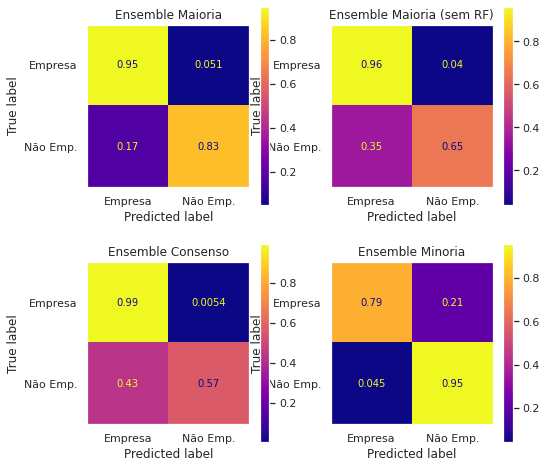

In [ ]:
# Calculando qualidade das predições por votação

print('Maioria simples sem RF:')
calculaMetricas2(actual1[:,0], voto_maioria_sem_RF, ohe=False)
print()
print('Maioria simples:')
calculaMetricas2(actual1[:,0], voto_maioria, ohe=False)
print()
print('Consenso:')
calculaMetricas2(actual1[:,0], voto_consenso, ohe=False)
print()
print('Voto minoria:')
calculaMetricas2(actual1[:,0], voto_minoria, ohe=False)

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2,figsize=(8,8))
matrizConfusao(actual1[:,0], voto_maioria,  ax1, 'Ensemble Maioria')
matrizConfusao(actual1[:,0], voto_maioria_sem_RF,  ax2, 'Ensemble Maioria (sem RF)')
matrizConfusao(actual1[:,0], voto_consenso, ax3, 'Ensemble Consenso')
matrizConfusao(actual1[:,0], voto_minoria,  ax4, 'Ensemble Minoria')

### 4.2.4) Agregador por soma das ativações
Acc.Bal: 90.20%

In [ ]:
soma_ativacoes = np.array([[float(a + b[0] + c[0])/3, float((1-a) + b[1] + c[1])/3] for a, b, c in zip(r1, x1, v1)])
voto_ativacoes = np.argmax(soma_ativacoes, axis=1)

AUC-ROC: 0.9671863003496322
ACU-BAL: 0.901977300750989


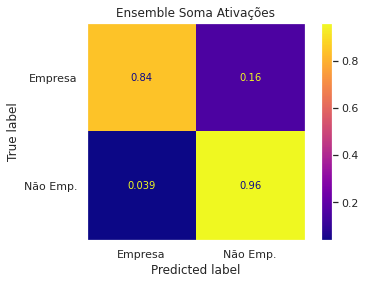

In [ ]:
calculaMetricas2(actual1, soma_ativacoes)
fig, ax = plt.subplots(figsize=(6,4))
matrizConfusao(actual1[:,1], voto_ativacoes, ax, 'Ensemble Soma Ativações')

### 4.2.5) Agregador SVC
Acc.Bal: 87.78%

Fitting 3 folds for each of 16 candidates, totalling 48 fits
AUC-ROC: 0.8777736023021357
ACU-BAL: 0.8777736023021357


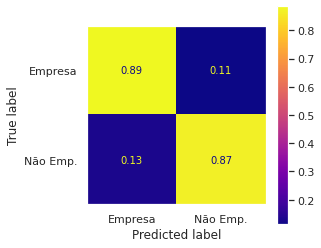

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn import svm

xval_runs = 3

params = {'C'     :[0.01, 0.1, 1.0, 4.0],
          'gamma' :[0.01, 0.05, 0.1, 1.1]}

svc = svm.SVC(C=4, gamma=1.1)
gs = GridSearchCV(svc, params, cv=xval_runs, verbose=True)
gs.fit(x_train2, y_train2['target1'])
pred = gs.predict(x_val2)

fig, ax = plt.subplots(figsize=(4,4))
calculaMetricas2(y_val2['target1'], pred, ohe=False)
matrizConfusao(y_val2['target1'], pred, ax)

### 4.2.6) Agregador MLP - 6 entradas (* Melhor resultado em validação)
Acc.Bal: 91.27%

**Obs:**
- A seção 4.2.1 é pré-requisito desta seção
- A seção 4.2.6.1  **não** é pré-requisito da seção 4.2.6.2 (caso queira apenas reproduzir as saídas do _ensemble_, não precisa retreinar a MLP antes)

#### 4.2.6.1) Construindo agregador MLP

In [ ]:
rede_ens = tf.keras.models.Sequential()
rede_ens.add(tf.keras.layers.Dense(30, activation='relu', input_shape=(6,)))
rede_ens.add(tf.keras.layers.Dense(20, activation='relu'))
rede_ens.add(tf.keras.layers.Dense(2, activation='softmax'))
rede_ens.summary()

optimizerParam = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.5,)
early = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)
lossFunction = keras.losses.CategoricalCrossentropy()

rede_ens.compile(loss=lossFunction, optimizer=optimizerParam, metrics=['accuracy'])
rede_ens.fit(x_train2, y_train2, epochs=25, callbacks=[early], validation_data=(x_val2, y_val2))


In [ ]:
path = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//ensemble_rn.rede'
rede_ens.save(path)

#### 4.2.6.2) Avaliando agregador MLP

In [ ]:
# Juntando resultados individuais em um conjunto de entrada
pre_results1 = [(a, (1-a), b[0], b[1], c[0], c[1]) for a, b, c in zip(r1, x1, v1)] 

# Salvando conjunto de entrada da MLP (opcional)
#with open("file.txt", "w") as f:
#    for s in pre_results:
#        f.write(str(s) +"\n")

In [ ]:
ensemble1 = tf.keras.models.load_model('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//ensemble_rn.rede')

In [ ]:
# Aplicando conjunto de entrada na MLP
preds1 = ensemble1.predict(pre_results1)

In [ ]:
# Salvando saída da MLP no dataframe auxiliar
#df_val3['predicted'] = np.argmin(preds, axis=1)

In [ ]:
# Convertendo resultado da MLP para cálculos de qualidade
predic1 = list(map(lambda x: int(x), np.argmax(preds1, axis=1)))

AUC-ROC: 0.9689016539144233
ACU-BAL: 0.9126967692896323


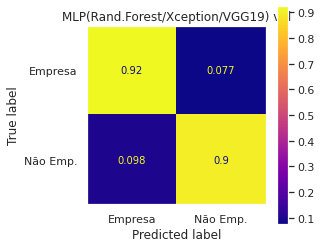

In [ ]:
# Calculando qualidade das predições
calculaMetricas2(actual1, preds1)
fig, ax = plt.subplots(figsize=(4,4))
matrizConfusao(actual1[:,1], predic1, ax, 'MLP(Rand.Forest/Xception/VGG19) val')

In [ ]:
salvaPredicted('//content//val', pathRede=None,
               pathResult='//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//Conjunto_de_Validacao//ensemble_sem_CEP_val.csv',
               imageDataGenerator=genV, predicted=preds')

### 4.2.7) Agregador MLP com CEP - 12 entradas

Acc.Bal: 91.18%

#### 4.2.7.1) Construindo agregador MLP com CEP

In [ ]:
dados  = '//content//train'
rede   = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//Functional//VGG19//Seed51//vgg19_adam_l2_0001_balanced.rede'
result = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Resultados_Redes//train//vgg19_adam_l2_bal_func_train.csv'
gen    = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

salvaPredicted(dados, rede, result, gen)

In [ ]:
# Nomeando headers das colunas
names = ['target1', 'target2', 'v1', 'v2', 'x1', 'x2', 'r1', 'r2', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6' ]

# Lendo arquivo .csv 
df_trnC = pd.read_csv("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//ensemble//cep//ensemble_rn_train_set_comCEPf2.csv", names=names, sep='\;')
df_valC = pd.read_csv("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//ensemble//cep//ensemble_rn_val_set_comCEP.csv"  , names=names, sep='\;')

# Deleta linha label
df_trnC = df_trnC.drop(labels=0, axis=0)
df_valC = df_valC.drop(labels=0, axis=0)

# Altera datatypes para float para adequar o randomforest
df_trnC = df_trnC.astype(float)
df_valC = df_valC.astype(float)

# Atribui variáveis x e y
x_trnC = df_trnC.drop('target1', axis=1).drop('target2', axis=1)
y_trnC = df_trnC[['target1','target2']]

x_valC = df_valC.drop('target1', axis=1).drop('target2', axis=1)
y_valC = df_valC[['target1','target2']]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  


In [ ]:
rede_ensC = tf.keras.models.Sequential()
rede_ensC.add(tf.keras.layers.Dense(12, activation='relu', input_shape=(12,)))
rede_ensC.add(tf.keras.layers.Dense(2, activation='softmax'))
rede_ensC.summary()

optimizerParam = tf.keras.optimizers.Adam(learning_rate=0.01, beta_1=0.9,)
early = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)
lossFunction = keras.losses.CategoricalCrossentropy()

rede_ensC.compile(loss=lossFunction, optimizer=optimizerParam, metrics=['accuracy'])
rede_ensC.fit(x_trnC, y_trnC, epochs=50, callbacks=[early], validation_data=(x_valC, y_valC))


In [ ]:
path = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//ensemble_rn_CEP_2.rede'
rede_ensC.save(path)

#### 4.2.7.2) Avaliando agregador MLP com CEP

In [ ]:
# MLP salva com mesma arquitetura do agregador MLP anterior, apenas aumentando o tamanho da entrada para 12 nós
ensembleC1 = tf.keras.models.load_model('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//ensemble_rn_CEP_2.rede')

AUC-ROC: 0.9636375721228203
ACU-BAL: 0.9117879642340686


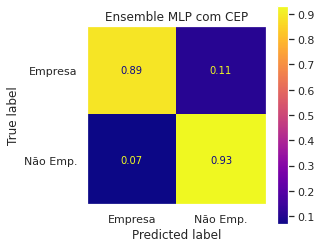

In [ ]:
# Juntando resultados individuais em um conjunto de entrada
pre_results_cep1 = [(a, (1-a), b[0], b[1], c[0], c[1], p[0]/9, p[1]/9, p[2]/9, p[3]/9, p[4]/9, p[5]/999) for a, b, c, p in zip(r1, x1, v1, ceps1)] 

# Salvando conjunto de entrada da MLP (opcional)
#with open("file.txt", "w") as f:
#    for s in pre_results:
#        f.write(str(s) +"\n")

# Aplicando conjunto de entrada na MLP
predsC1 = ensembleC1.predict(pre_results_cep1)
# Convertendo resultado da MLP para cálculos de qualidade
predicC1 = list(map(lambda x: int(x), np.argmax(predsC1, axis=1)))

#with open("file.txt", "w") as f:
#    for i in range(len(predicC)):
#        f.write(df_val3.iloc[i,9] + ";" + str(np.argmax(actual[i])) + ";" + str(predicC[i]) +"\n")
# Calculando qualidade das predições
calculaMetricas2(actual1, predsC1)
fig, ax = plt.subplots(figsize=(4,4))
matrizConfusao(actual1[:,1], predicC1, ax, 'Ensemble MLP com CEP')

### 4.2.8) Agregador MLP com CEP e tipo de logradouro - 17 entradas
Acc.bal: 89.32

#### 4.2.8.1) Construindo agregador MPL com CEP e tipo de logradouro

In [ ]:
# Nomeando headers das colunas
names = ['target1', 'target2', 'v1', 'v2', 'x1', 'x2', 'vo1', 'vo2', 'xo1', 'xo2', 'r1', 'r2', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'rav' ]

# Lendo arquivo .csv 
df_trnC = pd.read_csv("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//ensemble//cep//ensemble_rn_train_set_comCEPf3.csv", names=names, sep='\;')
df_valC = pd.read_csv("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//ensemble//cep//ensemble_rn_val_set_comCEPf3.csv"  , names=names, sep='\;')

# Deleta linha label
df_trnC = df_trnC.drop(labels=0, axis=0)
df_valC = df_valC.drop(labels=0, axis=0)

# Altera datatypes para float para adequar o randomforest
df_trnC = df_trnC.astype(float)
df_valC = df_valC.astype(float)

# Atribui variáveis x e y
x_trnC = df_trnC.drop('target1', axis=1).drop('target2', axis=1)
y_trnC = df_trnC[['target1','target2']]

x_valC = df_valC.drop('target1', axis=1).drop('target2', axis=1)
y_valC = df_valC[['target1','target2']]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  


In [ ]:
rede_ensC2 = tf.keras.models.Sequential()
rede_ensC2.add(tf.keras.layers.Dense(30, activation='relu',  kernel_regularizer='l2', input_shape=(17,)))
rede_ensC2.add(tf.keras.layers.Dense(2, activation='softmax'))
rede_ensC2.summary()

optimizerParam = tf.keras.optimizers.Adam(learning_rate=0.01, beta_1=0.9,)
early = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=50, restore_best_weights=True)
lossFunction = keras.losses.CategoricalCrossentropy()

rede_ensC2.compile(loss=lossFunction, optimizer=optimizerParam, metrics=['accuracy'])
rede_ensC2.fit(x_trnC, y_trnC, epochs=50, callbacks=[early], validation_data=(x_valC, y_valC))


In [ ]:
path = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//ensemble_rn_CEP_f3.rede'
rede_ensC2.save(path)

INFO:tensorflow:Assets written to: //content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//ensemble_rn_CEP_f3.rede/assets


#### 4.2.8.2) Avaliando agregador MPL com CEP e tipo de logradouro

AUC-ROC: 0.9596646922631844
ACU-BAL: 0.8932083758337104


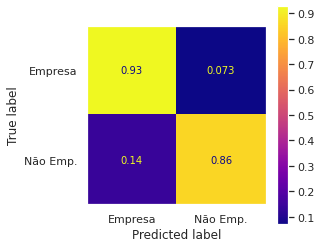

In [ ]:
rede_ensC2 = tf.keras.models.load_model('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//ensemble_rn_CEP_f3.rede')

predC = rede_ensC2.predict(x_valC)
calculaMetricas2(y_valC.to_numpy(), predC)
fig, ax = plt.subplots(figsize=(4,4))
matrizConfusao(y_valC['target2'], np.argmax(predC, axis=1), ax)

# Parte 5: Resultados de teste



## 5.1) Rodando melhores classificadores no conjunto de teste

Resumo dos Resultados de teste

| Classificador | AUC-ROC | Acurácia Balanceada |
|---------------|---------|---------------------|
| Baseline      | 0.8983  | 81.76 %             |
| Xception      | 0.8729  | 78.99 %             |
| Random Forest | 0.8733  | 87.33 %             |
| VGG-19        | 0.9397  | 87.44 %             |
| Ensemble MLP  | 0.9651  | 90.18 %             |

### 5.1.1) Carregando base de testes

In [ ]:
# Preparando dados tabulares (teste)

names = ['id', 'tipo_logradouro', 'nome_logradouro', 'numero_logradouro', 'municipio', 'cep', 'regiao', 'subregiao', 'setor','subsetor','divisorsubsetor','sufixodist','empresa']
df_tst = pd.read_csv("//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//split_train_val_test//random_forest//dados_tabulares_com_CEP__TEST.csv", names=names, sep='\;')
df_tst = df_tst.drop(labels=0, axis=0)

ids_tst = df_tst["id"]
del df_tst["tipo_logradouro"]
del df_tst["nome_logradouro"]
del df_tst["numero_logradouro"]
del df_tst["municipio"]

df_tst2 = df_tst.astype(float)
del df_tst2["id"]
del df_tst2["cep"]
del df_tst2["empresa"]

arqs = []
for index, row in df_tst.iterrows():
  arq = ['imagens_nao_empresas', 'imagens_empresas'][int(row['empresa'])] + '/' + row['id'] + '.jpg'
  arqs.append(arq)
df_tst['Arquivo'] = arqs

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  after removing the cwd from sys.path.


In [ ]:
# Preparando dados de imagens (teste)

tstPath = '//content//test'

genX = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.xception.preprocess_input)
datasetX = genX.flow_from_directory(
        tstPath,
        target_size=(224, 224),
        batch_size=2202,
        class_mode='categorical',
        shuffle=False)
genV = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)
datasetV = genV.flow_from_directory(
        tstPath,
        target_size=(224, 224),
        batch_size=2202,
        class_mode='categorical',
        shuffle=False)
genR = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input)
datasetR = genR.flow_from_directory(
        tstPath,
        target_size=(224, 224),
        batch_size=2202,
        class_mode='categorical',
        shuffle=False)

qtdImagens = len(datasetV.filenames)

idxs = []
for i in range(len(datasetX.filenames)):
  idxs.append((df_tst.index[df_tst['Arquivo']==datasetX.filenames[i]])[0])

tstX = datasetX.next()
tstV = datasetV.next()
tstR = datasetR.next()

Found 2202 images belonging to 2 classes.
Found 2202 images belonging to 2 classes.
Found 2202 images belonging to 2 classes.


In [ ]:
# Reordenando dados tabulares auxiliares para ficarem na mesma ordem das imagens

df_tst = df_tst.reindex(idxs)
df_tst2 = df_tst2.reindex(idxs)

# Definindo 'ground truth' com ordem comum para 2 origens de dados
actual = np.array(list(map(lambda x: [int(x), 1-int(x)], df_tst['empresa'])))

# Carregando CEPs
ceps = np.array(list(zip(df_tst2['regiao'], df_tst2['subregiao'], df_tst2['setor'],df_tst2['subsetor'],df_tst2['divisorsubsetor'],df_tst2['sufixodist'])))

### 5.1.2) Resultados dos classificadores individuais

In [ ]:
# Carregando predição do baseline

baseline = tf.keras.models.load_model('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//Congeladas//resnet50_congelada_seed42.rede')
b = baseline.predict(tstR[0])

In [ ]:
# Carregando classificadores participantes do ensemble

import joblib
random_forest = joblib.load('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//randomforest.rede')
xception = tf.keras.models.load_model('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//xception_functional.rede')
vgg19b = tf.keras.models.load_model('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//Functional//VGG19//Seed42//vgg19_adam_l2_0001_balanced.rede')


In [ ]:
# Carregando predição da Random Forest
r = random_forest.predict(df_tst2)

# Carregando  predição da Xception
x = xception.predict(tstX[0])

# Carregando  predição da VGG19
v2 = vgg19b.predict(tstV[0])

Baseline (teste):
AUC-ROC: 0.8982674446296737
ACU-BAL: 0.8175883713809411

Random Forest (teste):
AUC-ROC: 0.8733210288163848
ACU-BAL: 0.8733210288163848

Xception (teste):
AUC-ROC: 0.8728659885006635
ACU-BAL: 0.7898913006498146

VGG19 (teste):
AUC-ROC: 0.9397033307250026
ACU-BAL: 0.8744156772020548


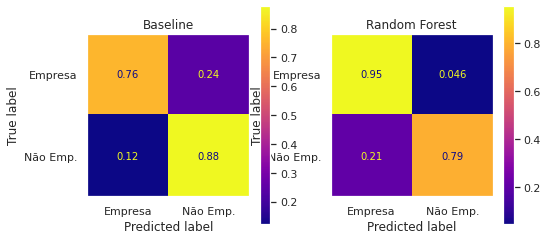

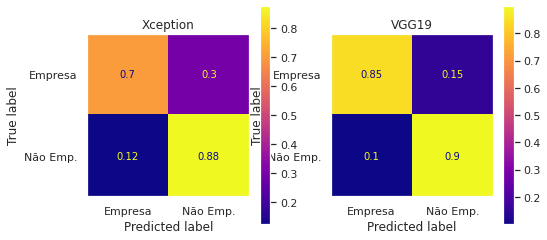

In [ ]:
# Verificando qualidade individual de cada participante

print('Baseline (teste):')
calculaMetricas2(actual, b)
print()
print('Random Forest (teste):')
calculaMetricas2(actual[:,0], r, ohe=False)
print()
print('Xception (teste):')
calculaMetricas2(actual, x)
print()
print('VGG19 (teste):')
calculaMetricas2(actual, v2)

fig, axs = plt.subplots(1,2,figsize=(8,4))
matrizConfusao(actual[:,1], np.argmax(b, axis=1), axs[0], 'Baseline')
matrizConfusao(actual[:,0], r, axs[1], 'Random Forest')
fig, axs = plt.subplots(1,2,figsize=(8,4))
matrizConfusao(actual[:,1], np.argmax(x, axis=1), axs[0], 'Xception')
matrizConfusao(actual[:,1], np.argmax(v2, axis=1), axs[1], 'VGG19')

### 5.1.3) Resultado do _ensemble_ 
(versão com maior acurácia em validação: 3 classificadores com topo MLP - 6 entradas)

AUC-ROC: 0.9650622597217025
ACU-BAL: 0.9016398462218895


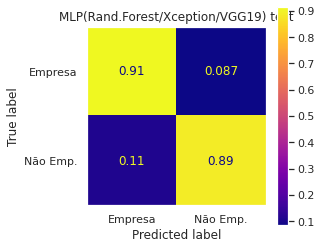

In [ ]:
# Juntando resultados individuais em um conjunto de entrada
pre_results = [(a, (1-a), b[0], b[1], c[0], c[1]) for a, b, c in zip(r, x, v2)] 


# Aplicando conjunto de entrada na MLP
ensemble = tf.keras.models.load_model('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//ensemble_rn.rede')
preds = ensemble.predict(pre_results)

# Convertendo resultado da MLP para cálculos de qualidade
predic = list(map(lambda x: int(x), np.argmax(preds, axis=1)))

# Calculando qualidade das predições
calculaMetricas2(actual, preds)
fig, ax = plt.subplots(figsize=(4,4))
matrizConfusao(actual[:,1], predic, ax, 'MLP(Rand.Forest/Xception/VGG19) test')

## 5.2) Resultados para Relatório

In [ ]:
dados = "//content//val"

### 25 Épocas - Treino Original

####Resnet50

##### Seed 51

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.8995278303972922
ACU-BAL: 0.8096677599595745


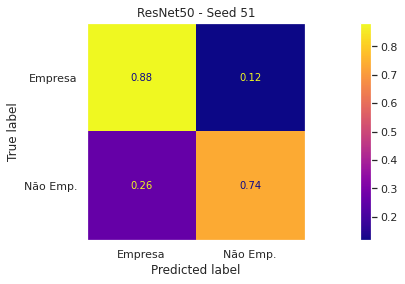

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models/resnet50.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//resnet50_rede_25_epocas_seed51.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'ResNet50 - Seed 51')

#####Seed 42

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.9046057200607744
ACU-BAL: 0.819018695053084


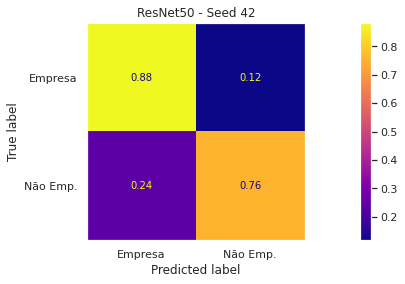

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//seed_42//resnet50.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//resnet50_rede_25_epocas_seed42.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'ResNet50 - Seed 42')

####VGG19

#####Seed 51

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.9300053940328192
ACU-BAL: 0.8543065770558466


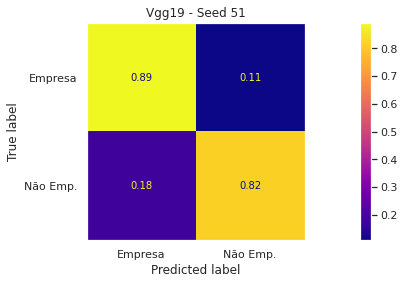

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models/vgg19.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//vgg19_rede_25_epocas_seed51.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'Vgg19 - Seed 51')

#####Seed 42

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.9217924890862441
ACU-BAL: 0.8522524986813167


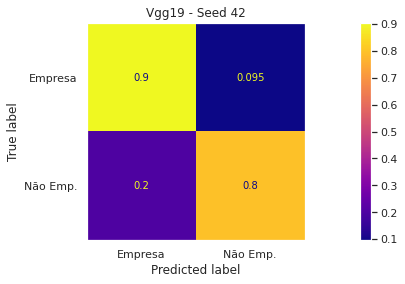

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//seed_42//vgg19.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//vgg19_rede_25_epocas_seed42.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'Vgg19 - Seed 42')

####VGG16

#####Seed 51

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.919367304662302
ACU-BAL: 0.8420532603221593


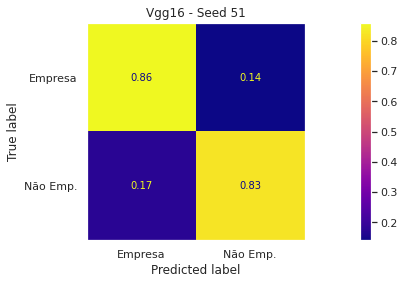

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models/vgg16.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//vgg16_rede_25_epocas_seed51.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg16.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'Vgg16 - Seed 51')

#####Seed 42

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.9223855770549945
ACU-BAL: 0.8430643219240592


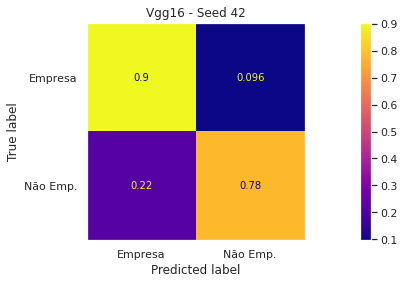

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//seed_42//vgg16.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//vgg16_rede_25_epocas_seed42.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg16.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'Vgg16 - Seed 42')

####Xception

#####Seed 51

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.7968846264951824
ACU-BAL: 0.6727718085518855


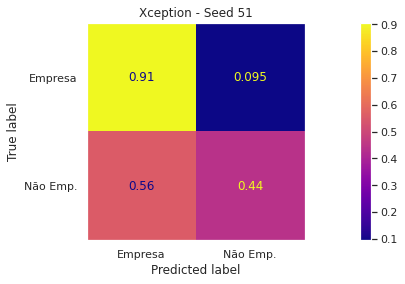

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models/xception.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//xception_rede_25_epocas_seed51.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.xception.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'Xception - Seed 51')

#####Seed 42

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.7885223843840619
ACU-BAL: 0.6544857816533008


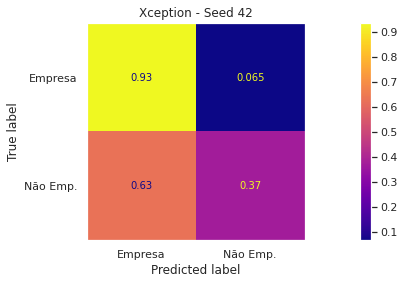

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//seed_42//xception.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//xception_rede_25_epocas_seed42.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.xception.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'Xception - Seed 42')

####Resnet101

#####Seed 51

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.9104283782367392
ACU-BAL: 0.8233799367543261


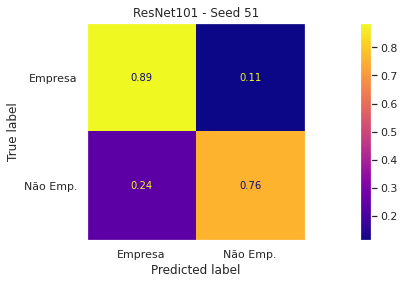

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models/resnet101.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//resnet101_rede_25_epocas_seed51.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'ResNet101 - Seed 51')

#####Seed 42

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.9108697856617576
ACU-BAL: 0.8215670134015725


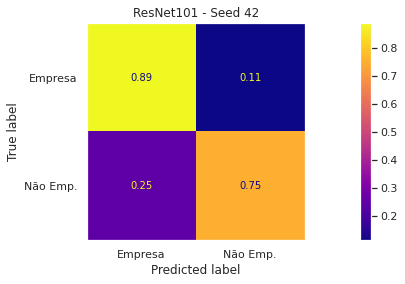

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//seed_42//resnet101.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//resnet101_rede_25_epocas_seed42.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'ResNet101 - Seed 42')

### 25 Épocas - Treino Aumentado

####ResNet50

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.9161359977980756
ACU-BAL: 0.8397806085798355


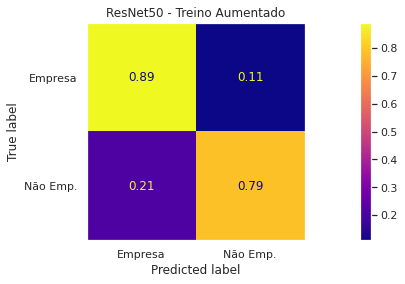

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//train_aumentado//resnet50.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//resnet50_rede_25_epocas_train_aumentado.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'ResNet50 - Treino Aumentado')

####VGG16

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.932139999437589
ACU-BAL: 0.852600597007803


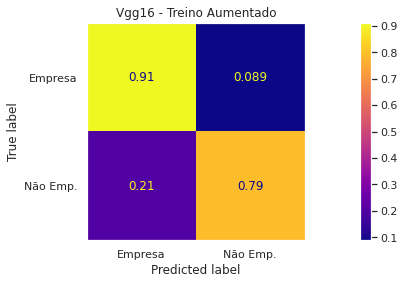

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//train_aumentado//vgg16.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//vgg16_rede_25_epocas_train_aumentado.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg16.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'Vgg16 - Treino Aumentado')

####VGG19

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.9314224993374627
ACU-BAL: 0.857079433737332


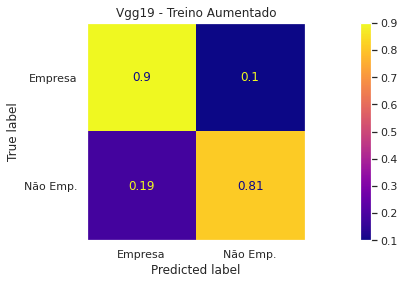

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//train_aumentado//vgg19.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//vgg19_rede_25_epocas_train_aumentado.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'Vgg19 - Treino Aumentado')

### VGG19 - Otimizadores SGD x Adam, Com x Sem Regul. L2, Treino Original x Aumentado, Com x Sem Balanceamento

#### Balanceamento = Não, Otimizador = Adam, Regularização L2 = Não, Treino = Original, Learning Rate = 0.001

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.8951129040092235
ACU-BAL: 0.8283231886317989


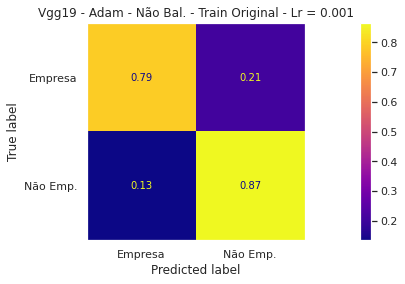

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//vgg19_adam_001_train_orig.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//vgg19_1.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'Vgg19 - Adam - Não Bal. - Train Original - Lr = 0.001')

#### Balanceamento = Não, Otimizador = Adam, Regularização L2 = Não, Treino = Original, Learning Rate = 0.0001

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.9220151101089971
ACU-BAL: 0.851488557066396


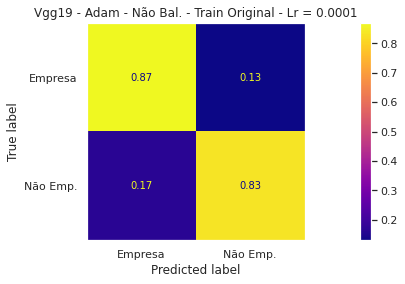

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//vgg19_adam.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//vgg19_2.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'Vgg19 - Adam - Não Bal. - Train Original - Lr = 0.0001')

#### Balanceamento = Não, Otimizador = SGD, Regularização L2 = Não, Treino = Original, Learning Rate = 0.00005

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.921270980699929
ACU-BAL: 0.8328995951492904


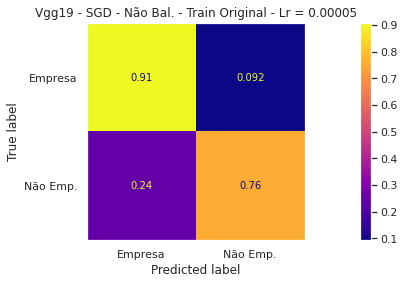

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//vgg19_adam_00005.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//vgg19_3.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'Vgg19 - SGD - Não Bal. - Train Original - Lr = 0.00005')

#### Balanceamento = Não, Otimizador = Adam, Regularização L2 = Não, Treino = Aumentado, Learning Rate = 0.0001

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.944957857520841
ACU-BAL: 0.8744626205455557


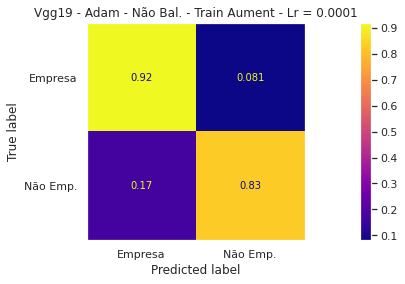

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//vgg19_adam_l2.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//vgg19_4.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'Vgg19 - Adam - Não Bal. - Train Aument - Lr = 0.0001')

#### Balanceamento = Sim, Otimizador = Adam, Regularização L2 = Não, Treino = Original, Learning Rate = 0.0001

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.9415791308023134
ACU-BAL: 0.8773019439821597


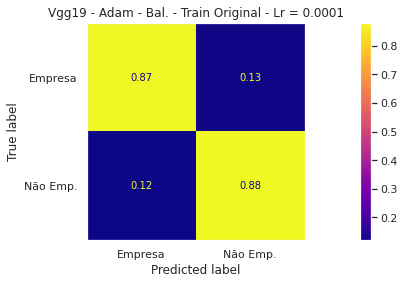

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//Pesos_Classes//VGG19//41_59//vgg19_adam_l2.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//vgg19_5.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'Vgg19 - Adam - Bal. - Train Original - Lr = 0.0001')

#### Balanceamento = Sim, Otimizador = Adam, Regularização L2 = Sim, Treino = Aumentado, Learning Rate = 0.0001

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.9440068716399139
ACU-BAL: 0.8748439522496014


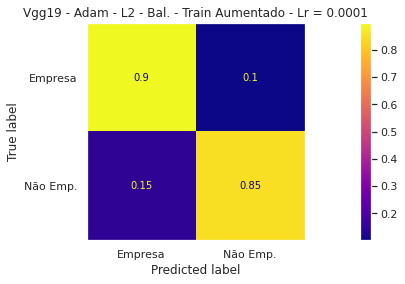

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//Functional//VGG19//Seed42//vgg19_adam_l2_0001_balanced.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//vgg19_6.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'Vgg19 - Adam - L2 - Bal. - Train Aumentado - Lr = 0.0001')

#### Balanceamento = Sim, Otimizador = Adam, Regularização L2 = Sim, Treino = Original, Learning Rate = 0.0001

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.9291259877343272
ACU-BAL: 0.8546998386902982


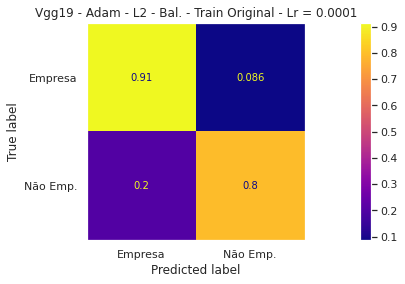

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Saved_models//Functional//VGG19//Seed42//vgg19_adam_l2_0001_balanced_train_normal.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//vgg19_7.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'Vgg19 - Adam - L2 - Bal. - Train Original - Lr = 0.0001')

###Tabela 3.4 Relatório

#### CNN Simples - Aprendiz. todos os parâmetros - Seed 51

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.6699459062869881
ACU-BAL: 0.6652159019155208


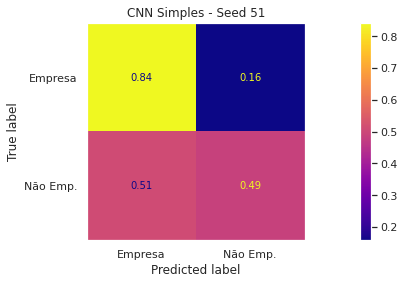

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//baseline.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//baseline51.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator()

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'CNN Simples - Seed 51')

#### CNN Simples - Aprendiz. todos os parâmetros - Seed 42

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.6535460865993648
ACU-BAL: 0.647481208229266


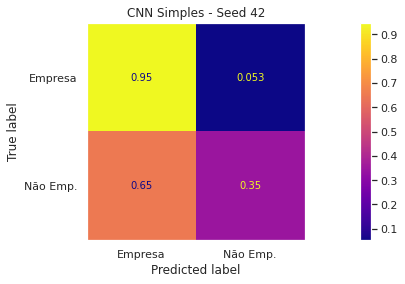

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//baseline_seed42.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//baseline42.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator()

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'CNN Simples - Seed 42')

#### Transf. Aprend. - Cong. - Resnet - 50 (baseline) - Seed 51

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.9006500959933328
ACU-BAL: 0.8105599483263586


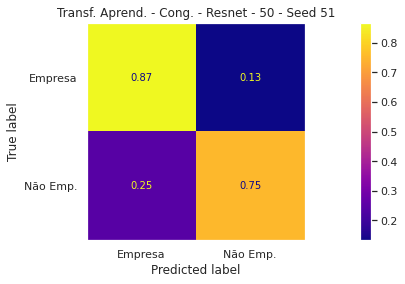

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//resnet50_congelada.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//resnet_cong_seed51.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'Transf. Aprend. - Cong. - Resnet - 50 - Seed 51')

#### Transf. Aprend. - Cong. - Resnet - 50 (baseline) - Seed 42

Found 2200 images belonging to 2 classes.
AUC-ROC: 0.8970530089414828
ACU-BAL: 0.8167341133803543


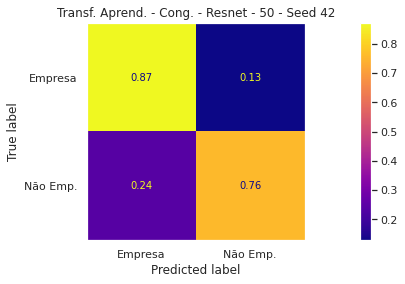

In [ ]:
pathRede = "//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//resnet50_congelada_seed42.rede"

pathResult = "//content//drive//MyDrive//Trabalho_Final//Metricas_Relatorio//resnet_cong_seed42.csv"
imageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input)

salvaPredicted(dados, pathRede, pathResult, imageDataGenerator)
fig, axs = plt.subplots(1, 1, figsize=(20,4))
calculaMetricas(pathResult, axs, 'Transf. Aprend. - Cong. - Resnet - 50 - Seed 42')

# Parte 6: Análise dos resultados

(tentando extrair explicações sobre o modelo)

## 6.1) Estudando técnica para extrair 'explicação' de Random Forest

Referência: https://blog.datadive.net/interpreting-random-forests/

Esse método explicado abaixo é usado na função 'mapa_ativacao_CEP' apresentado na seção 6.3

**Termos de licença da biblioteca 'Tree Interpreter':**

Copyright (c) 2015, Ando Saabas
All rights reserved.

Redistribution and use in source and binary forms, with or without modification, are permitted provided that the following conditions are met:

* Redistributions of source code must retain the above copyright notice, this list of conditions and the following disclaimer.

* Redistributions in binary form must reproduce the above copyright notice, this list of conditions and the following disclaimer in the documentation and/or other materials provided with the distribution.

* Neither the name of TreeInterpreter nor the names of its contributors may be used to endorse or promote products derived from this software without specific prior written permission.

THIS SOFTWARE IS PROVIDED BY THE COPYRIGHT HOLDERS AND CONTRIBUTORS "AS IS" AND ANY EXPRESS OR IMPLIED WARRANTIES, INCLUDING, BUT NOT LIMITED TO, THE IMPLIED WARRANTIES OF MERCHANTABILITY AND FITNESS FOR A PARTICULAR PURPOSE ARE DISCLAIMED. IN NO EVENT SHALL THE COPYRIGHT HOLDER OR CONTRIBUTORS BE LIABLE FOR ANY DIRECT, INDIRECT, INCIDENTAL, SPECIAL, EXEMPLARY, OR CONSEQUENTIAL DAMAGES (INCLUDING, BUT NOT LIMITED TO, PROCUREMENT OF SUBSTITUTE GOODS OR SERVICES; LOSS OF USE, DATA, OR PROFITS; OR BUSINESS INTERRUPTION) HOWEVER CAUSED AND ON ANY THEORY OF LIABILITY, WHETHER IN CONTRACT, STRICT LIABILITY, OR TORT (INCLUDING NEGLIGENCE OR OTHERWISE) ARISING IN ANY WAY OUT OF THE USE OF THIS SOFTWARE, EVEN IF ADVISED OF THE POSSIBILITY OF SUCH DAMAGE.

In [ ]:
# O colab não possui essa lib, então precisa instalar antes de usar
pip install treeinterpreter

In [ ]:
# Como usar a lib 'treeinterpreter':

# 1) carregar exemplo de dado de entrada
dadosTabulares = carregar_dados_tabulares()
linha = dadosTabulares[dadosTabulares['Arquivo']=='imagens_nao_empresas/1704.jpg']
cep = str(int((np.asarray(linha[['cep']]).flatten())[0]))
if len(cep) < 8:
  cep = cep.zfill(8)
cep = '{}-{}'.format(cep[:5], cep[6:9].zfill(3))
rfX = linha[['regiao', 'subregiao', 'setor', 'subsetor', 'divisorsubsetor', 'sufixodist']]

# 2) carregar a Random Forest treinada
import joblib
random_forest = joblib.load('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//randomforest.rede')

# 3) rodar função importada
prediction, bias, contributions = ti.predict(random_forest, rfX.values)

# 4) Cada entrada da random forest (elementos do CEP) tem um valor de contribuição.
#    A decisão da random forest é determinada pela soma das contribuições + bias.
# São dois vetores somados, o vetor 0 representa 'empresa' e o vetor 1 representa 'não empresa'

In [ ]:
bias

array([[0.58709331, 0.41290669]])

In [ ]:
contributions

array([[[ 0.09715433, -0.09715433],
        [ 0.03650382, -0.03650382],
        [-0.13363021,  0.13363021],
        [-0.17798665,  0.17798665],
        [-0.07860102,  0.07860102],
        [-0.04053358,  0.04053358]]])

array([1.])

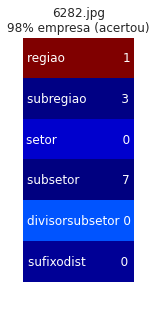

In [ ]:
# Exemplo de como esse método é usado (código da função está na seção 5.3))

linhaDadosTabulares = dadosTabulares[dadosTabulares['Arquivo'] == 'imagens_empresas/6282.jpg']
fig,ax = plt.subplots(figsize=(2, 4.5))

# O 'mapa de ativação' de CEP indica nas cores quentes (colormap 'jet') qual parte do CEP teve maior influência na decisão da classe
mapa_ativacao_CEP(random_forest, linhaDadosTabulares, ax)

# Nesse exemplo, o CEP é 13.070-000
# A RF classificou esse CEP como 'empresa' devido principalmente ao dado regiao=1 (interior de SP)
# Esse resultado em particular é um indício de que a maioria do endereços no interior de SP são referentes a empresas

## 6.2) Estudando técnica para extrair 'explicação' de CNN

CAM (Mapa de ativações por classe)

**Referências**

As funções usadas para criação do mapa de ativação foram baseadas no código em:

Blog:  https://jacobgil.github.io/deeplearning/class-activation-maps

GitHub: https://github.com/jacobgil/keras-cam

Esse método explicado abaixo é usado na função 'mapa_ativacao' apresentado na seção 6.3

##### 6.2.1) Aprendendo a usar CAM

In [ ]:
# Carregando CNN treinada
modelo = tf.keras.models.load_model('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//Functional//VGG19//Seed42//vgg19_adam_l2_0001_balanced.rede')

In [ ]:
# Verificando arquitetura para saber qual a última camada CNN
# (vamos extrair a ativação dessa camada)
modelo.summary()

Model: "Finetuned_VGG19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)   

In [ ]:
# Salvando nome da última camada CNN (quarta camada a partir do topo)
ultimaCamadaConv = modelo.layers[-4].name
ultimaCamadaConv

'block5_conv4'

In [ ]:
# Definindo imagem a ser passada pela CNN
pathImagem = '//content//test//imagens_empresas//1003.jpg'

In [ ]:
# Processando imagem para passar pela CNN

# converte imagem para 224x224
original_img = Image.open(pathImagem)
img_224_224 = np.array(original_img.resize((224,224)))

# define pré-processamento
gen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)

# executa pré-processamento
gerador = gen.flow(np.array([img_224_224]), np.array([0]))
single_input = gerador.next()
img = single_input[0]

In [ ]:
# Construindo função para extrair as ativações

# Seleciona 3 camadas da CNN:
# a) entrada (224x224)
a = modelo.layers[0].input
# b) saída da última camada Conv
layer_dict = dict([(layer.name, layer) for layer in modelo.layers])
final_conv_layer = layer_dict[ultimaCamadaConv]
b = final_conv_layer.output
# c) saída com 2 nós FC
c = modelo.layers[-1].output

# cria função que extrai as ativações das camadas 'b' e 'c' a partir da entrada 'a'
get_output = K.function([a], [b, c])

# Salva pesos da camada de saída
class_weights = modelo.layers[-1].get_weights()[0]
class_weights = (class_weights + 1)/2

In [ ]:
# Passando imagem pela CNN para salvar as ativações

# get_output é a função que mapeia as camadas da CNN
[conv_outputs, predictions] = get_output(img)


In [ ]:
conv_outputs.shape

(1, 14, 14, 512)

In [ ]:
predictions.shape

(1, 2)

In [ ]:
# Determina qual classe escolhida (a partir das ativações da saída 'c')
target_class = np.argmax(predictions)

# Soma produto das ativações pelos pesos para o nó da classe escolhida pela rede
cam = np.zeros(dtype = np.float32, shape = conv_outputs.shape[1:3])
for i, w in enumerate(class_weights[:, target_class]):
  cam += w * conv_outputs[0, :, :, i]

# Processa soma de ativções x pesos para formato de mapa 224x224
cam2 = cam + np.abs(np.min(cam))
cam3 = np.array(255 - cam2/np.max(cam2)*255)
cam4 = (Image.fromarray(cam3)).resize((224,224))
cam5 = np.array(cam4).astype('uint8')

# Colore o mapa usando o esquema de cores escolhido
heatmap = cv2.applyColorMap(cam5, cv2.COLORMAP_JET)

# Converte para imagem, e adiciona transparência (alpha de 0 a 255)
hm = Image.fromarray(heatmap)
hm.putalpha(100)

# Adiciona mapa transparente sobre imagem original
original = Image.fromarray(img_224_224)
processada = original
processada.paste(hm, (0,0), mask = hm)


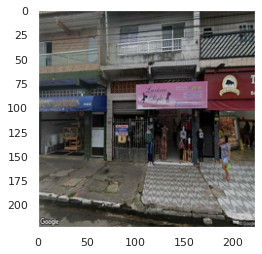

In [ ]:
# Visualizando resultado:
img_original = Image.fromarray(img_224_224)
plt.imshow(img_original)
plt.grid(False)

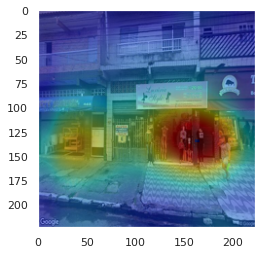

In [ ]:
# Visualizando resultado:
plt.imshow(processada)
plt.grid(False)

#### 6.2.2) Alguns testes aleatórios

- Testes usando a **função definida na seção 6.3.1**
- Fotos de fora da base do problema 'empresas/não-empresas'
- O objetivo aqui é apenas sanar a curiosidade sobre o que a CNN retorna para imagens inesperadas
- Os testes com dados da base do problema está na seção 6.3

In [ ]:
# 1) Rodar célula 6.3.1

# 2) Rodar esta célula
vgg19b = tf.keras.models.load_model('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//Functional//VGG19//Seed42//vgg19_adam_l2_0001_balanced.rede')


array([[0.993471  , 0.00652899]], dtype=float32)

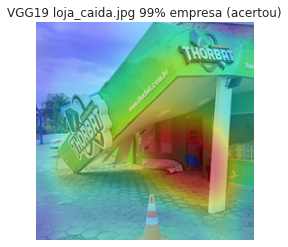

In [ ]:
# O código da seção 6.2.1 foi usado para criar a função 'mapa_ativacao' apresentada na seção 6.3.1

# Exemplo de verificação de imagem de fora da base (imagem da 'internet')

path = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Arquivos_Sem_Separacao//Fotos_Aleatorias//'

mapa_ativacao(vgg19b, path+'imagens_empresas//loja_caida.jpg')

array([[0.35773998, 0.64226   ]], dtype=float32)

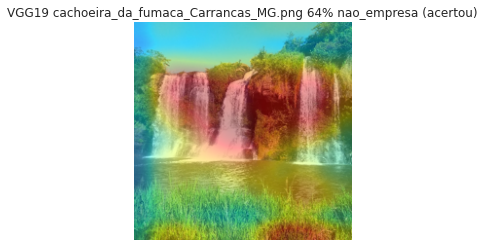

In [ ]:
# Exemplo de verificação de imagem de fora da base (imagem da 'internet')

mapa_ativacao(vgg19b, path+'imagens_nao_empresas//cachoeira_da_fumaca_Carrancas_MG.png')

array([[0.32792604, 0.67207396]], dtype=float32)

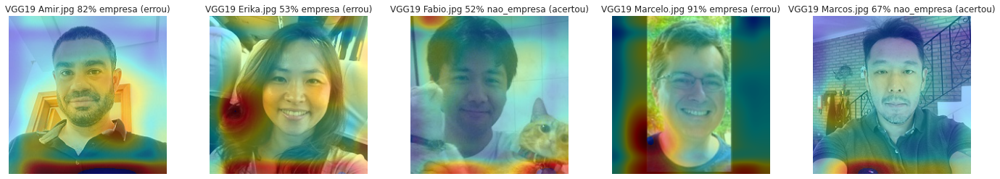

In [ ]:
# O que acontece se usar fotos de pessoas?

# A rede obviamente não foi treinada para isso. 
# Quase sempre o resultado de fotos de pessoas é 'empresa'.
# Mas percebemos que é possível manipular o resultado.
# É possível aumentar a chance da CNN classificar como 'não empresa', ao adicionar certos elementos na foto.

path = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Arquivos_Sem_Separacao//Fotos_Grupo//'

fig, ax = plt.subplots(1, 5, figsize=(24,4))
mapa_ativacao(vgg19b, path+'imagens_nao_empresas//Amir.jpg', ax[0])
mapa_ativacao(vgg19b, path+'imagens_nao_empresas//Erika.jpg', ax[1])
mapa_ativacao(vgg19b, path+'imagens_nao_empresas//Fabio.jpg', ax[2])
mapa_ativacao(vgg19b, path+'imagens_nao_empresas//Marcelo.jpg', ax[3])
mapa_ativacao(vgg19b, path+'imagens_nao_empresas//Marcos.jpg', ax[4])

array([[0.45901406, 0.54098594]], dtype=float32)

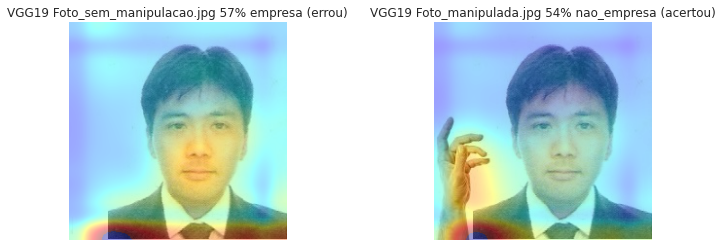

In [ ]:
# Manipulando o resultado de fotos de pessoas
path = '//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Arquivos_Sem_Separacao//Fotos_Aleatorias//'

fig, ax = plt.subplots(1, 2, figsize=(12,4))
mapa_ativacao(vgg19b, path+'imagens_nao_empresas//Foto_sem_manipulacao.jpg', ax[0])
mapa_ativacao(vgg19b, path+'imagens_nao_empresas//Foto_manipulada.jpg', ax[1])


## 6.3) Tentando entender os resultados do _ensemble_

(usando as técnicas das seções 6.1 e 6.2)

**Obs:** 
- As seções 6.3.1 e 6.3.2 são pré-requisitos para executar qualquer dos exemplos apresentados.

### 6.3.1) Definindo funções de interpretação

In [ ]:
pip install treeinterpreter

In [ ]:
import cv2
from PIL import Image
from keras import backend as K
from treeinterpreter import treeinterpreter as ti

def mapa_ativacao_CEP(r, linhaDadosTabulares, ax):
  dados = linhaDadosTabulares
  cep = str(int((np.asarray(dados[['cep']]).flatten())[0]))
  if len(cep) < 8:
    cep = cep.zfill(8)
  cep = '{}-{}'.format(cep[0:5], cep[5:8].zfill(3))

  rfX = dados[['regiao', 'subregiao', 'setor', 'subsetor', 'divisorsubsetor', 'sufixodist']]

  prediction, bias, contributions = ti.predict(r, rfX.values)
  escolha = np.argmax(prediction)
  predicao = (['não empresa', 'empresa'])[escolha]
  titulo = 'RandomForest CEP ' + cep + ' '
  # Alt Code para rodar fora do ensemble ############
  #titulo = ((list(dados['Arquivo'])[0]).split('/'))[-1] + '\n'
  ###################################################
  titulo += str(int(100*(prediction[0])[escolha])) + '% ' + predicao
  if (int(((np.asarray(dados[['GroundTruth']])).flatten())[0]) == escolha):
    titulo += ' (acertou)'
  else:
    titulo += ' (errou)'
  cont = contributions[0]
  bias = 100 * bias[0]

  cepParts = np.asarray(['regiao              ',
                         'subregiao        ',
                         'setor                ',
                         'subsetor          ',
                         'divisorsubsetor',
                         'sufixodist        '])
  digitosCEP = (np.asarray(rfX))[0]
  contribs = np.asarray(100 * cont[:,1])
  df = pd.DataFrame({' ': cont[:,1]}, index=digitosCEP)
  labels = (np.asarray(["{0} {1}".format(string, value)
                        for string, value in zip(cepParts.flatten(),
                                                digitosCEP.flatten())])
          ).reshape(6, 1)
  ax = sns.heatmap(df, annot=labels, fmt="", cmap='jet', cbar=False)
  ax.axes.get_yaxis().set_visible(False)
  ax.set_title(titulo)
  return r.predict(rfX)


def mapa_ativacao(modelo, pathImagem, optionalAX=None, optionalGenerator=None, ultimaCamadaConv='block5_conv4'):

  # converte imagem para 224x224
  original_img = Image.open(pathImagem)
  img_224_224 = np.array(original_img.resize((224,224)))

  # define pré-processamento
  if (optionalGenerator == None):
    tipo = 'VGG19 '
    #tipo = ' '
    gen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg19.preprocess_input)
  else:
    tipo = 'Xception '
    gen = optionalGenerator

  # executa pré-processamento
  gerador = gen.flow(np.array([img_224_224]), np.array([0]))
  single_input = gerador.next()
  img = single_input[0]

  # extrai 3 camadas da CNN: a) entrada 224x224, b) saída da última camada Conv c) saída com 2 nós FC
  class_weights = modelo.layers[-1].get_weights()[0]
  class_weights = (class_weights + 1)/2
  layer_dict = dict([(layer.name, layer) for layer in modelo.layers])
  final_conv_layer = layer_dict[ultimaCamadaConv]
  a = modelo.layers[0].input
  b = final_conv_layer.output
  c = modelo.layers[-1].output
  get_output = K.function([a], [b, c])

  # Passa imagem pelas camadas extraídas, salvando ativações e classificação da rede
  [conv_outputs, predictions] = get_output(img)
  target_class = np.argmax(predictions)

  # Soma produto das ativações pelos pesos para o nó da classe escolhida pela rede
  cam = np.zeros(dtype = np.float32, shape = conv_outputs.shape[1:3])
  for i, w in enumerate(class_weights[:, target_class]):
    cam += w * conv_outputs[0, :, :, i]

  # Processa soma de ativções x pesos para formato de mapa 224x224
  cam2 = cam + np.abs(np.min(cam))
  cam3 = np.array(255 - cam2/np.max(cam2)*255)
  cam4 = (Image.fromarray(cam3)).resize((224,224))
  cam5 = np.array(cam4).astype('uint8')

  # Colore o mapa usando o esquema de cores escolhido
  heatmap = cv2.applyColorMap(cam5, cv2.COLORMAP_JET)

  # Converte para imagem, e adiciona transparência (alpha de 0 a 255)
  hm = Image.fromarray(heatmap)
  hm.putalpha(100)

  # Adiciona mapa transparente sobre imagem original
  original = Image.fromarray(img_224_224)
  original.paste(hm, (0,0), mask = hm)

  # Determina se a rede acertou e qual o grau de confiança da predição
  dir  = ['imagens_empresas','imagens_nao_empresas']
  conf = int(100 * predictions[0,target_class])
  t = pathImagem.split('//')
  titulo = tipo + t[-1] + ' ' + str(conf) + '% ' + (['empresa','nao_empresa'])[target_class]
  if (dir[target_class] == t[-2]):
    titulo += ' (acertou)'
  else:
    titulo += ' (errou)'

  # Plotar imagem, diretamente ou usando eixo pyplot (ax) caso fornecido
  if (optionalAX == None):
    plt.title(titulo)
    plt.axis('off')
    plt.grid(False)
    plt.imshow(original)
  else:
    optionalAX.axis('off')
    optionalAX.set_title(titulo)
    optionalAX.grid(False)
    optionalAX.imshow(original)

  return predictions

def classificaComEnsemble(pathImagem, v, x, r, e, dadosTabulares):
  fig, axs = plt.subplots(1, 3, figsize=(16,5))
  # Alt Code para rodar sem explicar RF ########
  #fig, axs = plt.subplots(1, 2, figsize=(10,5.5))
  ##############################################

  xGen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.xception.preprocess_input)
  pastaIm = (pathImagem.split('//'))[-2]
  nomeArq = (pathImagem.split('//'))[-1]
  pathArq = pastaIm + '/' + nomeArq
  linhaDadosTabulares = dadosTabulares[dadosTabulares['Arquivo']==pathArq]

  predVGG = mapa_ativacao(v, pathImagem, axs[0])
  predXcp = mapa_ativacao(x, pathImagem, axs[1], xGen, 'block14_sepconv2_act')
  predRaF = mapa_ativacao_CEP(r, linhaDadosTabulares, axs[2])
  # Alt Code para rodar sem explicar RF #######################
  #rfX = linhaDadosTabulares[['regiao', 'subregiao', 'setor', 'subsetor', 'divisorsubsetor', 'sufixodist']]
  #predRaF = random_forest.predict(rfX)
  #############################################################

  entradaEnsemble = [(a, (1-a), b[0], b[1], c[0], c[1]) for a, b, c in zip(predRaF, predXcp, predVGG)] 
  result = ensemble.predict(entradaEnsemble)
  result = result.flatten()
  classe = np.argmax(result) 
  gtruth = int(list(linhaDadosTabulares['GroundTruth'])[0])

  resStr = 'Saída do ensemble: ' + str(int(100 * result[classe])) + '% ' + (['empresa','não empresa'])[classe]
  if (gtruth != classe):
    resStr += ' (acertou)'
  else:
    resStr += ' (errou)'
  # Alt Code para rodar sem explicar RF #######################
  #resStr += '\n \n RandomForest CEP ' + list(linhaDadosTabulares['cep'])[0]
  #resStr += ([' nao_empresa', ' empresa'])[int(predRaF)]
  #if (gtruth == int(predRaF)):
  #  resStr += ' (acertou)'
  #else:
  #  resStr += ' (errou)'
  #############################################################

  fig.suptitle(resStr)


### 6.3.2) Definindo base de testes e classificadores usados no _ensemble_

In [ ]:
# Definindo bases de dados
path = '//content//test//'
dadosTabulares = carregar_dados_tabulares()

# Carregando classificadores
import joblib
random_forest = joblib.load('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//randomforest.rede')
xception      = tf.keras.models.load_model('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//xception_functional.rede')
vgg19b        = tf.keras.models.load_model('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//Functional//VGG19//Seed42//vgg19_adam_l2_0001_balanced.rede')
ensemble      = tf.keras.models.load_model('//content//drive//MyDrive//INF0619_G14_Dados_Empresas_Fantasmas//Redes_Treinadas//ensemble_rn.rede')


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  if sys.path[0] == '':


### 6.3.3) Exemplo de uso da função 'classificaComEnsemble'

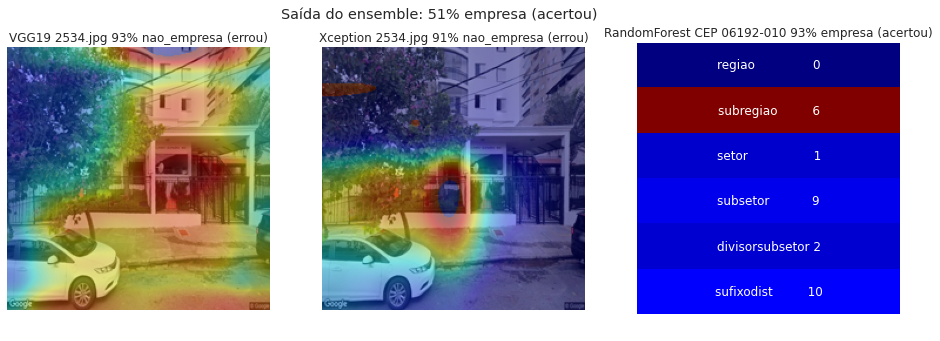

In [ ]:
# Exemplo de uso
classificaComEnsemble(path + 'imagens_empresas//2534.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)

### 6.3.4) Casos de empresas que o _ensemble_ acertou


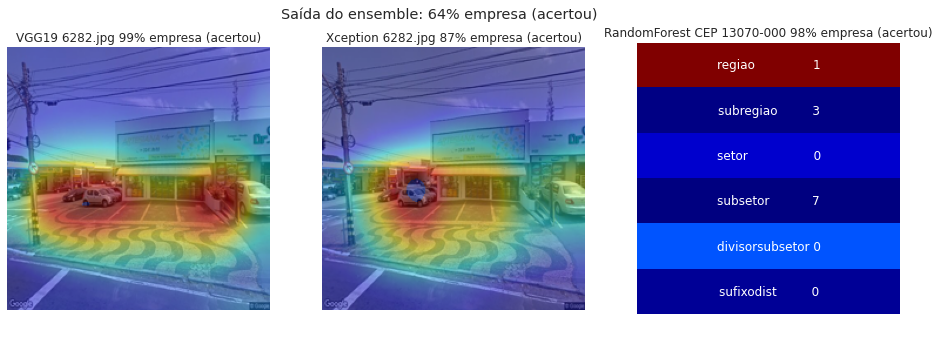

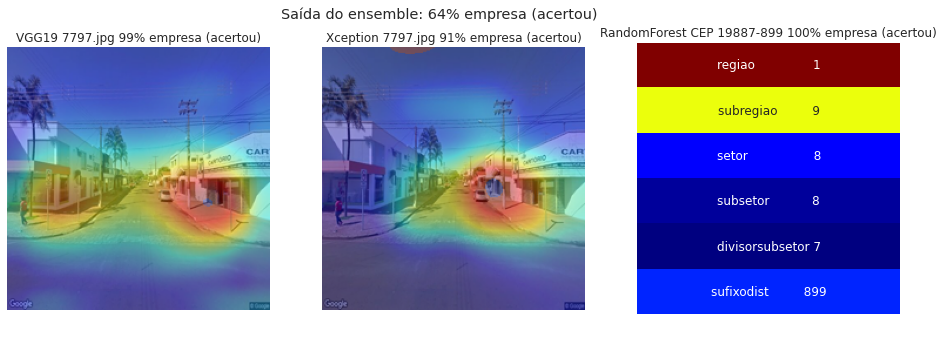

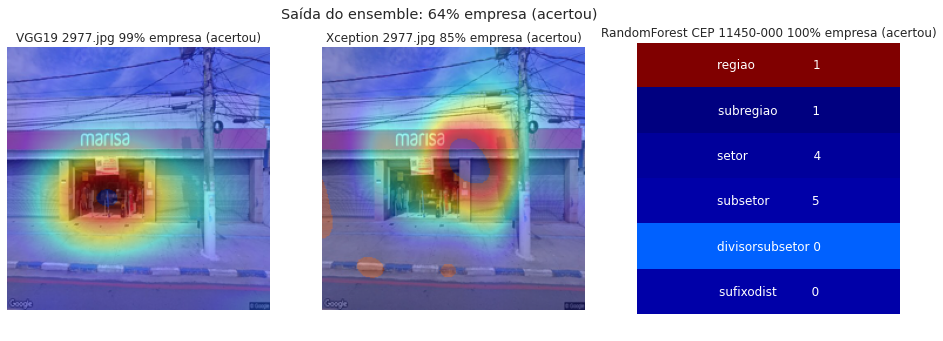

In [ ]:
# empresas com maior confiança
classificaComEnsemble(path + 'imagens_empresas//6282.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)
classificaComEnsemble(path + 'imagens_empresas//7797.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)
classificaComEnsemble(path + 'imagens_empresas//2977.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)

### 6.3.5) Casos de não empresas que o _ensemble_ acertou

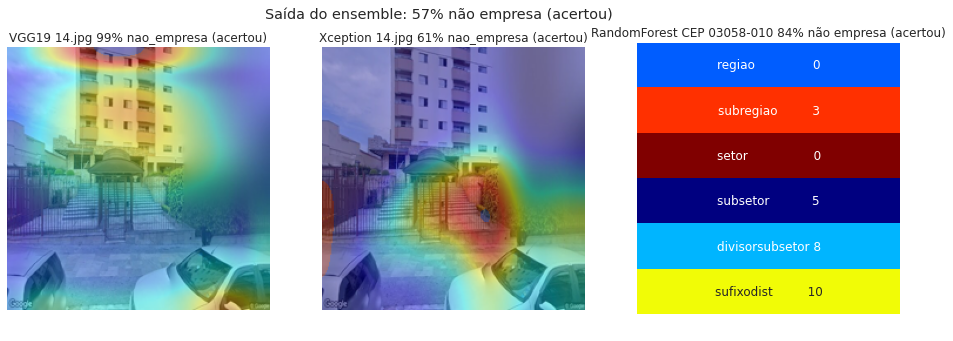

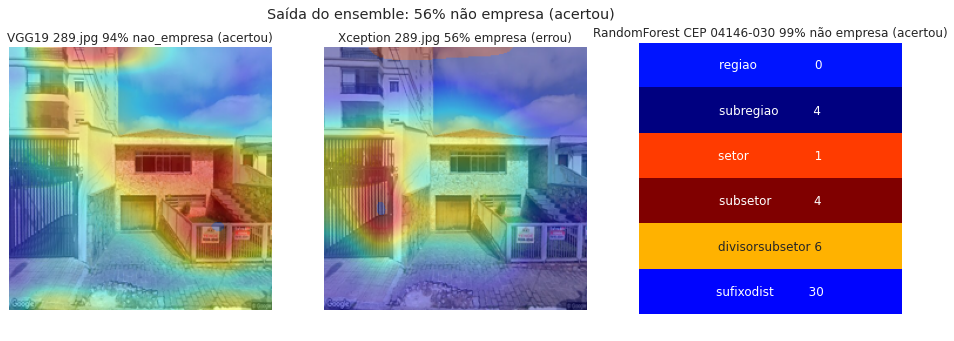

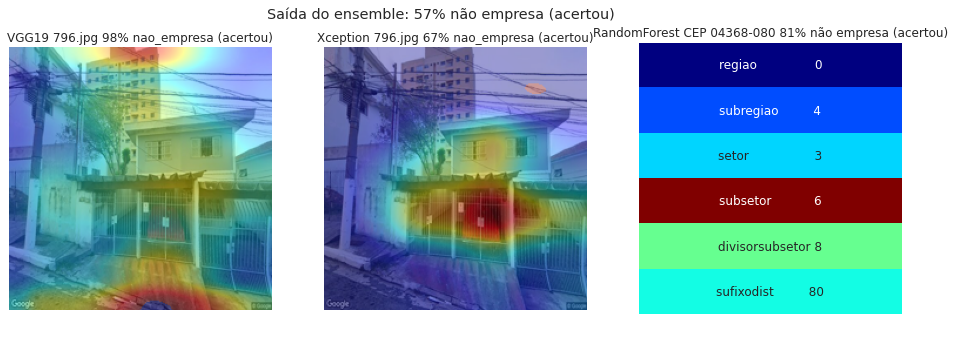

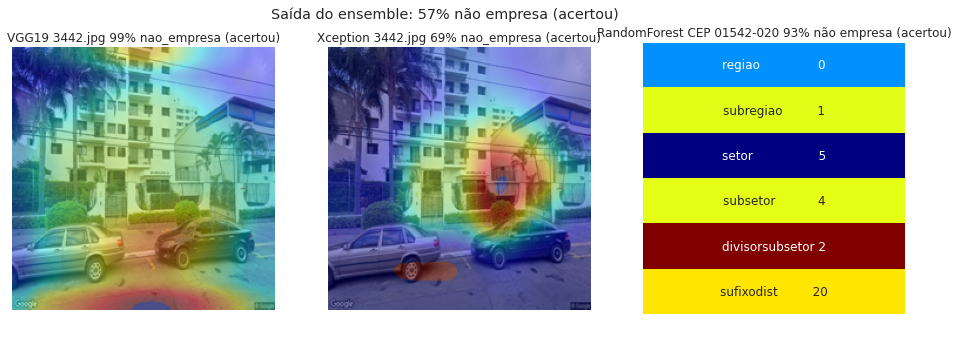

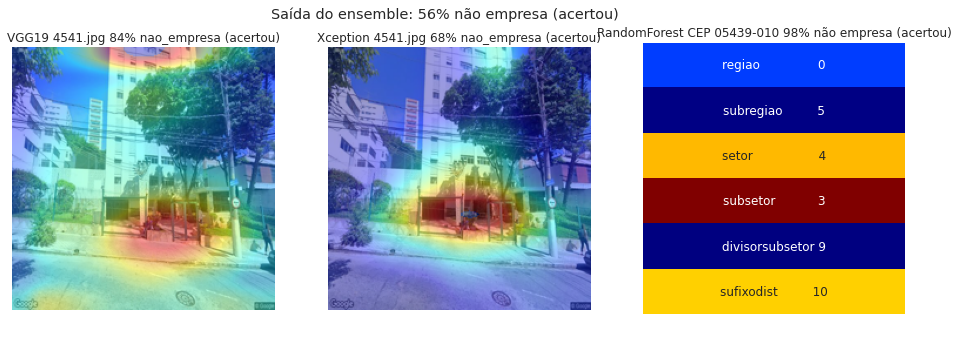

In [ ]:
# não empresas com maior confiança
path = '//content//test//'

classificaComEnsemble(path + 'imagens_nao_empresas//14.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)
classificaComEnsemble(path + 'imagens_nao_empresas//289.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)
classificaComEnsemble(path + 'imagens_nao_empresas//796.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)
classificaComEnsemble(path + 'imagens_nao_empresas//3442.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)
classificaComEnsemble(path + 'imagens_nao_empresas//4541.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)

### 6.3.6) Casos de não-empresas que o _ensemble_ errou

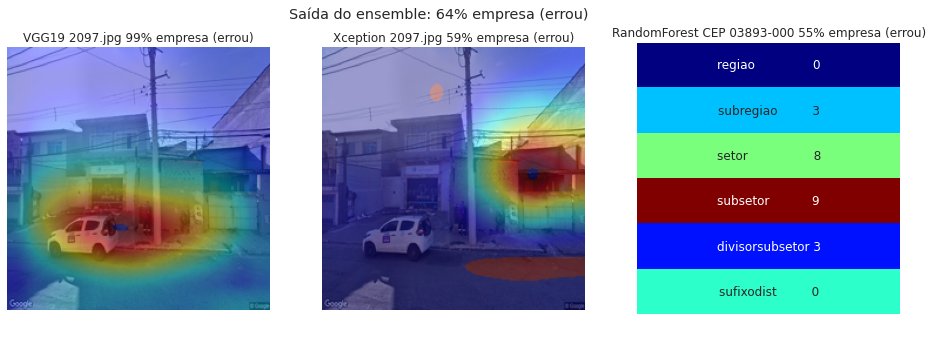

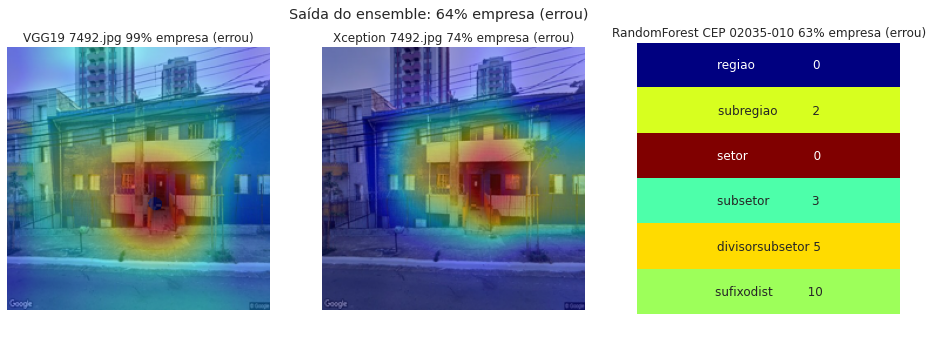

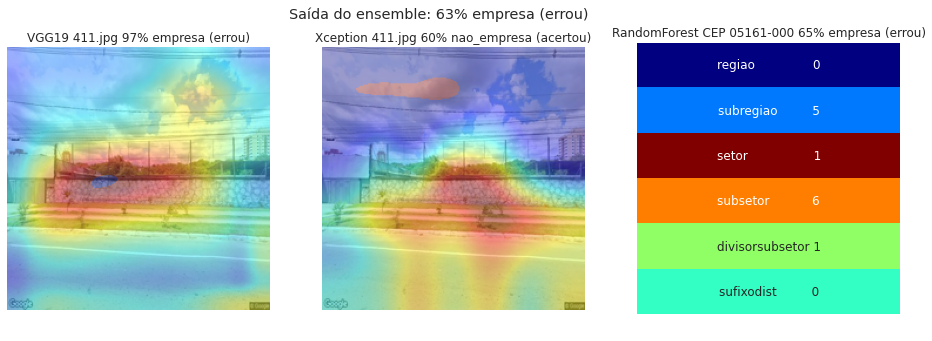

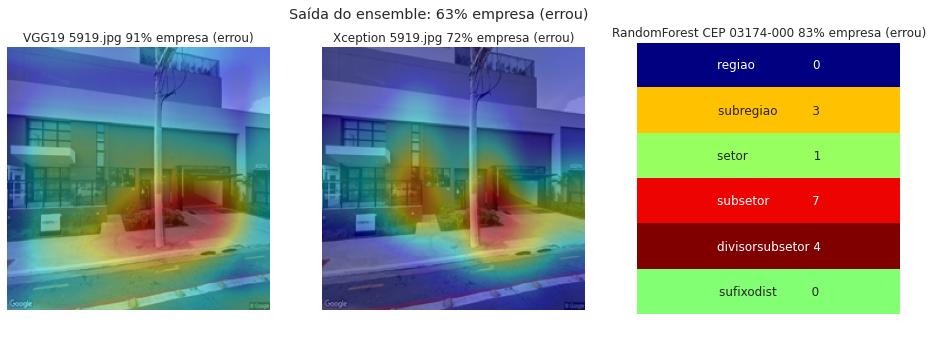

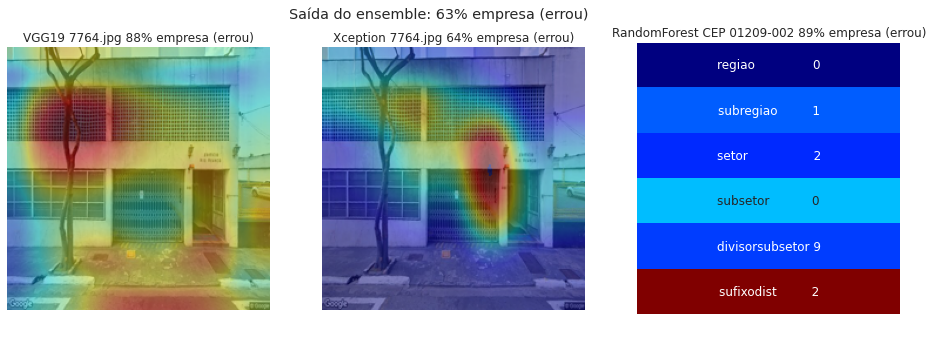

In [ ]:
# 5 piores erros de classificação de não-empresas (erros com confiança alta)
classificaComEnsemble(path + 'imagens_nao_empresas//2097.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)
classificaComEnsemble(path + 'imagens_nao_empresas//7492.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)
classificaComEnsemble(path + 'imagens_nao_empresas//411.jpg' , vgg19b, xception, random_forest, ensemble, dadosTabulares)
classificaComEnsemble(path + 'imagens_nao_empresas//5919.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)
classificaComEnsemble(path + 'imagens_nao_empresas//7764.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)

### 6.3.7) Casos de empresas que o _ensemble_ errou

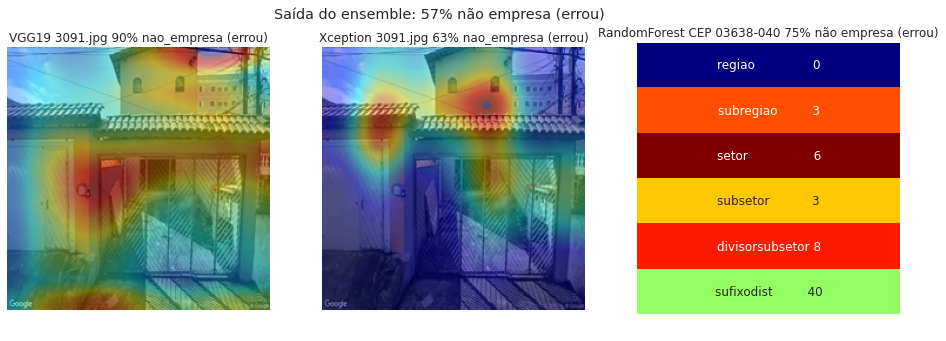

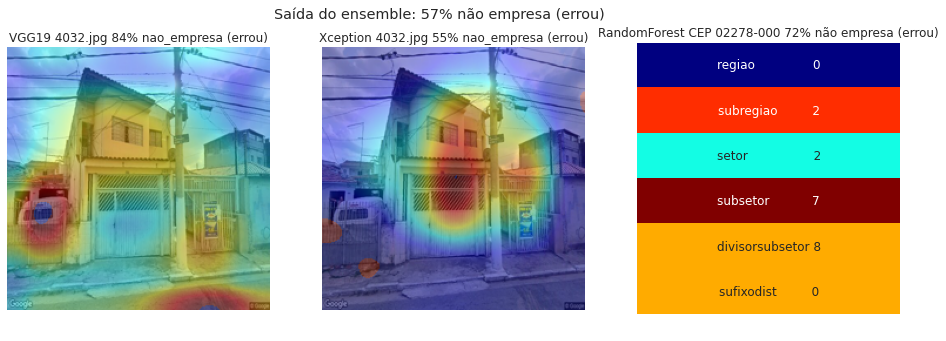

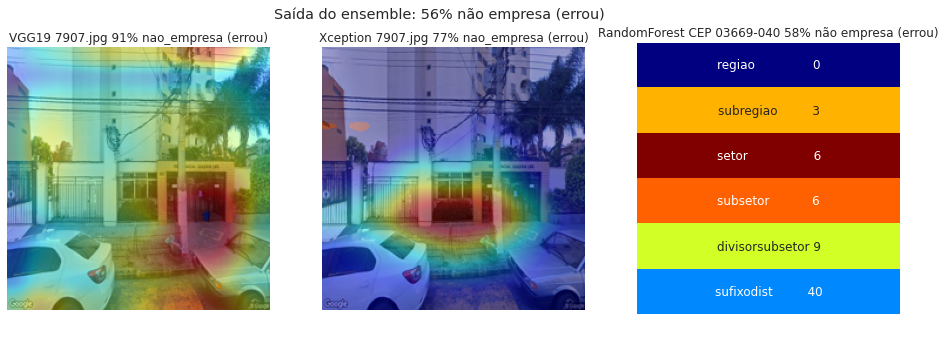

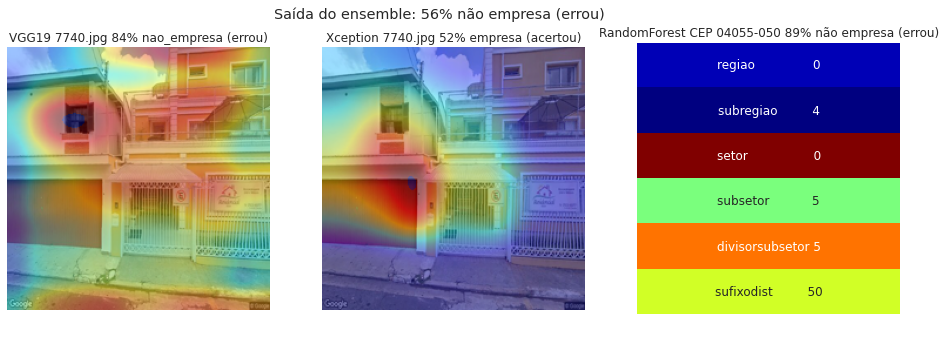

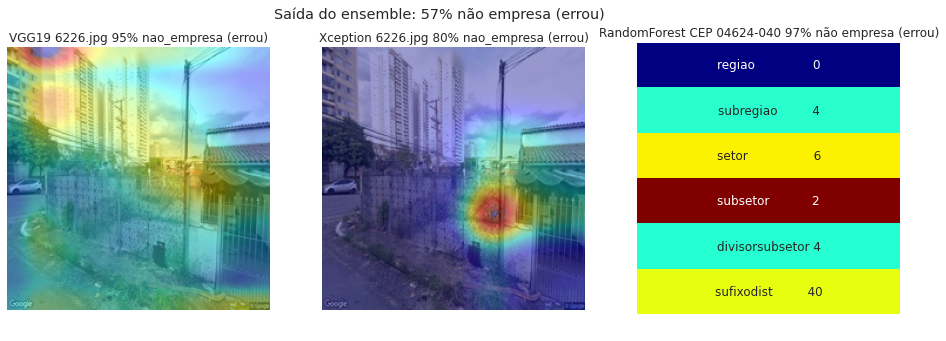

In [ ]:
# 5 piores erros de classificação de empresas (erros com confiança alta)
classificaComEnsemble(path + 'imagens_empresas//3091.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)
classificaComEnsemble(path + 'imagens_empresas//4032.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)
classificaComEnsemble(path + 'imagens_empresas//7907.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)
classificaComEnsemble(path + 'imagens_empresas//7740.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)
classificaComEnsemble(path + 'imagens_empresas//6226.jpg', vgg19b, xception, random_forest, ensemble, dadosTabulares)


### 6.3.8) Testando o resultado da RandomForest separadamente

array([1.])

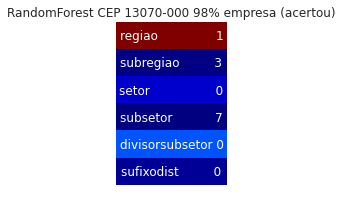

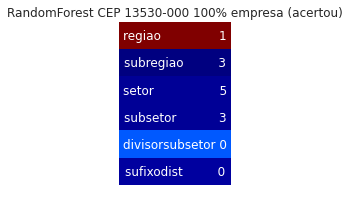

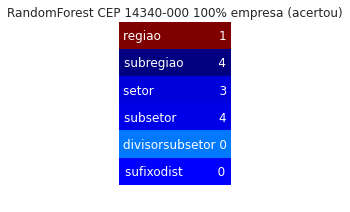

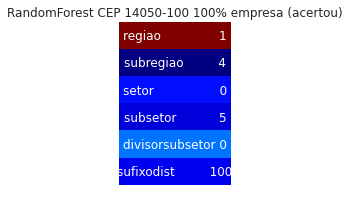

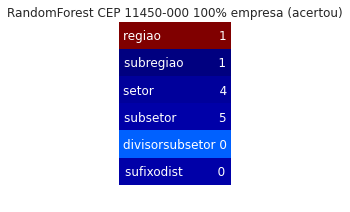

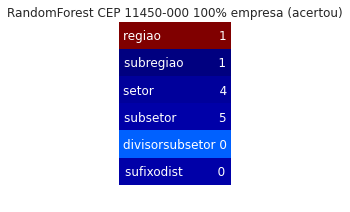

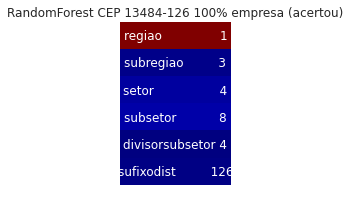

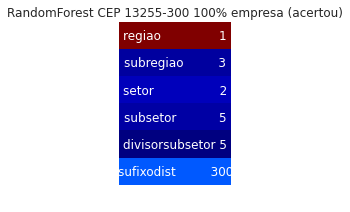

In [ ]:
prop = (2, 3)

fig,ax = plt.subplots(figsize=prop)
linhaDadosTabulares = dadosTabulares[dadosTabulares['Arquivo'] == 'imagens_empresas/6282.jpg']
mapa_ativacao_CEP(random_forest, linhaDadosTabulares, ax)

fig,ax = plt.subplots(figsize=prop)
linhaDadosTabulares = dadosTabulares[dadosTabulares['Arquivo'] == 'imagens_empresas/2266.jpg']
mapa_ativacao_CEP(random_forest, linhaDadosTabulares, ax)

fig,ax = plt.subplots(figsize=prop)
linhaDadosTabulares = dadosTabulares[dadosTabulares['Arquivo'] == 'imagens_empresas/7587.jpg']
mapa_ativacao_CEP(random_forest, linhaDadosTabulares, ax)

fig,ax = plt.subplots(figsize=prop)
linhaDadosTabulares = dadosTabulares[dadosTabulares['Arquivo'] == 'imagens_empresas/7736.jpg']
mapa_ativacao_CEP(random_forest, linhaDadosTabulares, ax)

fig,ax = plt.subplots(figsize=prop)
linhaDadosTabulares = dadosTabulares[dadosTabulares['Arquivo'] == 'imagens_empresas/2977.jpg']
mapa_ativacao_CEP(random_forest, linhaDadosTabulares, ax)

fig,ax = plt.subplots(figsize=prop)
linhaDadosTabulares = dadosTabulares[dadosTabulares['Arquivo'] == 'imagens_empresas/6995.jpg']
mapa_ativacao_CEP(random_forest, linhaDadosTabulares, ax)

fig,ax = plt.subplots(figsize=prop)
linhaDadosTabulares = dadosTabulares[dadosTabulares['Arquivo'] == 'imagens_empresas/4795.jpg']
mapa_ativacao_CEP(random_forest, linhaDadosTabulares, ax)

fig,ax = plt.subplots(figsize=prop)
linhaDadosTabulares = dadosTabulares[dadosTabulares['Arquivo'] == 'imagens_empresas/6238.jpg']
mapa_ativacao_CEP(random_forest, linhaDadosTabulares, ax)
